# Importar librerías

In [818]:
!pip install -q lime # para el método de interpretabilidad LIME

In [819]:
# ======================================================
# LIBRERÍAS PARA MANIPULACIÓN Y ANÁLISIS DE DATOS
# ======================================================
import pandas as pd
import numpy as np
import joblib

# ======================================================
# LIBRERÍAS PARA VISUALIZACIÓN DE DATOS
# ======================================================
import matplotlib.pyplot as plt
import seaborn as sns

# ======================================================
# LIBRERÍAS PARA PREPROCESAMIENTO DE DATOS (SKLEARN)
# ======================================================
from sklearn.preprocessing import MinMaxScaler, StandardScaler # Escalado de features
from sklearn.preprocessing import OneHotEncoder                # Codificación de categóricas
from sklearn.impute import SimpleImputer                       # Tratamiento de valores faltantes
from sklearn.compose import ColumnTransformer                  # Transformaciones por columnas
from sklearn.decomposition import PCA

# ======================================================
# LIBRERÍAS PARA SELECCIÓN DE CARACTERÍSTICAS
# ======================================================
from sklearn.feature_selection import SelectKBest, mutual_info_classif      # Métodos filter
#from statsmodels.stats.outliers_influence import variance_inflation_factor  # Multicolinealidad (VIF)  NO USADA DE MOMENTO

# ======================================================
# LIBRERÍAS PARA MODELADO Y EVALUACIÓN (SKLEARN)
# ======================================================
from xgboost import XGBClassifier                         # XGBoost
from sklearn.ensemble import RandomForestClassifier       # Random Forest
from sklearn.neural_network import MLPClassifier          # Redes Neuronales
from sklearn.tree import DecisionTreeClassifier, plot_tree # Árboles de decisión
from sklearn.model_selection import train_test_split      # División train-test
from sklearn.model_selection import cross_val_score        # Validación cruzada
from sklearn.model_selection import GridSearchCV          # Búsqueda de hiperparámetros
from sklearn.pipeline import Pipeline                     # Creación de pipelines
from sklearn.metrics import (                             # Métricas de evaluación:
    roc_auc_score, roc_curve, auc,                         # - Curvas ROC/AUC
    confusion_matrix, classification_report,               # - Matriz de confusión y reportes
    precision_recall_curve, average_precision_score,       # - Curvas Precision-Recall
    f1_score, recall_score                                 # - Métricas adicionales
)
import time
from sklearn.tree import export_graphviz
import graphviz


# ======================================================
# LIBRERÍAS PARA PRUEBAS ESTADÍSTICAS
# ======================================================
from scipy.stats import kruskal, mannwhitneyu, ttest_ind  # Tests no paramétricos y paramétricos
from scipy.stats import chi2_contingency                  # Test chi-cuadrado para categóricas
from scipy.stats import probplot, skew, kurtosis, kstest

# ======================================================
# LIBRERÍAS PARA INTERPRETABILIDAD DE MODELOS
# ======================================================
from lime.lime_tabular import LimeTabularExplainer  # Explicaciones locales (LIME)



from scipy.stats import f_oneway

# Paleta de colores

In [820]:
%%writefile palette.py

COLOR_MAP_LOAN_STATUS = {
    0: "#A8D8B9",  # Verde menta pastel → No incumplidor
    1: "#F2B5D4"   # Rosa pastel → Incumplidor
}


def get_loan_status_colors():
    return [COLOR_MAP_LOAN_STATUS['0'], COLOR_MAP_LOAN_STATUS['1']]

def get_palette_from_dict(mapping, ordered_keys=None):
    if ordered_keys is None:
        return list(mapping.values())
    return [mapping[key] for key in ordered_keys]

Overwriting palette.py


In [821]:
from palette import get_loan_status_colors, COLOR_MAP_LOAN_STATUS, get_palette_from_dict

# Cargar los datos

In [822]:
# Nuestra base de datos es de : 'https://www.kaggle.com/datasets/laotse/credit-risk-dataset?resource=download'

# Clonamos el repositorio para cargar el csv
!git clone "https://github.com/belenllornte/TFM"

# Leemos el dataset subido al repositorio:
df = pd.read_csv('TFM/credit_risk_dataset.csv')

# Convertir tipos automáticamente
df = df.convert_dtypes()

fatal: destination path 'TFM' already exists and is not an empty directory.


In [823]:
df.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5,EDUCATION,B,1000,11.14,0,0.1,N,2
2,25,9600,MORTGAGE,1,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8,MEDICAL,C,35000,14.27,1,0.55,Y,4


In [824]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32581 entries, 0 to 32580
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  32581 non-null  Int64  
 1   person_income               32581 non-null  Int64  
 2   person_home_ownership       32581 non-null  string 
 3   person_emp_length           31686 non-null  Int64  
 4   loan_intent                 32581 non-null  string 
 5   loan_grade                  32581 non-null  string 
 6   loan_amnt                   32581 non-null  Int64  
 7   loan_int_rate               29465 non-null  Float64
 8   loan_status                 32581 non-null  Int64  
 9   loan_percent_income         32581 non-null  Float64
 10  cb_person_default_on_file   32581 non-null  string 
 11  cb_person_cred_hist_length  32581 non-null  Int64  
dtypes: Float64(2), Int64(6), string(4)
memory usage: 3.2 MB


In [825]:
df.columns

Index(['person_age', 'person_income', 'person_home_ownership',
       'person_emp_length', 'loan_intent', 'loan_grade', 'loan_amnt',
       'loan_int_rate', 'loan_status', 'loan_percent_income',
       'cb_person_default_on_file', 'cb_person_cred_hist_length'],
      dtype='object')

In [826]:
print(f'Número de columnas en el dataframe inicial: {df.shape[1]}')
print(f'Número de instancias en el dataframe inicial: {df.shape[0]}')

Número de columnas en el dataframe inicial: 12
Número de instancias en el dataframe inicial: 32581


Categorias de las variables categóricas:

In [827]:
columnas_categoricas=['person_home_ownership','loan_intent','loan_grade','cb_person_default_on_file']
for col in columnas_categoricas:
    print(f"{col}: {df[col].unique()}")

person_home_ownership: <StringArray>
['RENT', 'OWN', 'MORTGAGE', 'OTHER']
Length: 4, dtype: string
loan_intent: <StringArray>
[         'PERSONAL',         'EDUCATION',           'MEDICAL',
           'VENTURE',   'HOMEIMPROVEMENT', 'DEBTCONSOLIDATION']
Length: 6, dtype: string
loan_grade: <StringArray>
['D', 'B', 'C', 'A', 'E', 'F', 'G']
Length: 7, dtype: string
cb_person_default_on_file: <StringArray>
['Y', 'N']
Length: 2, dtype: string


# Comprensión de los datos

Significado de las variables:

**person_age**	-- Edad

**person_income**	-- Salario anual

**person_home_ownership**	-- Tipo de vivienda

**person_emp_length**	-- Años empleado

**loan_intent**	-- Propósito del préstamo (educativo, sanidad, emprendimiento)

**loan_grade**	-- Grado del préstamo (A,B,C,D,E,F,G) (a mayor grado mayor riesgo de impago)

**loan_amnt**	-- Monto solicitado

**loan_int_rate**	-- Tasa de interés del crédito

**loan_status**	-- Estado del préstamo (0 no hay incumplimiento, 1 hay incumplimiento)

**loan_percent_income**	-- Porcentaje del sueldo dedicado a pagar el préstamo

**cb_person_default_on_file**	-- Historial de incumplimiento (yes/no)

**cb_preson_cred_hist_length**	-- Años de historial crediticio

In [828]:
# Conteo absoluto por clase de loan_status
conteo_total = df['loan_status'].value_counts()

# Porcentaje por clase
porcentaje_total = (conteo_total / len(df) * 100).round(2)

# Mostrar resultados
print("Conteo total por loan_status:")
print(conteo_total)
print("\nPorcentaje por clase:")
print(porcentaje_total)

Conteo total por loan_status:
loan_status
0    25473
1     7108
Name: count, dtype: Int64

Porcentaje por clase:
loan_status
0    78.18
1    21.82
Name: count, dtype: Float64


### Valores nulos

In [829]:
df.isnull().sum()

,0
person_age,0
person_income,0
person_home_ownership,0
person_emp_length,895
loan_intent,0
loan_grade,0
loan_amnt,0
loan_int_rate,3116
loan_status,0
loan_percent_income,0


Visualicemos un poco estos nulos en cada categoría:

In [830]:
df[df['person_emp_length'].isnull()]

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
105,22,12600,MORTGAGE,<NA>,PERSONAL,A,2000,5.42,1,0.16,N,4
222,24,185000,MORTGAGE,<NA>,EDUCATION,B,35000,12.42,0,0.19,N,2
379,24,16800,MORTGAGE,<NA>,DEBTCONSOLIDATION,A,3900,<NA>,1,0.23,N,3
407,25,52000,RENT,<NA>,PERSONAL,B,24000,10.74,1,0.46,N,2
408,22,17352,MORTGAGE,<NA>,EDUCATION,C,2250,15.27,0,0.13,Y,3
...,...,...,...,...,...,...,...,...,...,...,...,...
32285,38,12000,OWN,<NA>,EDUCATION,A,4800,7.29,1,0.4,N,12
32328,51,18408,RENT,<NA>,PERSONAL,C,1000,14.65,1,0.05,Y,20
32360,70,39996,RENT,<NA>,MEDICAL,C,3600,15.23,0,0.09,Y,19
32453,56,32400,RENT,<NA>,MEDICAL,A,8575,7.51,0,0.26,N,18


In [831]:
df[df['loan_int_rate'].isnull()]

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
39,23,71500,RENT,3,DEBTCONSOLIDATION,D,30000,<NA>,1,0.42,N,4
50,24,78000,RENT,4,DEBTCONSOLIDATION,D,30000,<NA>,1,0.38,Y,4
57,23,277000,OWN,3,PERSONAL,A,35000,<NA>,0,0.13,N,4
59,24,12000,OWN,2,VENTURE,E,1750,<NA>,0,0.15,Y,3
62,26,263000,MORTGAGE,0,EDUCATION,B,10000,<NA>,1,0.04,N,4
...,...,...,...,...,...,...,...,...,...,...,...,...
32547,53,4888,OWN,0,VENTURE,C,1400,<NA>,1,0.29,Y,28
32552,65,45900,RENT,2,EDUCATION,C,10000,<NA>,0,0.22,Y,19
32553,54,20000,RENT,2,MEDICAL,C,5000,<NA>,0,0.25,N,28
32569,51,60000,MORTGAGE,1,PERSONAL,A,7500,<NA>,0,0.13,N,23


Dado que el dataset contiene un número considerable de instancias (32581), nos podemos permitir eliminar todos los valores nulos sin comprometer la representatividad del conjunto. Haciendo además hincapié en el objetivo principal de este TFM que es la interpretabilidad de modelos complejos. Por tanto, así evitamos introducir ruido o patrones artificiales asegurando una mayor transparencia en el análisis posterior.


In [832]:
df= df.dropna()

In [833]:
print(f'Ahora tenemos un total de {df.shape[0]} instancias.')

Ahora tenemos un total de 28638 instancias.


Hemos eliminado un total de 3943 instancias.

In [834]:
3943/32581

0.1210214542217857

Comprobar proporción de la target tras la eliminación de nulos:

In [835]:
# Conteo absoluto por clase de loan_status
conteo_total = df['loan_status'].value_counts()

# Porcentaje por clase
porcentaje_total = (conteo_total / len(df) * 100).round(2)

# Mostrar resultados
print("Conteo total por loan_status:")
print(conteo_total)
print("\nPorcentaje por clase:")
print(porcentaje_total)

Conteo total por loan_status:
loan_status
0    22435
1     6203
Name: count, dtype: Int64

Porcentaje por clase:
loan_status
0    78.34
1    21.66
Name: count, dtype: Float64


### Duplicados

Es fundamental revisar si existen registros duplicados en el conjunto de datos. Las instancias duplicadas pueden introducir un sesgo artificial, ya que el modelo podría aprender patrones repetidos en lugar de generalizarlos correctamente. Además, podrían inflar las métricas de evaluación al hacer que el modelo parezca más preciso de lo que realmente es, simplemente por haber memorizado observaciones repetidas. Por ello, identificamos y eliminamos los duplicados exactos para asegurar la calidad del análisis.

In [836]:
# Identificamos todas las filas duplicadas (aquellas que aparecen al menos dos veces en el dataset)
duplicados = df[df.duplicated(keep=False)]

# Contamos cuántas veces se repite cada fila duplicada
conteo_repeticiones = duplicados.value_counts()

# Contamos cuántos grupos distintos hay según el número de repeticiones
resumen_repeticiones = conteo_repeticiones.value_counts().sort_index()
display(resumen_repeticiones)

,count
count,
2,137


Es decir, hay 137 instancias que se repiten una segunda vez.

In [837]:
# Mostramos las filas duplicadas ordenadas para facilitar su revisión visual
duplicados_ordenados = duplicados.sort_values(by=df.columns.tolist())
display(duplicados_ordenados)

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
2431,21,15600,RENT,0,MEDICAL,A,2800,7.4,1,0.18,N,4
17758,21,15600,RENT,0,MEDICAL,A,2800,7.4,1,0.18,N,4
2498,21,18000,RENT,0,DEBTCONSOLIDATION,A,3000,7.9,1,0.17,N,2
17601,21,18000,RENT,0,DEBTCONSOLIDATION,A,3000,7.9,1,0.17,N,2
6191,21,26000,RENT,5,DEBTCONSOLIDATION,A,6000,7.49,0,0.23,N,2
...,...,...,...,...,...,...,...,...,...,...,...,...
31947,40,38000,RENT,4,DEBTCONSOLIDATION,D,7000,15.99,1,0.18,N,16
29831,42,39996,MORTGAGE,2,HOMEIMPROVEMENT,A,2500,5.42,0,0.06,N,12
32010,42,39996,MORTGAGE,2,HOMEIMPROVEMENT,A,2500,5.42,0,0.06,N,12
31676,49,120000,MORTGAGE,12,MEDICAL,B,12000,10.99,0,0.1,N,12


In [838]:
# Contamos cuántas filas duplicadas hay por valor de loan_status
conteo_duplicados = duplicados_ordenados['loan_status'].value_counts()

# Total de duplicados
total_duplicados = len(duplicados_ordenados)

# Porcentajes
porcentajes = (conteo_duplicados / total_duplicados * 100).round(2)

# Mostrar resultados
print("Conteo de duplicados por loan_status:")
print(conteo_duplicados)
print("\nPorcentaje de cada clase dentro de duplicados:")
print(porcentajes)

Conteo de duplicados por loan_status:
loan_status
0    244
1     30
Name: count, dtype: Int64

Porcentaje de cada clase dentro de duplicados:
loan_status
0    89.05
1    10.95
Name: count, dtype: Float64


Procedemos a su eliminación para evitar *data leakage*.

In [839]:
df = df.drop_duplicates()

In [840]:
print(f'Ahora tenemos un total de {df.shape[0]} instancias después de eliminar duplicados.')

Ahora tenemos un total de 28501 instancias después de eliminar duplicados.


Veamos la proporción del target tras la eliminación:

In [841]:
# Conteo absoluto por clase de loan_status
conteo_total = df['loan_status'].value_counts()

# Porcentaje por clase
porcentaje_total = (conteo_total / len(df) * 100).round(2)

# Mostrar resultados
print("Conteo total por loan_status:")
print(conteo_total)
print("\nPorcentaje por clase:")
print(porcentaje_total)


Conteo total por loan_status:
loan_status
0    22313
1     6188
Name: count, dtype: Int64

Porcentaje por clase:
loan_status
0    78.29
1    21.71
Name: count, dtype: Float64


### Cálculo de la variable 'loan_percent_income'

In [842]:
# Creamos una nueva columna calculada manualmente
df['loan_percent_income_calc'] = df['loan_amnt'] / df['person_income']


df[['loan_percent_income', 'loan_percent_income_calc']].head(20)


,loan_percent_income,loan_percent_income_calc
0,0.59,0.59322
1,0.1,0.104167
2,0.57,0.572917
3,0.53,0.534351
4,0.55,0.643382
5,0.25,0.252525
6,0.45,0.453956
7,0.44,0.443285
8,0.42,0.421687
9,0.16,0.16


In [843]:
original = df['loan_percent_income']
calculada_redondeando = (df['loan_amnt'] / df['person_income']).round(2)

# Coger solo las instancias que no coincidan
diff = original != calculada_redondeando

# Filtrar el DataFrame y mostrar las columnas relevantes
df_diff = df.loc[diff, ['loan_amnt', 'person_income', 'loan_percent_income']]
df_diff['loan_percent_income_calc'] = (df_diff['loan_amnt'] / df_diff['person_income']).round(2)


# Comparar y contar cuántos valores son distintos
diferencias = diff.sum()
print(f"Número de diferencias tras redondear la variable calculada a las centésimas : {diferencias}")
porcentaje = (diferencias / len(df)) * 100
print(f"Porcentaje de registros diferentes : {porcentaje:.2f}%")

# Mostrar las instancias
display(df_diff)

Número de diferencias tras redondear la variable calculada a las centésimas : 899
Porcentaje de registros diferentes : 3.15%


,loan_amnt,person_income,loan_percent_income,loan_percent_income_calc
4,35000,54400,0.55,0.64
17,35000,92111,0.32,0.38
36,30000,48000,0.63,0.62
40,30000,62050,0.41,0.48
48,30000,66300,0.38,0.45
...,...,...,...,...
32447,8000,64000,0.13,0.12
32480,25000,62050,0.34,0.4
32485,3000,24000,0.13,0.12
32542,3000,200000,0.01,0.02


Ahora vamos a comparar con distintos umbrales:

In [844]:
# Calcular la diferencia absoluta
df['loan_percent_income_diff'] = abs(df['loan_percent_income'] - df['loan_percent_income_calc'])

# Definir umbrales
thresholds = [0.01, 0.02, 0.05, 0.08, 0.09, 0.10]

# Contar y calcular los porcentajes según el umbral
for thresh in thresholds:
    count = (df['loan_percent_income_diff'] > thresh).sum()
    percentage = count / len(df) * 100
    print(f"Número de registros con diferencia > {thresh:.2f}: {count} ({percentage:.2f}%)")

Número de registros con diferencia > 0.01: 350 (1.23%)
Número de registros con diferencia > 0.02: 253 (0.89%)
Número de registros con diferencia > 0.05: 63 (0.22%)
Número de registros con diferencia > 0.08: 3 (0.01%)
Número de registros con diferencia > 0.09: 1 (0.00%)
Número de registros con diferencia > 0.10: 0 (0.00%)


In [845]:
df.drop(columns=['loan_percent_income_calc', 'loan_percent_income_diff'], axis=1, inplace=True)

### EDA

Dividimos el dataset en train (80%) y test (20%) :

In [846]:
df_train, df_test = train_test_split(df, test_size=0.2, random_state=42, stratify=df['loan_status'])

print("Train/Test Sizes : ", df_train.shape, df_test.shape)

Train/Test Sizes :  (22800, 12) (5701, 12)


Para el EDA hacemos uso sólo del df_train para evitar fugas de información (*data leakage*).

In [847]:
# Lista para almacenar la información
summary = []

# Función para calcular los valores por conjunto
def get_summary(name, subset, total_len):
    n_total = len(subset)
    n_0 = (subset['loan_status'] == 0).sum()
    n_1 = (subset['loan_status'] == 1).sum()

    return {
        'Conjunto': name,
        'Nº de Registros': n_total,
        '% Dataset': f"{(n_total / total_len) * 100:.2f}%",
        'loan_status = 0': n_0,
        '% loan_status = 0': f"{(n_0 / n_total) * 100:.2f}%",
        'loan_status = 1': n_1,
        '% loan_status = 1': f"{(n_1 / n_total) * 100:.2f}%"
    }

# Tamaño total
total_len = len(df)


summary.append(get_summary('TOTAL', df, total_len))
summary.append(get_summary('TRAIN', df_train, total_len))
summary.append(get_summary('TEST', df_test, total_len))

# Crear DataFrame
df_summary = pd.DataFrame(summary)
display(df_summary)

,Conjunto,Nº de Registros,% Dataset,loan_status = 0,% loan_status = 0,loan_status = 1,% loan_status = 1
0,TOTAL,28501,100.00%,22313,78.29%,6188,21.71%
1,TRAIN,22800,80.00%,17850,78.29%,4950,21.71%
2,TEST,5701,20.00%,4463,78.28%,1238,21.72%


 ##### **¿La tasa de interés es más alta entre los que incumplen?**

In [848]:
# tasa de interés media para cada valor de loan_status
df_train.groupby("loan_status")["loan_int_rate"].median()

,loan_int_rate
loan_status,
0,10.62
1,13.57


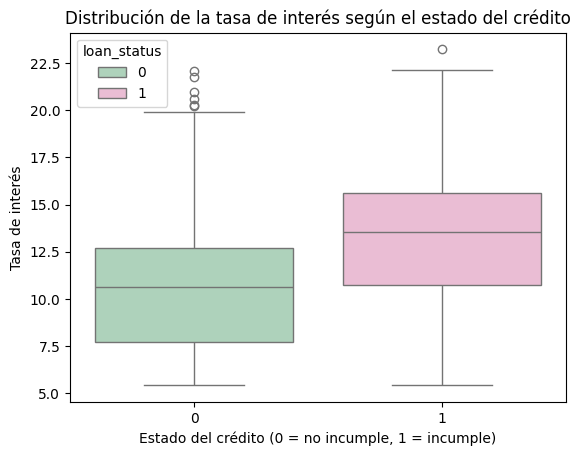

In [849]:
sns.boxplot(x="loan_status", y="loan_int_rate", data=df_train, palette=COLOR_MAP_LOAN_STATUS, hue="loan_status")
plt.xlabel("Estado del crédito (0 = no incumple, 1 = incumple)")
plt.ylabel("Tasa de interés")
plt.title("Distribución de la tasa de interés según el estado del crédito")
plt.show()

In [850]:
# Función para evaluar normalidad
def comprobar_normalidad(data, group_name):
    print(f"\n--- Grupo: {group_name} ---")
    print(f"Tamaño muestra: {len(data)}")

    # Gráficos
    plt.figure(figsize=(12, 4))

    # Histograma + densidad
    plt.subplot(1, 2, 1)
    sns.histplot(data, kde=True, color="#AFCBFF")
    plt.title(f'Histograma ({group_name})')

    # QQ-plot
    plt.subplot(1, 2, 2)
    probplot(data, dist="norm", plot=plt)
    plt.title(f'QQ-plot ({group_name})')
    plt.show()

    # Estadísticos
    skewness = skew(data)
    kurt = kurtosis(data)
    print(f"Asimetría (skewness): {skewness:.2f} ")
    print(f"Curtosis: {kurt:.2f} ")

    # Kolmogorov-Smirnov (para muestras grandes)
    ks_stat, ks_p = kstest(data, 'norm', args=(np.mean(data), np.std(data)))
    print(f"Prueba K-S: p-valor = {ks_p:.4f}")
    print("¿Normal? p-valor > 0.05:", ks_p > 0.05)


--- Grupo: Cumplidores ---
Tamaño muestra: 17850


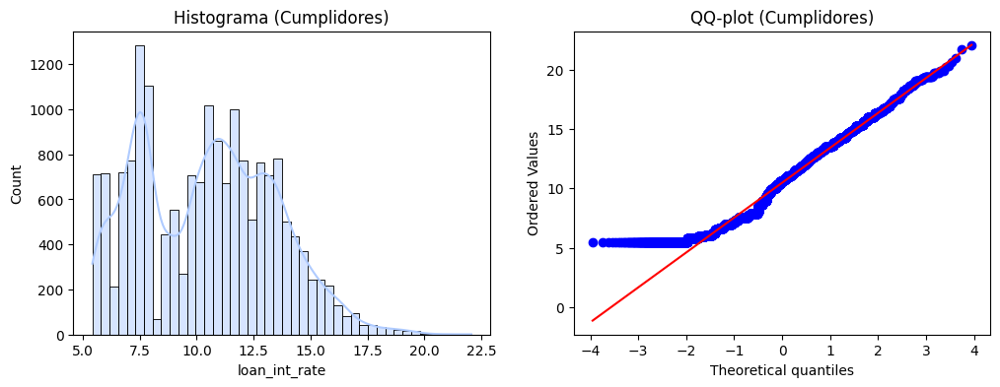

Asimetría (skewness): 0.22 
Curtosis: -0.69 
Prueba K-S: p-valor = 0.0000
¿Normal? p-valor > 0.05: False

--- Grupo: Incumplidores ---
Tamaño muestra: 4950


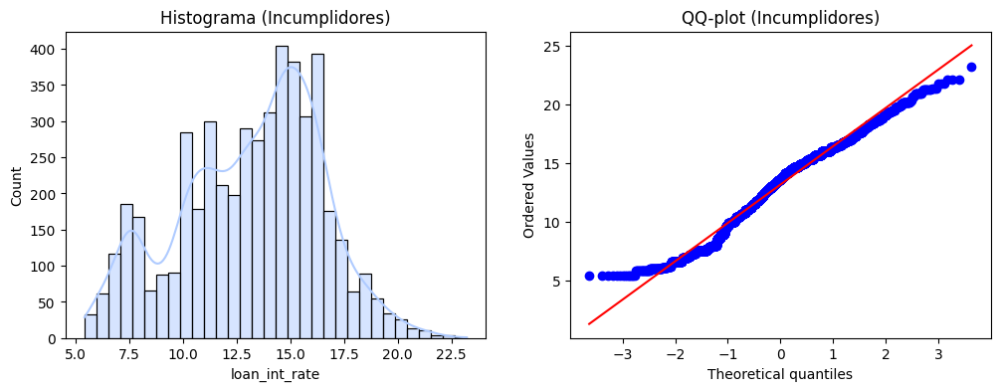

Asimetría (skewness): -0.28 
Curtosis: -0.51 
Prueba K-S: p-valor = 0.0000
¿Normal? p-valor > 0.05: False


In [851]:
# Filtrar datos por grupo
cumplidores = df_train[df_train['loan_status'] == 0]['loan_int_rate']
incumplidores = df_train[df_train['loan_status'] == 1]['loan_int_rate']

# Evaluar por grupo
comprobar_normalidad(cumplidores, "Cumplidores")
comprobar_normalidad(incumplidores, "Incumplidores")

Como los datos no son normales y los tamaños de muestra están desbalanceados (17,850 vs. 4,950).

In [852]:
u_stat, p_val = mannwhitneyu(cumplidores, incumplidores)
print(f"Estadístico U = {u_stat:.2f}, p-valor = {p_val:.4f}") # Si p_val < 0.05, la diferencia es estadísticamente significativa.

Estadístico U = 24091019.00, p-valor = 0.0000


In [853]:
median_cumplen = df_train[df_train['loan_status'] == 0]['loan_int_rate'].median()
median_incumplen = df_train[df_train['loan_status'] == 1]['loan_int_rate'].median()

print(f"Mediana cumplidores: {median_cumplen:.2f}")
print(f"Mediana incumplidores: {median_incumplen:.2f}")

Mediana cumplidores: 10.62
Mediana incumplidores: 13.57


Se rechaza la hipótesis nula.

Se observa una diferencia significativa en la tasa de interés (`loan_int_rate`) entre los clientes que incumplen y los que no. En promedio, los prestatarios con historial de impago presentan tasas de interés más elevadas (13%) frente a quienes no incumplen (10%). El test de Mann-Whitney arrojó un p-valor de 0.0, indicando una diferencia estadísticamente significativa en las distribuciones de ambas poblaciones.



##### **¿El tipo de vivienda tiene relación con la probabilidad de impago?**

**¿Algún tipo de `person_home_ownership` (ej: si está de alquiler, si la propiedad es suya o si está en una hipoteca) se asocia con mayor riesgo?**

In [854]:
pd.crosstab(df_train["person_home_ownership"], df_train["loan_status"], normalize="index")

loan_status,0,1
person_home_ownership,,
MORTGAGE,0.874577,0.125423
OTHER,0.697368,0.302632
OWN,0.937176,0.062824
RENT,0.685209,0.314791


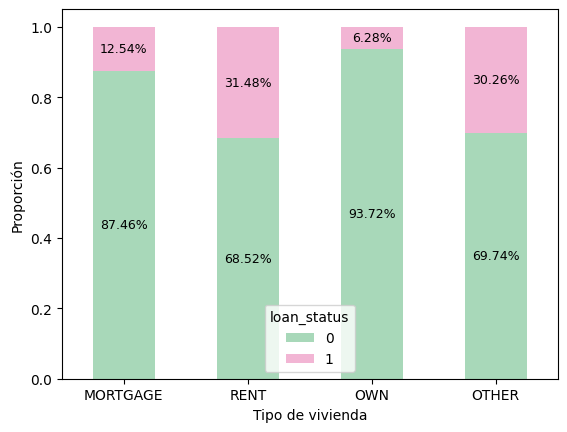

In [855]:
person_home_ownership_status = pd.crosstab(df_train['person_home_ownership'], df_train['loan_status'], normalize='index')

# Visualización
# Seleccionamos las categorías a graficar, en neustro caso son todas
subset = person_home_ownership_status.loc[['MORTGAGE','RENT','OWN','OTHER']]

# Plot apilado
ax = subset.plot(
    kind='bar',
    stacked=True,
    color=[COLOR_MAP_LOAN_STATUS[0], COLOR_MAP_LOAN_STATUS[1]]
)
# Añadir etiquetas con porcentaje
for i, (index, row) in enumerate(subset.iterrows()):
    cum_sum = 0
    for j, val in enumerate(row):
        if val > 0.02:  # Para evitar etiquetas en valores muy pequeños
            ax.text(
                i,                       # posición x (barra)
                cum_sum + val / 2,       # posición y (mitad del segmento)
                f'{val*100:.2f}%',       # % de cada categoria
                ha='center',
                va='center',
                color='black',
                fontsize=9
            )
        cum_sum += val

# Etiquetas y diseñoplt.title('Distribución de loan_status según person_home_ownership')
plt.ylabel('Proporción')
plt.xlabel('Tipo de vivienda')
plt.xticks(rotation=0)
plt.legend(title='loan_status', loc='lower center')
plt.show()

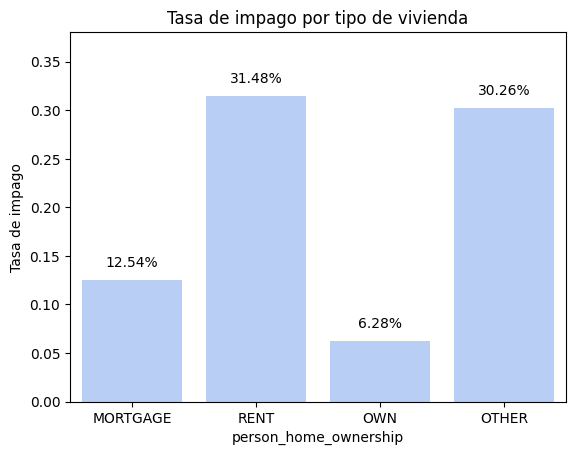

In [856]:
# Crear el barplot
ax = sns.barplot(
    x="person_home_ownership",
    y="loan_status",
    data=df_train,
    estimator=lambda x: sum(x) / len(x),
    errorbar=None,
    color="#AFCBFF"
)

# Añadir los porcentajes sobre cada barra, accediendo a las alturas reales
for bar in ax.patches:
    height = bar.get_height()
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        height + 0.01,
        f"{height * 100:.2f}%",
        ha='center',
        va='bottom'
    )

# Etiquetas y título
plt.ylabel("Tasa de impago")
plt.title("Tasa de impago por tipo de vivienda")
plt.ylim(0, ax.get_ylim()[1] + 0.05)
plt.show()

Posibles significados de *“other”* : Vivienda de un familiar, Cooperativas, residencias, viviendas cedidas por un familiar.

In [857]:
contingencia = pd.crosstab(df_train["person_home_ownership"], df_train["loan_status"])
chi2, p, dof, expected = chi2_contingency(contingencia)
print(f"p-valor: {p}")
# Si p < 0.05, hay evidencia estadística de que el tipo de vivienda está asociado al estado del préstamo.

p-valor: 6.980816182472695e-295


Por tanto, hay evidencia estadística de que el tipo de vivienda está asociado al estado del préstamo.

Estratificación por edad (person_age)

La relación entre tipo de vivienda e impago es robusta y no depende del ingreso/edad.

Aseguramo que no es una spurious relationship -

In [858]:
df_train['grupo_edad'] = df_train['person_age'].apply(lambda x: 'joven' if x < 25 else 'mayor')

def analizar_grupo(grupo_nombre):
    df_grupo = df_train[df_train['grupo_edad'] == grupo_nombre]
    tabla = pd.crosstab(df_grupo['person_home_ownership'], df_grupo['loan_status'])
    chi2, p, dof, expected = chi2_contingency(tabla)
    print(f"--- Grupo: {grupo_nombre} ---")
    print(f"Tamaño muestra: {len(df_grupo)}")
    print(f"p-valor: {p:.4f}")
    if p < 0.05:
        print("Relación significativa (p-valor < 0.05)")
    else:
        print("No hay relación significativa (p-valor ≥ 0.05)")
    print()

for grupo in ['joven', 'mayor']:
    analizar_grupo(grupo)


--- Grupo: joven ---
Tamaño muestra: 8589
p-valor: 0.0000
Relación significativa (p-valor < 0.05)

--- Grupo: mayor ---
Tamaño muestra: 14211
p-valor: 0.0000
Relación significativa (p-valor < 0.05)



In [859]:
print("Tabla de contingencia - Grupo joven:")
print(pd.crosstab(df_train[df_train['grupo_edad'] == 'joven']['person_home_ownership'],
                  df_train[df_train['grupo_edad'] == 'joven']['loan_status']))
print()

print("Tabla de contingencia - Grupo mayor:")
print(pd.crosstab(df_train[df_train['grupo_edad'] == 'mayor']['person_home_ownership'],
                  df_train[df_train['grupo_edad'] == 'mayor']['loan_status']))

Tabla de contingencia - Grupo joven:
loan_status               0     1
person_home_ownership            
MORTGAGE               2873   415
OTHER                    31     8
OWN                     616    50
RENT                   3086  1510

Tabla de contingencia - Grupo mayor:
loan_status               0     1
person_home_ownership            
MORTGAGE               5390   770
OTHER                    22    15
OWN                    1010    59
RENT                   4822  2123


In [860]:
df_train.drop('grupo_edad', axis=1, inplace=True)

##### **¿El porcentaje de ingreso destinado al préstamo (`loan_percent_income`) es más alto en los que incumplen?**

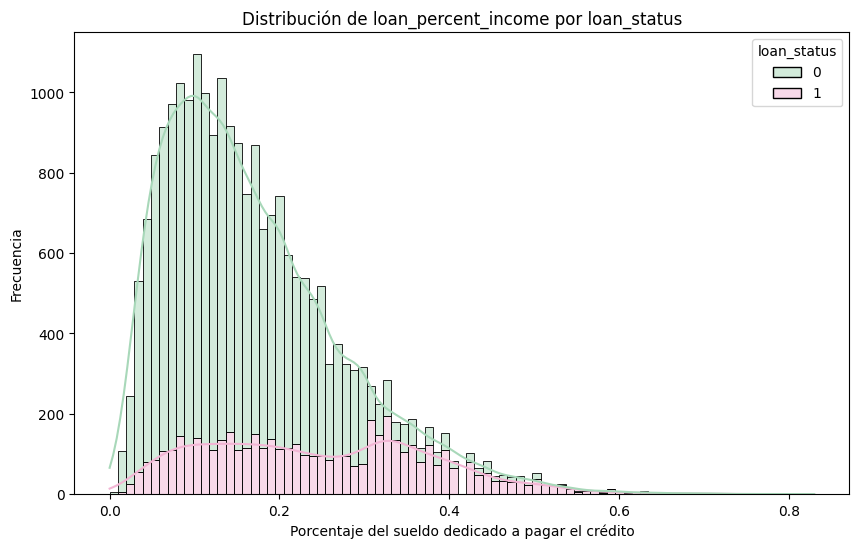

In [861]:
plt.figure(figsize=(10, 6))
sns.histplot(data=df_train, x="loan_percent_income", hue="loan_status", multiple="stack", palette=COLOR_MAP_LOAN_STATUS, kde=True)
plt.title("Distribución de loan_percent_income por loan_status")
plt.xlabel("Porcentaje del sueldo dedicado a pagar el crédito")
plt.ylabel("Frecuencia")
plt.show()

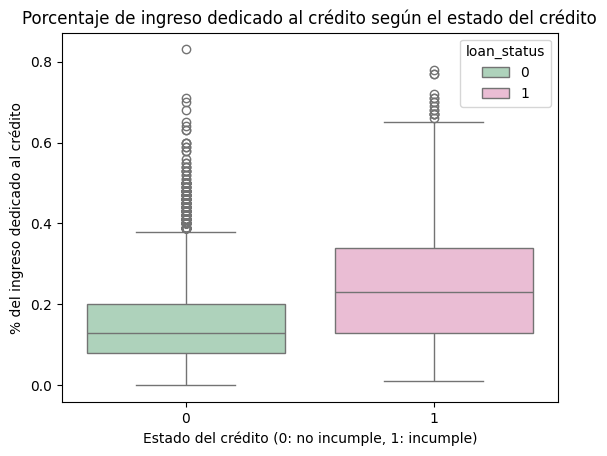

In [862]:
# Boxplot
sns.boxplot(x='loan_status', y='loan_percent_income', data=df_train, palette=COLOR_MAP_LOAN_STATUS, hue='loan_status')
plt.title('Porcentaje de ingreso dedicado al crédito según el estado del crédito')
plt.xlabel('Estado del crédito (0: no incumple, 1: incumple)')
plt.ylabel('% del ingreso dedicado al crédito')
plt.show()


--- Grupo: Cumplidores ---
Tamaño muestra: 17850


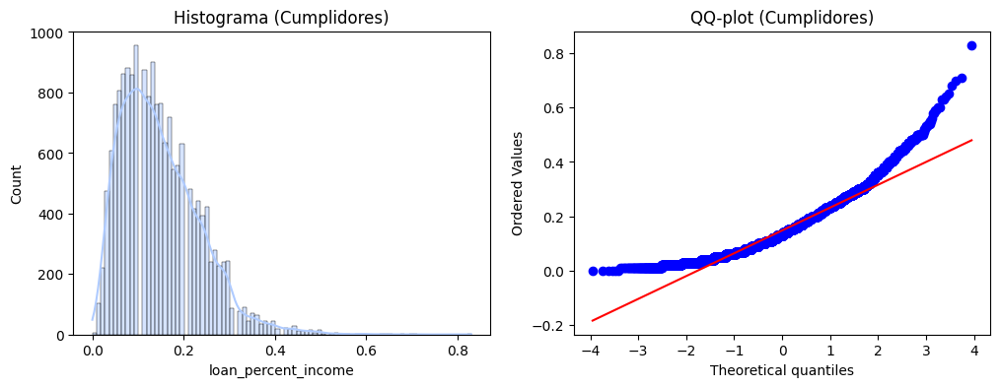

Asimetría (skewness): 1.02 
Curtosis: 1.69 
Prueba K-S: p-valor = 0.0000
¿Normal? p-valor > 0.05: False

--- Grupo: Incumplidores ---
Tamaño muestra: 4950


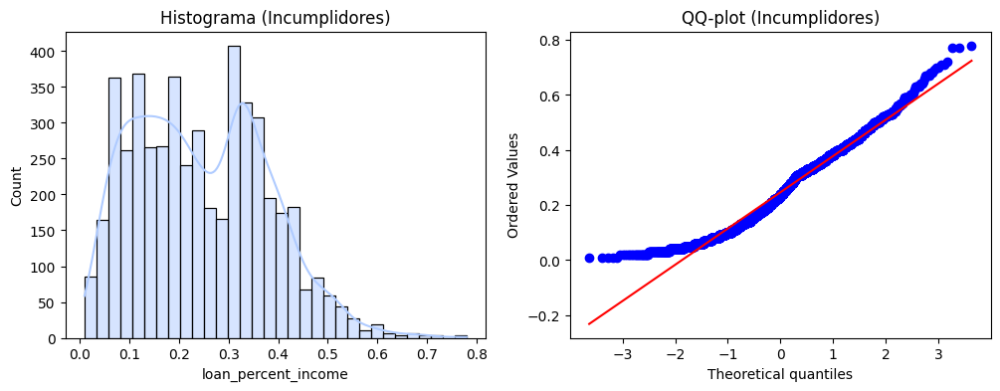

Asimetría (skewness): 0.39 
Curtosis: -0.41 
Prueba K-S: p-valor = 0.0000
¿Normal? p-valor > 0.05: False


In [863]:
# Filtrar los grupos desde el df_train
grupo0 = df_train[df_train['loan_status'] == 0]['loan_percent_income']
grupo1 = df_train[df_train['loan_status'] == 1]['loan_percent_income']

# Evaluar por grupo
comprobar_normalidad(grupo0, "Cumplidores")
comprobar_normalidad(grupo1, "Incumplidores")

In [864]:
# Calcular medias
media_0 = grupo0.median()
media_1 = grupo1.median()
display(f"Mediana loan_percent_income en el grupo de no incumplidores: {media_0:.4f}")
display(f"Mediana loan_percent_income en el grupo de incumplidores: {media_1:.4f}")

# prueba t de Student para muestras independientes
# comparamos las medias del porcentaje de ingreso dedicado al préstamo entre incumplidores y no.
t_stat, p_val = ttest_ind(grupo0, grupo1, equal_var=False)
display(f"p-valor de la prueba t de Student = {p_val:.4f}")

'Mediana loan_percent_income en el grupo de no incumplidores: 0.1300'

'Mediana loan_percent_income en el grupo de incumplidores: 0.2300'

'p-valor de la prueba t de Student = 0.0000'

In [865]:
grupo1 = df_train[df_train['loan_status'] == 0]['loan_percent_income']
grupo2 = df_train[df_train['loan_status'] == 1]['loan_percent_income']

u_stat, p_val = mannwhitneyu(grupo1, grupo2)
print(f"Estadístico U = {u_stat:.2f}, p-valor = {p_val:.4f}")

Estadístico U = 24908130.50, p-valor = 0.0000


##### **¿Los que tienen menor historial crediticio (`cb_person_cred_hist_length`) incumplen más?**


--- Grupo: Cumplidores ---
Tamaño muestra: 17850


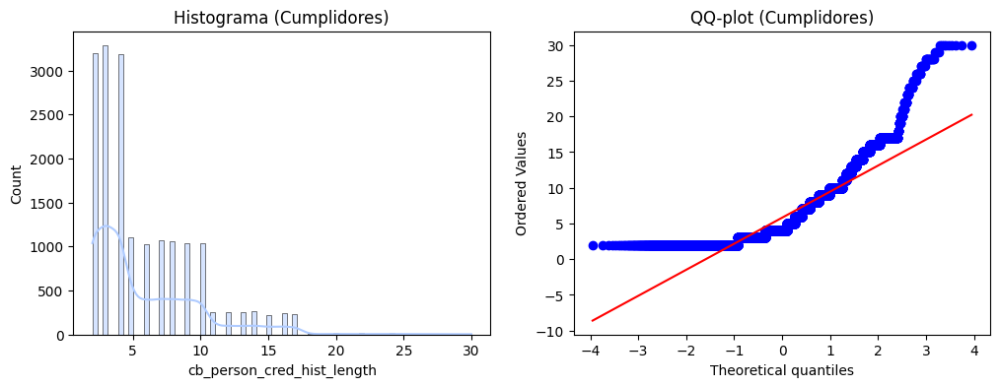

Asimetría (skewness): 1.61 
Curtosis: 3.41 
Prueba K-S: p-valor = 0.0000
¿Normal? p-valor > 0.05: False

--- Grupo: Incumplidores ---
Tamaño muestra: 4950


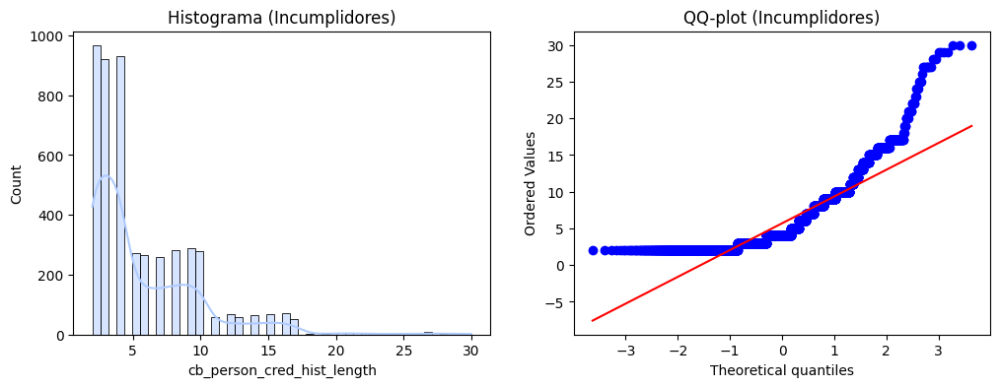

Asimetría (skewness): 1.79 
Curtosis: 4.38 
Prueba K-S: p-valor = 0.0000
¿Normal? p-valor > 0.05: False


In [866]:
grupo01 = df_train[df_train['loan_status'] == 0]['cb_person_cred_hist_length']
grupo02 = df_train[df_train['loan_status'] == 1]['cb_person_cred_hist_length']

comprobar_normalidad(grupo01, "Cumplidores")
comprobar_normalidad(grupo02, "Incumplidores")

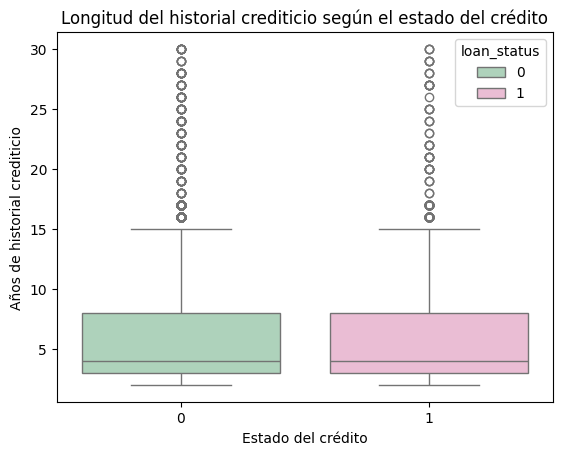

'Mediana cb_preson_cred_hist_length en el grupo de no incumplidores: 4.0000'

'Mediana cb_preson_cred_hist_length en el grupo de incumplidores: 4.0000'

Estadístico U = 45408714.00, p-valor = 0.0024


In [867]:
sns.boxplot(x='loan_status', y='cb_person_cred_hist_length', data=df_train, palette=COLOR_MAP_LOAN_STATUS, hue='loan_status')
plt.title('Longitud del historial crediticio según el estado del crédito')
plt.xlabel('Estado del crédito')
plt.ylabel('Años de historial crediticio')
plt.show()

hist0 = df[df['loan_status'] == 0]['cb_person_cred_hist_length']
hist1 = df[df['loan_status'] == 1]['cb_person_cred_hist_length']

display(f"Mediana cb_preson_cred_hist_length en el grupo de no incumplidores: {hist0.median():.4f}")
display(f"Mediana cb_preson_cred_hist_length en el grupo de incumplidores: {hist1.median():.4f}")

u_stat, p_val = mannwhitneyu(grupo01, grupo02)
print(f"Estadístico U = {u_stat:.2f}, p-valor = {p_val:.4f}")

##### **¿Qué categorías de `loan_intent` (propósito del préstamo) tienen mayor tasa de incumplimiento?**

,loan_status
loan_intent,
DEBTCONSOLIDATION,0.287299
MEDICAL,0.270283
HOMEIMPROVEMENT,0.259533
PERSONAL,0.198833
EDUCATION,0.169238
VENTURE,0.141878


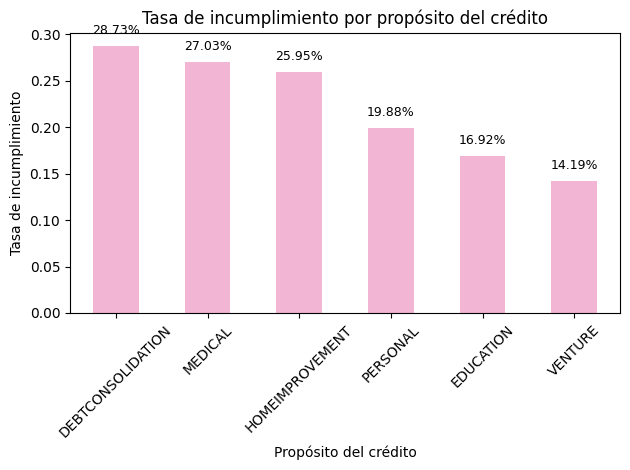

In [868]:
# Tasa de incumplimiento por categoría
tasa = df_train.groupby('loan_intent')['loan_status'].mean().sort_values(ascending=False)
display(tasa)

# Gráfico de barras
ax = tasa.plot(kind='bar', color=COLOR_MAP_LOAN_STATUS[1])
plt.title('Tasa de incumplimiento por propósito del crédito')
plt.ylabel('Tasa de incumplimiento')
plt.xlabel('Propósito del crédito')
plt.xticks(rotation=45)

# Añadir porcentajes sobre cada barra
for i, (index, value) in enumerate(tasa.items()):
    ax.text(i, value + 0.01, f"{value * 100:.2f}%", ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

##### **¿La distribución de `loan_int_rate` o `person_income` es sesgada?**

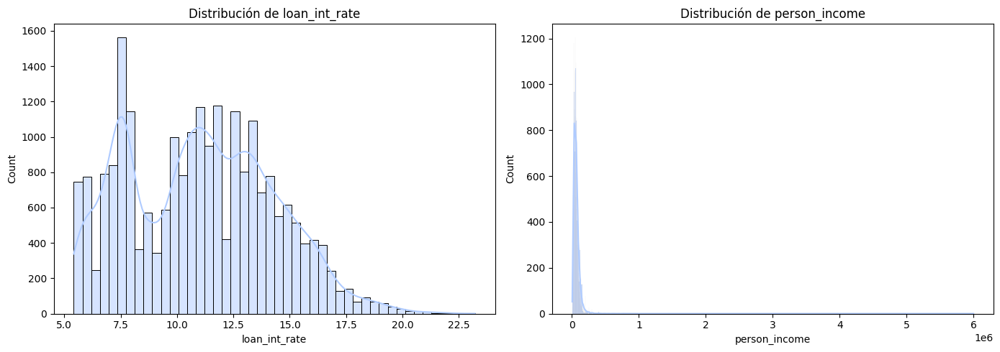

Asimetría de loan_int_rate: 0.20
Asimetría de person_income: 38.89


In [869]:
# Graficamos histograma + distribución de ambas variables:
fig, axs = plt.subplots(1, 2, figsize=(14, 5))

sns.histplot(df_train['loan_int_rate'], kde=True, ax=axs[0], color="#AFCBFF")
axs[0].set_title('Distribución de loan_int_rate')

sns.histplot(df_train['person_income'], kde=True, ax=axs[1], color="#AFCBFF")
axs[1].set_title('Distribución de person_income')

plt.tight_layout() # ajustamos automáticamente los espacios entre los elementos del gráfico
plt.show()

# Sacamos los coeficientes de asimetría
print(f"Asimetría de loan_int_rate: {df_train['loan_int_rate'].skew():.2f}")
print(f"Asimetría de person_income: {df_train['person_income'].skew():.2f}")

Si el valor de asimetría es positivo (> 0), la distribución está sesgada a la derecha (mayoría de los valores bajos, pero con algunos muy altos).

* Por un lado, `loan_int_rate` indica una asimetría muy baja. La distribución es bastante simétrica y no necesita transformación.

* En cambio, `person_income` refleja una asimetría positiva fuerte (cola larga a la derecha), lo cual sí podría afectar el rendimiento de la red neuronal. Por tanto, procederemos a aplicar una transformación logarítmica.

##### **¿La tasa de interés (`loan_int_rate`) aumenta con el grado del crédito (`loan_grade`)?**

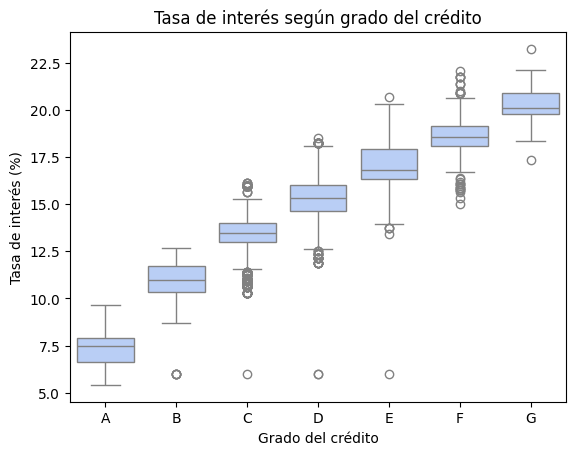

,loan_int_rate
loan_grade,
A,7.341336
B,10.998322
C,13.465195
D,15.335938
E,17.029859
F,18.567939
G,20.178846


In [870]:
sns.boxplot(x='loan_grade', y='loan_int_rate', data=df_train, color="#AFCBFF", order=sorted(df_train['loan_grade'].unique()))
plt.title('Tasa de interés según grado del crédito')
plt.xlabel('Grado del crédito')
plt.ylabel('Tasa de interés (%)')
plt.show()

# medias por grupo
display(df_train.groupby('loan_grade')['loan_int_rate'].mean().sort_index())

Más adelante tras codificar la variable `loan_grade` observamos en la matriz de correlaciones que presentan una correlacion positiva de 0.93 con `loan_int_rate`, es decir, son colineales.

##### **¿Las personas con mayores ingresos solicitan montos más grandes?**

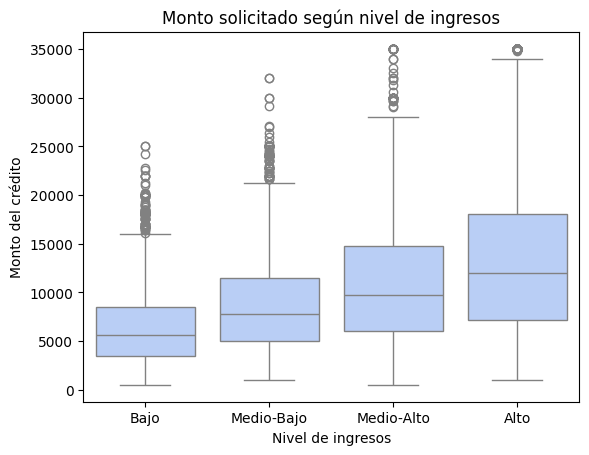

In [871]:
# Crear cuartiles de ingreso
df_train['income_bin'] = pd.qcut(df_train['person_income'], q=4, labels=['Bajo', 'Medio-Bajo', 'Medio-Alto', 'Alto'])

sns.boxplot(x='income_bin', y='loan_amnt', data=df_train, color="#AFCBFF")
plt.title('Monto solicitado según nivel de ingresos')
plt.xlabel('Nivel de ingresos')
plt.ylabel('Monto del crédito')
plt.show()

Test de Kruskal-Wallis
Es una prueba no paramétrica que evalúa si hay diferencias significativas en la distribución de una variable numérica entre más de dos grupos independientes (como tus cuartiles de ingreso).

In [872]:
# Extraer los valores de loan_amnt por grupo de ingreso
groups = [group['loan_amnt'].values for name, group in df_train.groupby('income_bin')]

# Test de Kruskal-Wallis
stat, p_value = kruskal(*groups)
print(f'Estadístico H: {stat:.3f}, p-valor: {p_value:.4e}')

Estadístico H: 3312.017, p-valor: 0.0000e+00


In [873]:
df_train.drop('income_bin', axis=1, inplace=True)

En general, se puede ver una leve subida del monto del crédito ssegún más gane.

### Valores atípicos e inconsistencias

In [874]:
df_train.dtypes

,0
person_age,Int64
person_income,Int64
person_home_ownership,string[python]
person_emp_length,Int64
loan_intent,string[python]
loan_grade,string[python]
loan_amnt,Int64
loan_int_rate,Float64
loan_status,Int64
loan_percent_income,Float64


#### Variables numéricas

Para los valores numéricos haremos uso de un método clásico y robusto para detectar outliers, el método del rango intercuartílico (IQR).

In [875]:
# Filtramos las columnas numéricas
num_cols = ['person_age','person_income','person_emp_length','loan_amnt','loan_int_rate','loan_percent_income','cb_person_cred_hist_length']

# Lista para almacenar los resultados
outliers_summary = []

# Iteramos por cada columna numérica
for col in num_cols:
    try:
        # Calculamos los percentiles Q1 (25%) y Q3 (75%)
        Q1 = df_train[col].quantile(0.25)
        Q3 = df_train[col].quantile(0.75)

        # Calculamos el IQR
        IQR = Q3 - Q1

        # Calculamos los límites inferior y superior para los valores atípicos
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Detectamos los valores atípicos
        outliers = df_train[(df_train[col] < lower_bound) | (df_train[col] > upper_bound)]

        # Calculamos el porcentaje de valores atípicos
        percent_outliers = (len(outliers) / len(df_train)) * 100

        # Almacenamos el resumen
        outliers_summary.append({
            "Variable": col,
            "Porcentaje Atípicos": percent_outliers,
            "Valor mínimo": df_train[col].min(),
            "Valor máximo": df_train[col].max(),
            "Q1": Q1,
            "Q3": Q3,
            "IQR": IQR,
            "Lower Bound": lower_bound,
            "Upper Bound": upper_bound
        })

    except Exception as e:
        print(f"Error procesando la columna {col}: {str(e)}")

# Convertimos los resultados a un DataFrame
outliers_df_train = pd.DataFrame(outliers_summary)

# Mostramos el resultado
display(outliers_df_train.sort_values(by='Porcentaje Atípicos', ascending=False))

,Variable,Porcentaje Atípicos,Valor mínimo,Valor máximo,Q1,Q3,IQR,Lower Bound,Upper Bound
3,loan_amnt,5.166667,500.00,35000.00,5000.00,12500.00,7500.00,-6250.00,23750.00
1,person_income,4.592105,4080.00,6000000.00,39600.00,80000.00,40400.00,-21000.00,140600.00
0,person_age,4.421053,20.00,144.00,23.00,30.00,7.00,12.50,40.50
6,cb_person_cred_hist_length,3.403509,2.00,30.00,3.00,8.00,5.00,-4.50,15.50
2,person_emp_length,2.671053,0.00,123.00,2.00,7.00,5.00,-5.50,14.50
5,loan_percent_income,1.929825,0.00,0.83,0.09,0.23,0.14,-0.12,0.44
4,loan_int_rate,0.021930,5.42,23.22,7.90,13.48,5.58,-0.47,21.85


Analicemos cada variable para ver qué se considera realmente outlier y que no.

##### `person_age`
En cuanto a la variable `person_age`, grafiquemosla:

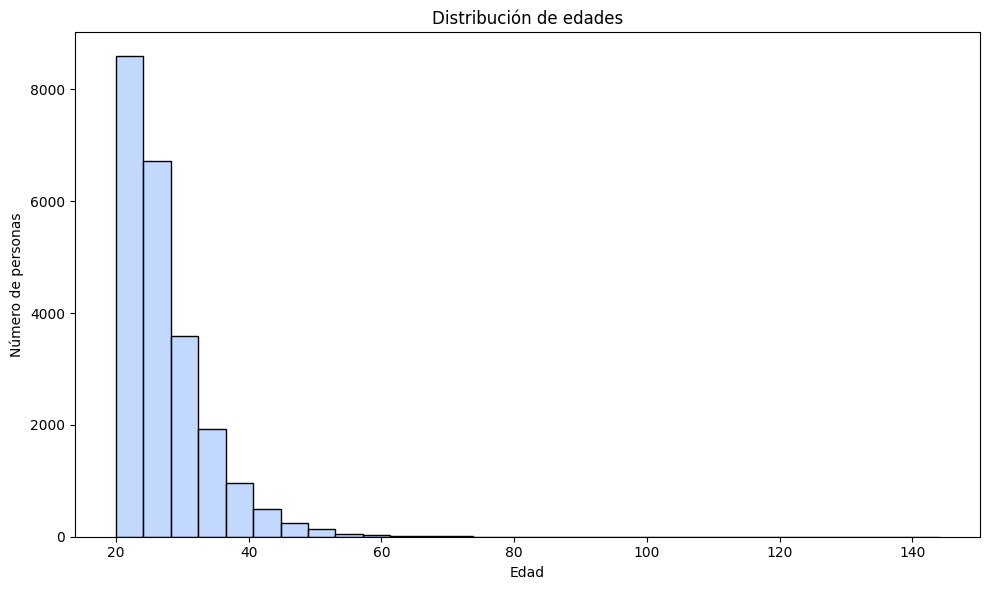

In [876]:
plt.figure(figsize=(10, 6))
sns.histplot(df_train['person_age'], bins=30, kde=None, color="#AFCBFF") # kde significa "Kernel Density Estimation"
plt.title('Distribución de edades')
plt.xlabel('Edad')
plt.ylabel('Número de personas')
plt.tight_layout()
plt.show()

In [877]:
df_train[df_train['person_age'] > 80]

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
81,144,250000,RENT,4,VENTURE,C,4800,13.57,0,0.02,N,3
32297,144,6000000,MORTGAGE,12,PERSONAL,C,5000,12.73,0,0.0,N,25
183,144,200000,MORTGAGE,4,EDUCATION,B,6000,11.86,0,0.03,N,2
575,123,80004,RENT,2,EDUCATION,B,20400,10.25,0,0.25,N,3


Hay valores atípicos en la edad, en 4 instancias: 3 de ellas con 144 años y otra con 123años.

In [878]:
# Eliminar instancias con edad mayor a 100 años en ambos set
df_train = df_train[df_train['person_age'] <= 100]
df_test = df_test[df_test['person_age'] <= 100]

##### `person_income`

In [879]:
df_train['person_income'].describe()

,person_income
count,22796.0
mean,66428.191876
std,50432.956764
min,4080.0
25%,39600.0
50%,56000.0
75%,80000.0
max,1782000.0


Ahora viendo que el máximo es algo menos de dos millones representemoslo.

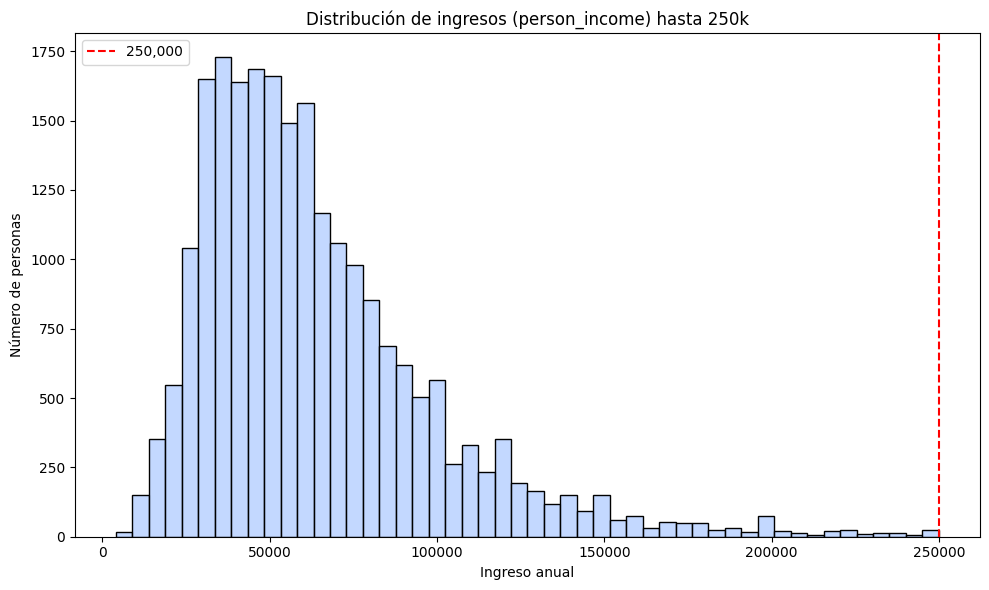

Personas con ingresos > 250,000: 170


In [880]:
# Histograma hasta 250k
plt.figure(figsize=(10, 6))
sns.histplot(df_train[df_train['person_income'] <= 250000]['person_income'], bins=50, color="#AFCBFF")
plt.axvline(250000, color='red', linestyle='--', label='250,000')
plt.title('Distribución de ingresos (person_income) hasta 250k')
plt.xlabel('Ingreso anual')
plt.ylabel('Número de personas')
plt.legend()
plt.tight_layout()
plt.show()

# Mostrar cuántas instancias superan 250k
num_outliers = (df_train['person_income'] > 250000).sum()
print(f"Personas con ingresos > 250,000: {num_outliers}")

A partir de sueldos mayores de 250mil al año, ni si quiera se ve visualmente representado en el gráfico de barras, de esta manera decidimos eliminar los 155 valores en el conjunto de entrenamiento que los superan pues son casos super pocos comunes y pueden deberse algunos incluso a errores de introducción de ceros de más.

In [881]:
# Eliminar instancias con sueldos mayores a 250k en ambos set
df_train = df_train[df_train['person_income'] <= 250000]
df_test = df_test[df_test['person_income'] <= 250000]

In [882]:
df_train.shape[0]

22626

<Figure size 1200x500 with 0 Axes>

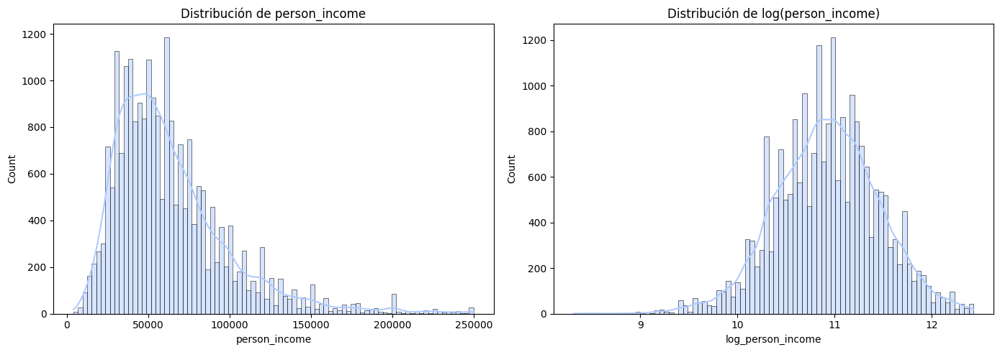

In [883]:
# Aplicamos la transformación logarítmica:
df_train['log_person_income'] = np.log(df_train['person_income'])

# Graficamos:
plt.figure(figsize=(12, 5))
fig, axs = plt.subplots(1, 2, figsize=(14, 5))

sns.histplot(df_train['person_income'], kde=True, ax=axs[0], color="#AFCBFF")
axs[0].set_title('Distribución de person_income')

sns.histplot(df_train['log_person_income'], kde=True, ax=axs[1], color="#AFCBFF")
axs[1].set_title('Distribución de log(person_income)')

plt.tight_layout()
plt.show()

In [884]:
print(f"Asimetría de log_person_income: {df_train['log_person_income'].skew():.2f}")

Asimetría de log_person_income: -0.11


In [885]:
# Aplicamos la transformación logarítmica también en el conjunto de prueba:
df_test['log_person_income'] = np.log(df_test['person_income'])

In [886]:
df_train.drop('person_income', axis=1, inplace=True)
df_test.drop('person_income', axis=1, inplace=True)

 ##### `person_emp_length`

Máximo: 123 años... Claramente mal.

In [887]:
df_train['person_emp_length'].describe()

,person_emp_length
count,22626.0
mean,4.77159
std,4.151994
min,0.0
25%,2.0
50%,4.0
75%,7.0
max,123.0


In [888]:
# Detectar inconsistencias: experiencia laboral > edad
emp_incoherente_train = df_train[df_train['person_emp_length'] > df_train['person_age']]
emp_incoherente_test = df_test[df_test['person_emp_length'] > df_test['person_age']]

# Resultado
display(f"Número de registros donde la experiencia laboral es mayor que la edad: {len(emp_incoherente_train)}")
display(emp_incoherente_train[['person_age', 'person_emp_length']])

display(f"Número de registros donde la experiencia laboral es mayor que la edad: {len(emp_incoherente_test)}")
display(emp_incoherente_test[['person_age', 'person_emp_length']])

'Número de registros donde la experiencia laboral es mayor que la edad: 2'

,person_age,person_emp_length
0,22,123
210,21,123


'Número de registros donde la experiencia laboral es mayor que la edad: 0'

,person_age,person_emp_length


In [889]:
# Eliminar filas donde person_emp_length > person_age
df_train = df_train[df_train['person_emp_length'] <= df_train['person_age']]
df_test = df_test[df_test['person_emp_length'] <= df_test['person_age']]

display(f"DataFrame de entrenamiento actualizado. Número de filas restantes: {len(df_train)}")
display(f"DataFrame de prueba actualizado. Número de filas restantes: {len(df_test)}")

'DataFrame de entrenamiento actualizado. Número de filas restantes: 22624'

'DataFrame de prueba actualizado. Número de filas restantes: 5662'

In [890]:
# Crear columna con la edad a la que empezó a trabajar
df_train['start_work_age'] = df_train['person_age'] - df_train['person_emp_length']

# Mostrar algunos ejemplos
display(df_train[['person_age', 'person_emp_length', 'start_work_age']].sort_values(by=['start_work_age'], ascending=True))

,person_age,person_emp_length,start_work_age
2246,25,10,15
13209,24,9,15
24796,27,12,15
22968,29,14,15
4723,23,8,15
...,...,...,...
32383,70,1,69
32436,70,1,69
32334,70,0,70
32521,73,0,73


algunos países de Asia, América Latina, África o incluso EE. UU. en ciertos estado se puede trabajr a las 15-16años por tanto decidimos ante el desconocimiento del contexto social y demográfico del dataset , no tratar esas instancias :)

In [891]:
cantidad_menores_18 = (df_train['start_work_age'] < 18).sum()
print(f"Número de personas que empezaron a trabajar antes de los 18 años: {cantidad_menores_18}")

Número de personas que empezaron a trabajar antes de los 18 años: 5592


Parece un nº bastante elevado, así que asumimos que es una práctica legal y no es ninguna incongruencia de los datos.

##### `loan_amnt`
En esta variable considera outliers si supera los $23750$ (Upper Bound).

Rango normal: $500-35000$ → tiene sentido como préstamos personales.

In [892]:
df_train['loan_amnt'].describe()

,loan_amnt
count,22624.0
mean,9596.661731
std,6262.885033
min,500.0
25%,5000.0
50%,8000.0
75%,12250.0
max,35000.0


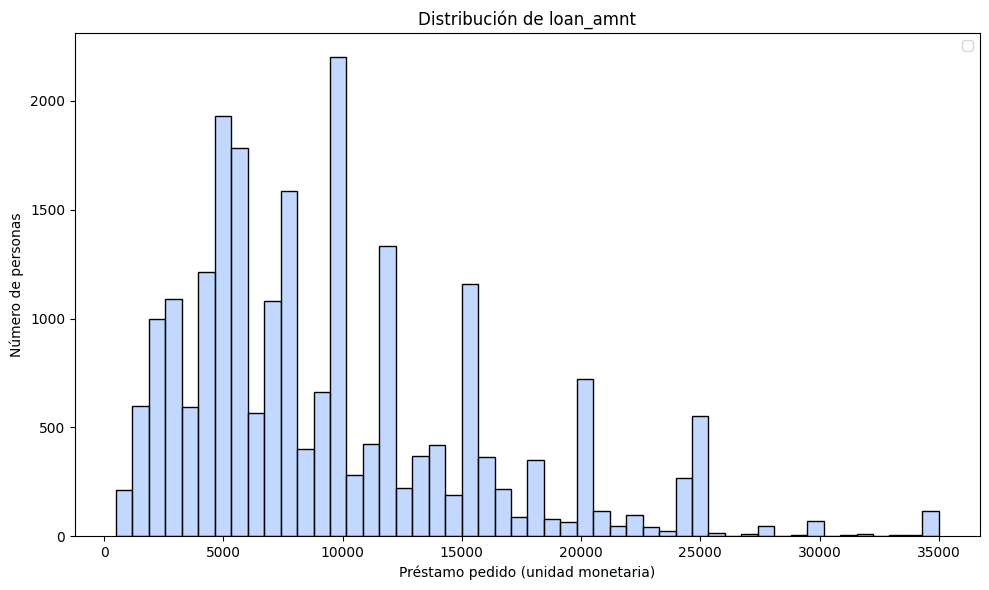

In [893]:
# Histograma
plt.figure(figsize=(10, 6))
sns.histplot(df_train['loan_amnt'], bins=50, color="#AFCBFF")

# Título y etiquetas
plt.title('Distribución de loan_amnt')
plt.xlabel('Préstamo pedido (unidad monetaria)')
plt.ylabel('Número de personas')
plt.legend()
plt.tight_layout()
plt.show()

##### `loan_int_rate`
Apenas presenta valores atípicos tratabes.

In [894]:
df_train['loan_int_rate'].describe()

,loan_int_rate
count,22624.0
mean,11.037473
std,3.238796
min,5.42
25%,7.9
50%,10.99
75%,13.48
max,23.22


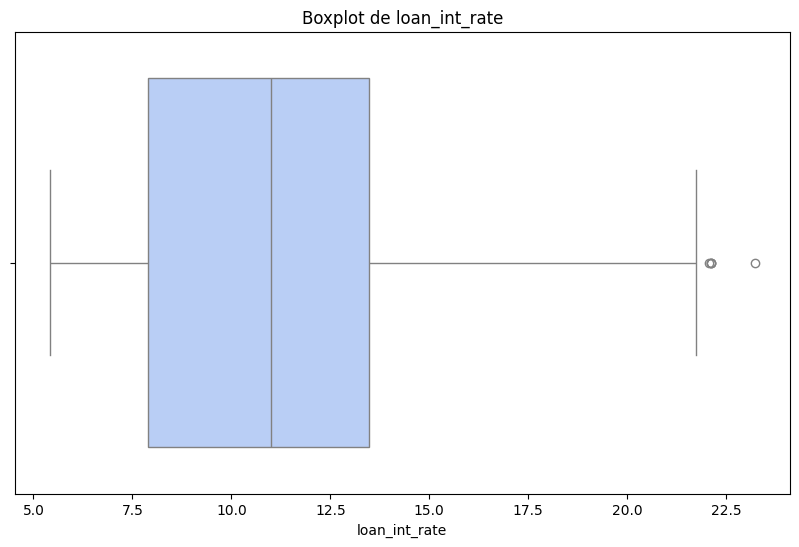

In [895]:
plt.figure(figsize=(10, 6))
sns.boxplot(x=df_train['loan_int_rate'], color="#AFCBFF")
plt.title('Boxplot de loan_int_rate')
plt.show()

In [896]:
# Mostrar cuántas instancias superan 22
num_outliers = (df_train['loan_int_rate'] > 22).sum()
print(f"Personas con tasas de interés > 22: {num_outliers}")

Personas con tasas de interés > 22: 5


##### `loan_percent_income`
Cuando este valor supera el 40%, es de mucho riesgo y a partir del 50% no se suele dar nunca el préstamo.(DTI: Debt-to-Income ratio).

In [897]:
df_train['loan_percent_income'].describe()

,loan_percent_income
count,22624.0
mean,0.17025
std,0.106339
min,0.01
25%,0.09
50%,0.15
75%,0.23
max,0.83


In [898]:
porcentaje = df_train[df_train['loan_percent_income'] > 0.23]
alto_porc = df_train[df_train['loan_percent_income'] > 0.44]

print(f"Número de personas con loan_percent_income > {0.23*100:.0f}%: {len(porcentaje)}")
print(f"Número de personas con loan_percent_income > {0.44*100:.0f}%: {len(alto_porc)}")

Número de personas con loan_percent_income > 23%: 5285
Número de personas con loan_percent_income > 44%: 439


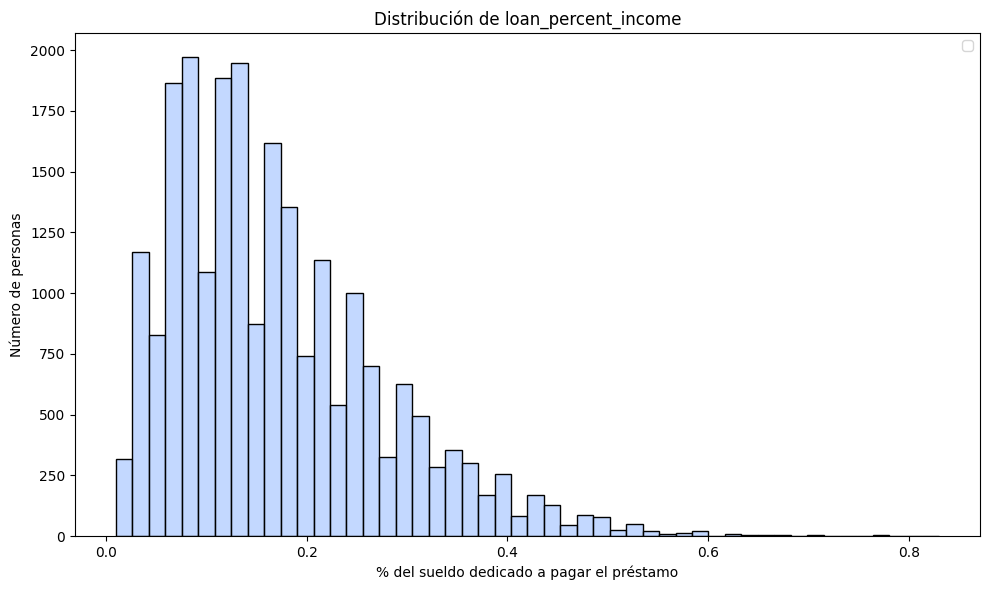

In [899]:
# Histograma
plt.figure(figsize=(10, 6))
sns.histplot(df_train['loan_percent_income'], bins=50, color="#AFCBFF")

# Título y etiquetas
plt.title('Distribución de loan_percent_income')
plt.xlabel('% del sueldo dedicado a pagar el préstamo')
plt.ylabel('Número de personas')
plt.legend()
plt.tight_layout()
plt.show()

Durante el EDA, se observó que el porcentaje de ingreso destinado al préstamo (`loan_percent_income`) tiende a ser significativamente mayor en el grupo de personas que incurrieron en impago (`loan_status = 1`) frente a quienes no lo hicieron. En concreto, la media de esta variable es del 14.81% para los no incumplidores y del 24.60% para los incumplidores. Esta diferencia resultó ser estadísticamente significativa según la prueba t de Student (p-valor ≈ 0.0000), lo que indica que esta variable podría ser un buen predictor del riesgo de impago.

A pesar de detectarse valores extremos en `loan_percent_income` (algunos superiores al 40%), se ha decidido conservarlos, dado que dichos casos pueden representar situaciones reales de sobreendeudamiento financiero. Además, estos valores son consistentes con el dominio del problema y podrían aportar valor al modelo predictivo, al reflejar perfiles de alto riesgo.


#####`cb_person_cred_hist_length`

Si una persona tiene 30 o 40 años, no puede tener 30 años de historial crediticio, ¡eso sería imposible!
Esto es una regla lógica muy importante en la validación del dataset. Si se viola, probablemente hay un error en los datos.

In [900]:
df_train['cb_person_cred_hist_length'].describe()

,cb_person_cred_hist_length
count,22624.0
mean,5.746508
std,3.986147
min,2.0
25%,3.0
50%,4.0
75%,8.0
max,30.0


In [901]:
# detectar personas con un historial crediticio mayor a su edad (incoherencia)
incoherentes = df_train[df_train['cb_person_cred_hist_length'] > df_train['person_age']]
print(f"Número de registros con historial crediticio mayor que la edad: {len(incoherentes)}")

# ver algunos casos en los que se de dicha incoherencia.
print(incoherentes[['person_age', 'cb_person_cred_hist_length']].head())

Número de registros con historial crediticio mayor que la edad: 0
Empty DataFrame
Columns: [person_age, cb_person_cred_hist_length]
Index: []


Esto sería para el conjunto de entrenamiento nada más que aunque sea mayor que el de prueba (test set), podría haber alguna instancia en este que sea incongruente con la realidad de manera que debería ser tratado por si acaso.

In [902]:
df_test = df_test[df_test['cb_person_cred_hist_length'] <= df_test['person_age']]

In [903]:
sospechosos = df_train[(df_train['person_age'] < 50) & (df_train['cb_person_cred_hist_length'] > 30)]
print(f"Jóvenes con historial crediticio >30 años: {len(sospechosos)}")
print(sospechosos[['person_age', 'cb_person_cred_hist_length']].head())

Jóvenes con historial crediticio >30 años: 0
Empty DataFrame
Columns: [person_age, cb_person_cred_hist_length]
Index: []


In [904]:
df_train[df_train['cb_person_cred_hist_length'] > 20]['person_age'].describe() # la persona más joven con créditos de más de 20 años tiene 51años, es lógico y no viola ninguna regla lógica.

,person_age
count,137.0
mean,57.343066
std,6.247868
min,51.0
25%,53.0
50%,55.0
75%,60.0
max,80.0


In [905]:
df_train[df_train['cb_person_cred_hist_length'] >= 30]['person_age'].describe()

,person_age
count,11.0
mean,55.636364
std,4.153859
min,51.0
25%,52.5
50%,55.0
75%,58.0
max,64.0


In [906]:
# Calcular la diferencia entre la edad y el historia crediticio
df_train['diff_hist_age'] = df_train['person_age'] - df_train['cb_person_cred_hist_length']

df_train['diff_hist_age'].describe()

,diff_hist_age
count,22624.0
mean,21.88742
std,3.232645
min,16.0
25%,20.0
50%,21.0
75%,23.0
max,55.0


La lógica de que alguien pueda tener historial crediticio a los 16 años depende del contexto legal y financiero del país del que provengan los datos. Veamos cuán de típico es en este dataset:

In [907]:
n_menores_16 = (df_train['diff_hist_age'] == 16).sum()
total = len(df_train)
porcentaje = (n_menores_16 / total) * 100

print(f"Personas que comenzaron historial crediticio con 16 años: {n_menores_16} ({porcentaje:.2f}%)")

Personas que comenzaron historial crediticio con 16 años: 4 (0.02%)


In [908]:
n_menores_18 = (df_train['diff_hist_age'] < 18).sum()
total = len(df_train)
porcentaje = (n_menores_18 / total) * 100

print(f"Personas que comenzaron historial crediticio siendo menor de edad: {n_menores_18} ({porcentaje:.2f}%)")

Personas que comenzaron historial crediticio siendo menor de edad: 542 (2.40%)


Durante el análisis exploratorio se detectaron 542 registros (2.4% del conjunto de entrenamiento) en los que la edad de inicio del historial crediticio era menor a los 18 años. Aunque este hecho podría considerarse una incongruencia, se optó por no eliminar automáticamente estos registros por dos motivos principales: en primer lugar, el porcentaje de casos afectados es reducido y no compromete la integridad general del conjunto; en segundo lugar, es posible que en determinados contextos legales o situaciones particulares (por ejemplo, co-firmas de préstamos por parte de padres) los individuos puedan iniciar su historial crediticio antes de la mayoría de edad. Por tanto, se decidió mantener estas observaciones en el análisis, aunque se etiquetaron como casos especiales para poder estudiar su posible influencia en fases posteriores del trabajo.

De esta manera creamos una nueva variable booleana que nos indica si la persona comenzó su historial crediticio siendo menor o mayor de edad.

In [909]:
df_train['minor_credit_start'] = (df_train['person_age'] - df_train['cb_person_cred_hist_length']) < 18

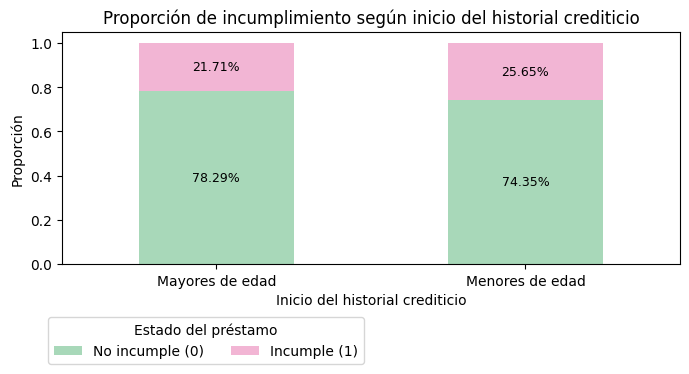

In [910]:
figsize=(12, 8)

# Tabla cruzada normalizada
minor_impact = pd.crosstab(df_train['minor_credit_start'], df_train['loan_status'], normalize='index')

# Renombrar columnas para legibilidad
minor_impact.columns = ['No incumple (0)', 'Incumple (1)']
minor_impact.index = ['Mayores de edad', 'Menores de edad']

# Subset (en este caso son solo dos filas)
subset = minor_impact

# Plot apilado
ax = subset.plot(
    kind='bar',
    stacked=True,
    color=[COLOR_MAP_LOAN_STATUS[0], COLOR_MAP_LOAN_STATUS[1]],
    figsize=(7, 4)
)

# Añadir etiquetas con porcentaje en cada segmento
for i, (index, row) in enumerate(subset.iterrows()):
    cum_sum = 0
    for j, val in enumerate(row):
        if val > 0.02:  # No mostrar etiquetas con representatividad muy pequeña
            ax.text(
                i,
                cum_sum + val / 2,
                f'{val * 100:.2f}%',
                ha='center',
                va='center',
                color='black',
                fontsize=9
            )
        cum_sum += val

plt.title('Proporción de incumplimiento según inicio del historial crediticio')
plt.ylabel('Proporción')
plt.xlabel('Inicio del historial crediticio')
plt.xticks(rotation=0)
plt.legend(title='Estado del préstamo', loc='best', bbox_to_anchor=(0.5, -0.2), ncol=2)
plt.tight_layout()
plt.show()

Tras esta rápida comprobación gráfica podemos observar que indeppendientemente si la persona empezó su historial crediticio siendo menor o mayor edad , las proporciones de incumpliemneto o no son similares en ambos grupos. De manera que procedemos a eliminar dicha variable recién creada.

In [911]:
df_train.drop(columns=['minor_credit_start','diff_hist_age', 'start_work_age'], axis=1, inplace=True)

In [912]:
df_train.shape[0] # numero de instancias actuales

22624

In [913]:
df_train.isnull().sum()

,0
person_age,0
person_home_ownership,0
person_emp_length,0
loan_intent,0
loan_grade,0
loan_amnt,0
loan_int_rate,0
loan_status,0
loan_percent_income,0
cb_person_default_on_file,0


#### Variables categóricas

In [914]:
# Conteo y porcentajes
count = df_train['loan_status'].value_counts().sort_index()
total = count.sum()
percentages = (count / total * 100).round(2)

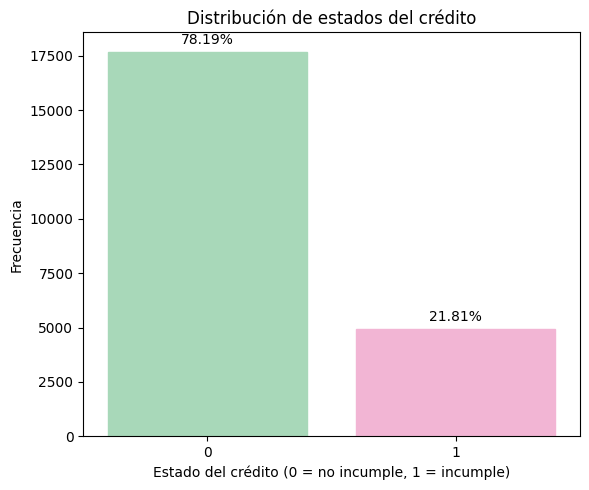

In [915]:
# Crear el gráfico
plt.figure(figsize=(6,5))
ax = sns.barplot(
    x=count.index.astype(str),
    y=count.values,
    color=None,
    palette=None
)

# Aplicar los colores directamente
bars = ax.patches
for i, bar in enumerate(bars):
    bar.set_color([COLOR_MAP_LOAN_STATUS[0], COLOR_MAP_LOAN_STATUS[1]][i])

# Añadir etiquetas de porcentaje
for i, (val, pct) in enumerate(zip(count.values, percentages.values)):
    ax.text(i, val + total * 0.01, f'{pct}%', ha='center', va='bottom', fontsize=10)

# Etiquetas y estilo
plt.title('Distribución de estados del crédito')
plt.xlabel('Estado del crédito (0 = no incumple, 1 = incumple)')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

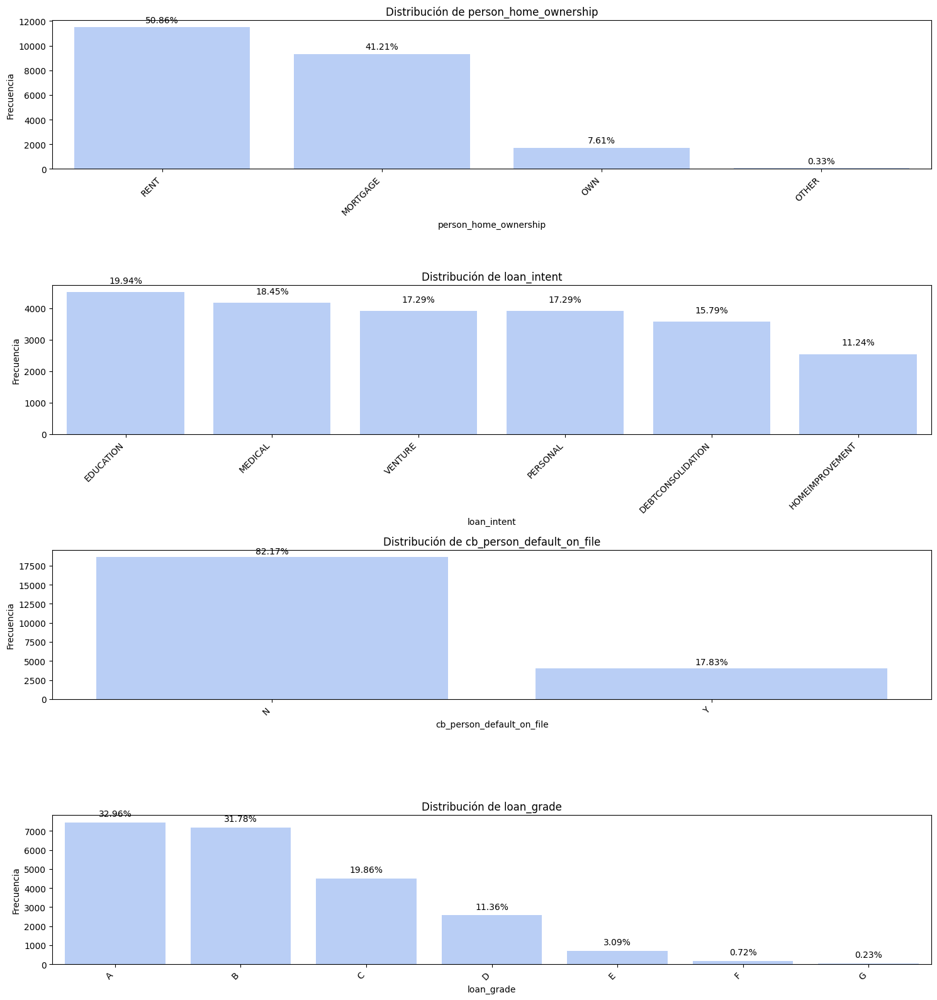

In [916]:
categorical_cols = ['person_home_ownership', 'loan_intent',
                    'cb_person_default_on_file', 'loan_grade']


plt.figure(figsize=(15, len(categorical_cols) * 4))

for i, col in enumerate(categorical_cols, 1):
    plt.subplot(len(categorical_cols), 1, i)

    count = df_train[col].value_counts()
    total = count.sum()
    percentages = (count / total * 100).round(2)

    # Elegir la paleta de colores adecuada
    palette = ["#AFCBFF"] * len(count)

    ax = sns.barplot(x=count.index, y=count.values, palette=palette)

    # Añadir porcentaje en cada barra
    for j, (value, pct) in enumerate(zip(count.values, percentages.values)):
        ax.text(j, value + total * 0.01, f'{pct}%', ha='center', va='bottom', fontsize=10)

    plt.title(f'Distribución de {col}')
    plt.xlabel(col)
    plt.ylabel('Frecuencia')
    plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

In [917]:
for col in categorical_cols:
  count = df_train[col].value_counts()
  total = count.sum()
  percentages = (count / total * 100).round(2)
  print(f"Category: {col}")
  for category, percentage in percentages.items():
    print(f"  {category}: {percentage}%")
  print("-" * 20)

Category: person_home_ownership
  RENT: 50.86%
  MORTGAGE: 41.21%
  OWN: 7.61%
  OTHER: 0.33%
--------------------
Category: loan_intent
  EDUCATION: 19.94%
  MEDICAL: 18.45%
  VENTURE: 17.29%
  PERSONAL: 17.29%
  DEBTCONSOLIDATION: 15.79%
  HOMEIMPROVEMENT: 11.24%
--------------------
Category: cb_person_default_on_file
  N: 82.17%
  Y: 17.83%
--------------------
Category: loan_grade
  A: 32.96%
  B: 31.78%
  C: 19.86%
  D: 11.36%
  E: 3.09%
  F: 0.72%
  G: 0.23%
--------------------


Consideramos valores atípicos si su frecuencia es $<1\%$ :

`loan_status`es la variable objetivo (0 = no incumple, 1 = incumple). Tiene valores solo 0 y 1, por tanto no tiene outliers. Aunque hay una clase minoritaria y presente cierto desbalanceo, que trataremos más adelnate si fuera necesario.

No siempre hay que balancear, especialmente en casos reales como default/no default, donde ese desbalance refleja la realidad del negocio. Y en riesgo crediticio, predecir bien a los pocos que fallan es más importante que tener un accuracy alto.

##### `person_home_ownership`

Aunque la categoría other representa únicamente un 0.32% del total de registros, se ha optado por mantenerla como grupo separado en lugar de agruparla con otras categorías. Esta decisión se fundamenta en que other puede reflejar situaciones residenciales no convencionales o precarias —por ejemplo, ocupaciones irregulares, viviendas cedidas por terceros o sin gastos explícitos de vivienda—, lo cual podría estar vinculado a una mayor vulnerabilidad financiera. De hecho, esta categoría presenta una tasa de incumplimiento del 30%, similar a la de quienes alquilan, lo que refuerza la hipótesis de que no contar con un título de propiedad clara podría representar un mayor riesgo crediticio. Así, su inclusión diferenciada permite al modelo capturar patrones de riesgo más precisos y potencialmente útiles para decisiones de crédito.

##### 'loan_grade'

Agrupar E,F en una categoría como riesgo alto pues la representatividad de F es mínima y las carcterísticas de dichas instancias serán parecidas. Decidimos mantener G separada a pesar de su baja representatividad dada la importancia que tiene.

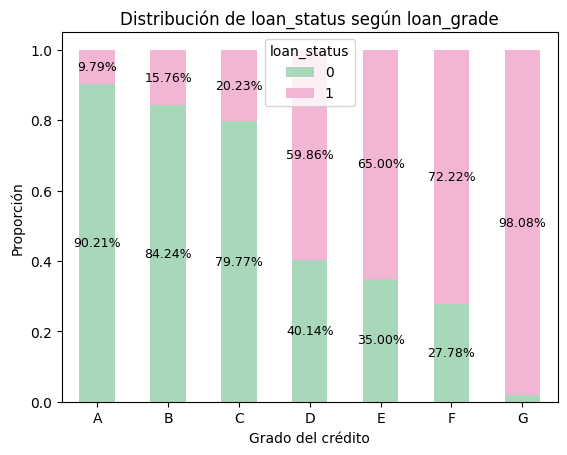

In [918]:
loan_grade_status = pd.crosstab(df_train['loan_grade'], df_train['loan_status'], normalize='index')

# Visualización
# Seleccionamos las categorías a graficar, en neustro caso son todas
subset = loan_grade_status.loc[['A','B','C', 'D','E', 'F', 'G']]

# Plot apilado
ax = subset.plot(
    kind='bar',
    stacked=True,
    color=COLOR_MAP_LOAN_STATUS
)
# Añadir etiquetas con porcentaje
for i, (index, row) in enumerate(subset.iterrows()):
    cum_sum = 0
    for j, val in enumerate(row):
        if val > 0.02:  # Para evitar etiquetas en valores muy pequeños
            ax.text(
                i,                       # posición x (barra)
                cum_sum + val / 2,       # posición y (mitad del segmento)
                f'{val*100:.2f}%',       # % de cada categoria
                ha='center',
                va='center',
                color='black',
                fontsize=9
            )
        cum_sum += val

# Etiquetas y diseño
plt.title('Distribución de loan_status según loan_grade')
plt.ylabel('Proporción')
plt.xlabel('Grado del crédito')
plt.xticks(rotation=0)
plt.legend(title='loan_status', loc='best')
plt.show()

In [919]:
# Mantener A, B, C, D, G y reagrupar E, F como 'E+F'
df_train['loan_grade'] = df_train['loan_grade'].apply(
    lambda x: 'E+F' if x in ['E', 'F'] else x
)

In [920]:
print(df_train['loan_grade'].unique())

['C' 'A' 'B' 'D' 'E+F' 'G']


Graficamos para ver como ha quedado la reagrupación:

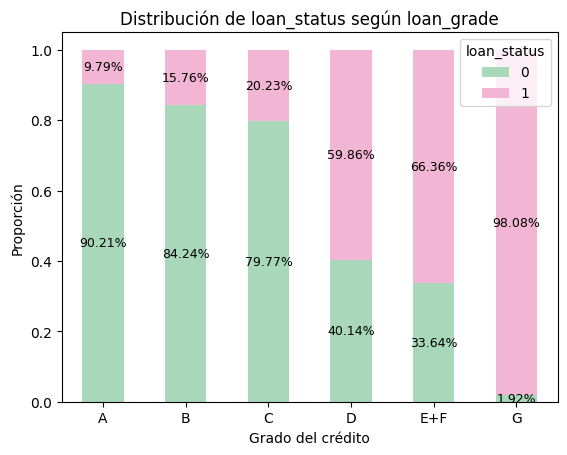

In [921]:
loan_grade_status = pd.crosstab(df_train['loan_grade'], df_train['loan_status'], normalize='index')

# Visualización
# Seleccionamos las categorías a graficar, en neustro caso son todas
subset = loan_grade_status.loc[['A','B','C', 'D','E+F', 'G']]

# Plot apilado
ax = subset.plot(
    kind='bar',
    stacked=True,
    color=[COLOR_MAP_LOAN_STATUS[0], COLOR_MAP_LOAN_STATUS[1]]
)
# Añadir etiquetas con porcentaje
for i, (index, row) in enumerate(subset.iterrows()):
    cum_sum = 0
    for j, val in enumerate(row):
        if val > 0.01:  # Para evitar etiquetas en valores muy pequeños
            ax.text(
                i,                       # posición x (barra)
                cum_sum + val / 2,       # posición y (mitad del segmento)
                f'{val*100:.2f}%',       # % de cada categoria
                ha='center',
                va='center',
                color='black',
                fontsize=9
            )
        cum_sum += val

# Etiquetas y diseño
plt.title('Distribución de loan_status según loan_grade')
plt.ylabel('Proporción')
plt.xlabel('Grado del crédito')
plt.xticks(rotation=0)
plt.legend(title='loan_status', loc='best')
plt.show()

In [922]:
df_train.shape[0]

22624

Lo hacemos ahora para el conjunto de test:

In [923]:
df_test['loan_grade'] = df_test['loan_grade'].apply(
    lambda x: 'E+F' if x in ['E', 'F'] else x
)

In [924]:
df_test.shape[0]

5662

### Codificación de variables categóricas

 ##### **Comprobación de correlación de las variables categóricas con la target:**

In [925]:
categoricas = [
    'person_home_ownership',
    'loan_intent',
    'loan_grade',
    'cb_person_default_on_file'
]
target = 'loan_status'

In [926]:
# Función para Cramér's V corregido
def cramers_v(tabla):
    chi2, _, _, _ = chi2_contingency(tabla)
    n = tabla.sum().sum()
    phi2 = chi2 / n
    r, k = tabla.shape
    phi2_corr = max(0, phi2 - ((k - 1)*(r - 1)) / (n - 1))
    r_corr = r - ((r - 1)**2) / (n - 1)
    k_corr = k - ((k - 1)**2) / (n - 1)
    return np.sqrt(phi2_corr / min((k_corr - 1), (r_corr - 1)))

    # Lista de variables categóricas
categoricas = [
    'person_home_ownership',
    'loan_intent',
    'loan_grade',
    'cb_person_default_on_file'
]

# Lista para guardar resultados
resultados = []

for var in categoricas:
    tabla = pd.crosstab(df_train[var], df_train['loan_status'])
    chi2, p, _, _ = chi2_contingency(tabla)
    v = cramers_v(tabla)

    resultados.append({
        'Variable': var,
        'Estadístico (chi2)': chi2,
        'p-valor (chi2)': p,
        "cramers_v": round(v, 4)
     })

# Convertir a DataFrame y mostrar
res_df = pd.DataFrame(resultados).sort_values(by='cramers_v', ascending=False)
display(res_df)

,Variable,Estadístico (chi2),p-valor (chi2),cramers_v
2,loan_grade,4155.903204,0.000000e+00,0.4283
0,person_home_ownership,1348.372268,4.697306e-292,0.2439
3,cb_person_default_on_file,737.695924,1.900116e-162,0.1805
1,loan_intent,399.010244,4.848222e-84,0.1320


Para variables binarias como `cb_person_default_on_file` , usamos Binary Label Encoding:

In [927]:
df_train['cb_person_default_on_file'] = df_train['cb_person_default_on_file'].map({'Y': 1, 'N': 0})

In [928]:
df_test['cb_person_default_on_file'] = df_test['cb_person_default_on_file'].map({'Y': 1, 'N': 0})

Para la variable `loan_grade` convierte categorías en números con un orden implícito, habamos entonces de Ordinal Encoding:

In [929]:
grade_map = {'A': 1, 'B': 2, 'C': 3, 'D': 4, 'E+F': 5, 'G':6}

In [930]:
df_train['loan_grade'] = df_train['loan_grade'].map(grade_map)
df_test['loan_grade'] = df_test['loan_grade'].map(grade_map)

In [931]:
print(df_train['loan_grade'].unique())

[3 1 2 4 5 6]


Convertimos las variables categóricas en varias columnas binarias (una por categoría) cuando no hay un orden natural, es decir, hacemos una codificación "One-Hot Encoding".

In [932]:
df_train = pd.get_dummies(df_train, columns=['person_home_ownership', 'loan_intent'], drop_first=True)
df_test = pd.get_dummies(df_test, columns=['person_home_ownership', 'loan_intent'], drop_first=True)

### Correlación de variables

In [933]:
df_train.columns

Index(['person_age', 'person_emp_length', 'loan_grade', 'loan_amnt',
       'loan_int_rate', 'loan_status', 'loan_percent_income',
       'cb_person_default_on_file', 'cb_person_cred_hist_length',
       'log_person_income', 'person_home_ownership_OTHER',
       'person_home_ownership_OWN', 'person_home_ownership_RENT',
       'loan_intent_EDUCATION', 'loan_intent_HOMEIMPROVEMENT',
       'loan_intent_MEDICAL', 'loan_intent_PERSONAL', 'loan_intent_VENTURE'],
      dtype='object')

In [934]:
df_test.columns

Index(['person_age', 'person_emp_length', 'loan_grade', 'loan_amnt',
       'loan_int_rate', 'loan_status', 'loan_percent_income',
       'cb_person_default_on_file', 'cb_person_cred_hist_length',
       'log_person_income', 'person_home_ownership_OTHER',
       'person_home_ownership_OWN', 'person_home_ownership_RENT',
       'loan_intent_EDUCATION', 'loan_intent_HOMEIMPROVEMENT',
       'loan_intent_MEDICAL', 'loan_intent_PERSONAL', 'loan_intent_VENTURE'],
      dtype='object')

Sólo de variables numéricas:

In [935]:
numericasytarget = [
    'person_age',
    'person_emp_length',
    'loan_grade',
    'loan_amnt',
    'loan_int_rate',
    'loan_status',
    'loan_percent_income',
    'cb_person_cred_hist_length',
    'log_person_income'
]

In [936]:
# Matriz de correlación de Pearson
correlacion = df_train[numericasytarget].corr(method='pearson')
display(correlacion)

,person_age,person_emp_length,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length,log_person_income
person_age,1.000000,0.172706,0.008285,0.049254,0.006686,-0.021080,-0.032856,0.875080,0.105784
person_emp_length,0.172706,1.000000,-0.052605,0.109144,-0.058113,-0.090234,-0.053427,0.145837,0.215398
loan_grade,0.008285,-0.052605,1.000000,0.144178,0.936733,0.382104,0.124557,0.012293,-0.027006
loan_amnt,0.049254,0.109144,0.144178,1.000000,0.145139,0.112247,0.596760,0.039738,0.417498
loan_int_rate,0.006686,-0.058113,0.936733,0.145139,1.000000,0.340999,0.123706,0.014474,-0.029572
loan_status,-0.021080,-0.090234,0.382104,0.112247,0.340999,1.000000,0.378305,-0.010641,-0.281308
loan_percent_income,-0.032856,-0.053427,0.124557,0.596760,0.123706,0.378305,1.000000,-0.021628,-0.365889
cb_person_cred_hist_length,0.875080,0.145837,0.012293,0.039738,0.014474,-0.010641,-0.021628,1.000000,0.081315
log_person_income,0.105784,0.215398,-0.027006,0.417498,-0.029572,-0.281308,-0.365889,0.081315,1.000000


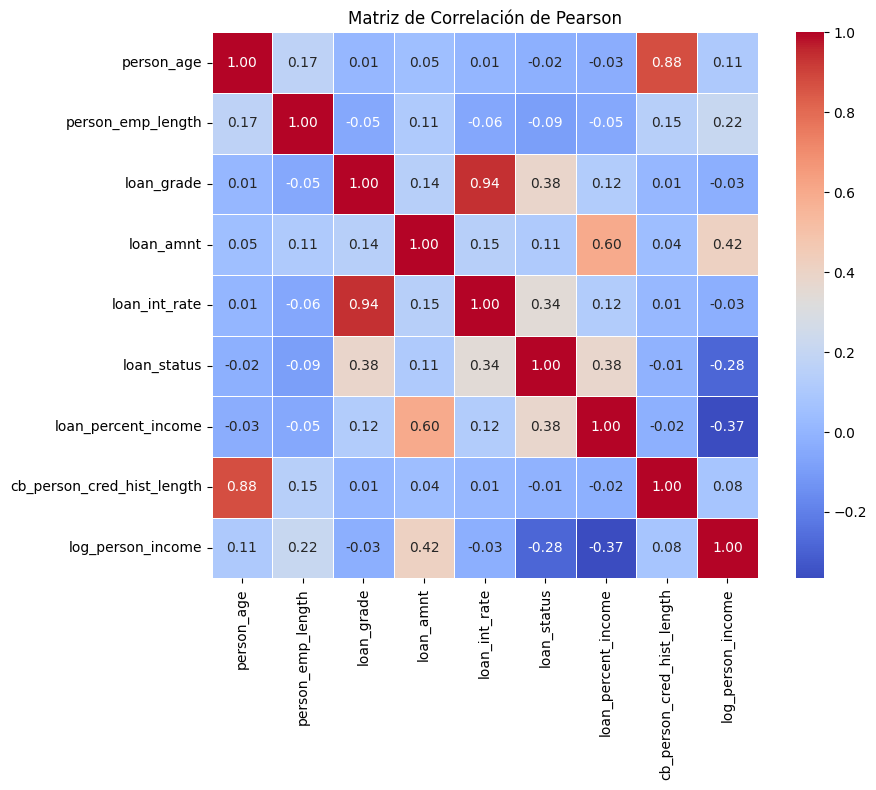

In [937]:
# graficamos :
plt.figure(figsize=(10, 8))
sns.heatmap(correlacion, annot=True, cmap='coolwarm', fmt=".2f", square=True, linewidths=0.5)
plt.title("Matriz de Correlación de Pearson")
plt.tight_layout()
plt.show()

### Anova:

In [938]:
numericas = [
    'person_age',
    'person_emp_length',
    'loan_grade',
    'loan_amnt',
    'loan_int_rate',
    'loan_percent_income',
    'cb_person_cred_hist_length',
    'log_person_income'
]

target = 'loan_status'


# ANOVA
anova_resultados = []

for var in numericas:
    grupo_0 = df_train[df_train[target] == 0][var].dropna()
    grupo_1 = df_train[df_train[target] == 1][var].dropna()

    stat, p = f_oneway(grupo_0, grupo_1)

    anova_resultados.append({
        'Variable': var,
        'Estadístico F': stat,
        'p_valor': p
    })

resultados_df = pd.DataFrame(anova_resultados).sort_values(by='p_valor')
display(resultados_df)

,Variable,Estadístico F,p_valor
2,loan_grade,3867.559433,0.000000e+00
7,log_person_income,1944.005638,0.000000e+00
5,loan_percent_income,3778.276402,0.000000e+00
4,loan_int_rate,2976.618928,0.000000e+00
3,loan_amnt,288.660392,2.441974e-64
1,person_emp_length,185.702720,4.043637e-42
0,person_age,10.057401,1.519396e-03
6,cb_person_cred_hist_length,2.561832,1.094857e-01


Tras la matriz de correlación decidimos eliminar ciertas variables por su alta correlación, provocando si las dejamos multicolinealidad.

In [939]:
df_train.drop(columns=['person_age','loan_amnt'], axis=1, inplace=True)
df_test.drop(columns=['person_age','loan_amnt'], axis=1, inplace=True)

Tratemos ahora las variables categoricas: (lo hicimos antes)

In [940]:
# Conteo absoluto por clase de loan_status
conteo_total = df['loan_status'].value_counts()

# Porcentaje por clase
porcentaje_total = (conteo_total / len(df) * 100).round(2)

# Mostrar resultados
print("Conteo total por loan_status:")
print(conteo_total)
print("\nPorcentaje por clase:")
print(porcentaje_total)

Conteo total por loan_status:
loan_status
0    22313
1     6188
Name: count, dtype: Int64

Porcentaje por clase:
loan_status
0    78.29
1    21.71
Name: count, dtype: Float64


# MODELOS E INTERPRETABILIDAD

In [941]:
# Separaramos las variables independientes de la variable objetivo
X_train = df_train.drop('loan_status', axis=1)
y_train = df_train['loan_status']

X_test = df_test.drop('loan_status', axis=1)
y_test = df_test['loan_status']

Para implementar el modelo de red neuronal, concretamente un perceptrón multicapa (MLP) haremos uso de la biblioteca scikit-learn debido a su simplicidad, claridad y facilidad de integración con herramientas de interpretabilidad como LIME. Y dado que el objetivo principal es analizar la capacidad explicativa de los modelos de machine learning, resulta más adecuado emplear una solución que favorezca la transparencia y la trazabilidad de los procesos, características por las que destaca scikit-learn. Además, al trabajar con datos tabulares y no requerir arquitecturas de redes profundas, el uso de frameworks como TensorFlow o PyTorch se considera innecesariamente complejo para los fines de este estudio. Por tanto, scikit-learn ofrece un equilibrio óptimo entre funcionalidad, facilidad de uso y compatibilidad con técnicas post-hoc de interpretabilidad.


## Árbol de decisión no balanceado

In [ ]:
# Crear el modelo del árbol de decisión
tree = DecisionTreeClassifier(
    max_depth=4,
    random_state=42
)

# Medir tiempo de entrenamiento
start_time = time.time()

# Entrenar el modelo
tree.fit(X_train, y_train)

end_time = time.time()
training_time = end_time - start_time
print(f"Tiempo de entrenamiento: {training_time:.4f} segundos")

# Predicciones en test
y_pred_tree = tree.predict(X_test)
y_proba_tree = tree.predict_proba(X_test)[:, 1]  # es la PD

Tiempo de entrenamiento: 0.1246 segundos


Dado el desbalance de clases (78%-22%), los modelos tienden a favorecer la clase mayoritaria.

El modelo se sesga hacia la clase mayoritaria (clase 0):
Tiende a clasificar muchas observaciones como clase 0 porque eso minimiza el error global.

Por eso ves un recall alto en clase 0 (0.98) pero bajo en clase 1 (0.61): le cuesta identificar los positivos (riesgo).

Con 78% de clase 0, un modelo que predice "todo es clase 0" ya tendría 78% de accuracy, pero no serviría para detectar riesgo.

Esto es crítico en scoring de crédito: un cliente riesgoso mal clasificado como “bueno” → impacto financiero alto.

In [ ]:
# Evaluación
print("Report de clasificación:\n")
print(classification_report(y_test, y_pred_tree))

print("Matriz de confusion:\n")
print(confusion_matrix(y_test, y_pred_tree))

roc_auc = roc_auc_score(y_test, y_proba_tree)
display(f"AUC: {roc_auc:.2f}")

Report de clasificación:

              precision    recall  f1-score   support

         0.0       0.90      0.99      0.95      4431
         1.0       0.95      0.62      0.75      1231

    accuracy                           0.91      5662
   macro avg       0.93      0.80      0.85      5662
weighted avg       0.91      0.91      0.90      5662

Matriz de confusion:

[[4390   41]
 [ 470  761]]


'AUC: 0.88'

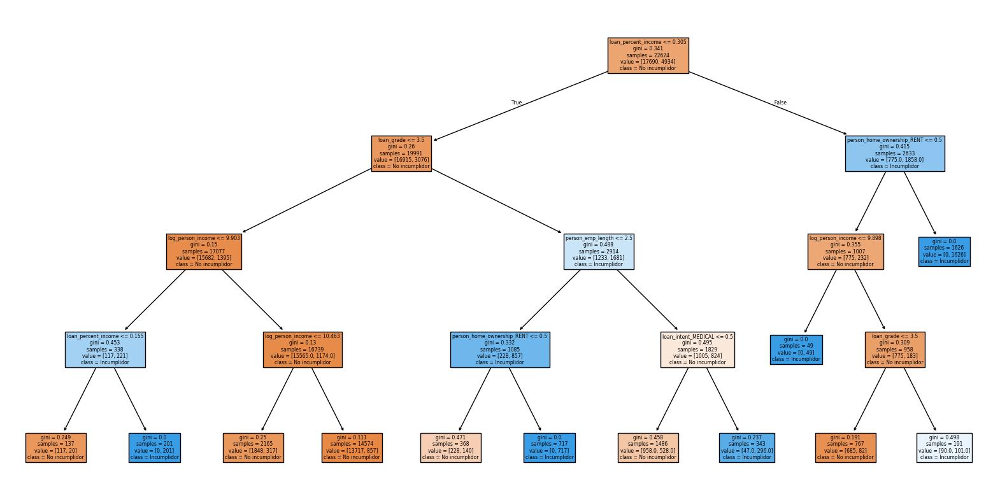

In [ ]:
# Graficar el árbol
plt.figure(figsize=(20,10))
plot_tree(tree, feature_names=X_train.columns.tolist(), class_names=['No incumplidor', 'Incumplidor'], filled=True)
plt.show()

Guardemos la imagen:

In [ ]:
# Exportar el árbol a formato DOT con nombres de variables
dot_data = export_graphviz(
    tree,
    out_file=None,
    feature_names=X_train.columns,
    class_names=['No incumplidor', 'Incumplidor'],
    filled=True,
    rounded=True,
    special_characters=True
)

# Generar imagen con graphviz
graph = graphviz.Source(dot_data)
graph.format = 'png'
graph.render('arbol_decision', cleanup=True)

'arbol_decision.png'

Cada nodo (bloque) representa una decisión binaria sobre una variable (feature) del dataset.

gini → Índice de impureza de Gini en ese nodo (0 = puro, 0.5 = mezcla total).

value = [a, b] → Número de muestras de cada clase:

* a = número de muestras clase 0 ("No incumplidor")

* b = número de muestras clase 1 ("Incumplidor")


Si un nodo es puri (gini=0) no se sigue porque ya ha alcanzado la mejor pureza, además no hay clases alternativas para dividir.

Los últimos nodos se llaman hojas.

### LIME

In [ ]:
feature_names = X_train.columns.tolist()
class_names = ['No incumplidor', 'Incumplidor']

In [ ]:
explainer = LimeTabularExplainer(
    training_data=X_train.values,             # 2D array con los datos de entrenamiento
    training_labels=y_train.values,           # Etiquetas (target) del entrenamiento
    mode='classification',                    # Tipo de tarea: clasificación
    feature_names=feature_names,              # Nombres de las características
    class_names=class_names,                  # Nombres de las clases (0 y 1)
    discretize_continuous=True,               # Discretizar variables continuas para interpretabilidad
    feature_selection='auto',                 # Estrategia de selección de variables explicativas
    random_state=42                           # Semilla para reproducibilidad
)

In [ ]:
# Elegir una instancia del conjunto de test para explicar
instancia = X_test.iloc[4680]

In [ ]:
explanation = explainer.explain_instance(
    data_row=instancia,
    predict_fn=tree.predict_proba,
    labels=(1,),
    top_labels=None,
    num_features=16,
    num_samples=5000,
    distance_metric='euclidean',
    model_regressor=None
)

In [ ]:
# Mostrar la explicación
explanation.show_in_notebook(show_table=True, show_all=False)

In [ ]:
print("Fidelidad local (R²):", explanation.score)

In [ ]:
best_score = -1
best_index = -1
best_exp = None

for i in range(len(X_test)):
    instancia = X_test.iloc[i].values

    explanation = explainer.explain_instance(
        data_row=instancia,
        predict_fn=tree.predict_proba,
        num_features=16,
        num_samples=5000
    )

    if explanation.score > best_score:
        best_score = explanation.score
        best_index = i
        best_exp = explanation

print(f"Mejor fidelidad local (R²): {best_score:.4f}")
print(f"Índice de la mejor instancia: {best_index}")

# Mostrar en Jupyter Notebook (si aplica)
best_exp.show_in_notebook(show_table=True)

In [ ]:
best_exp.show_in_notebook(show_table=True)

## MLP (64,32) no balanceado

In [ ]:
# 1. Definimos el pipeline sin entrenarlo aún
pipeline_mlp = Pipeline([
    ('scaler', StandardScaler()),
    ('feature_selection', SelectKBest(score_func=mutual_info_classif, k=15)),
    ('mlp', MLPClassifier(
        hidden_layer_sizes=(32, 16),
        activation='relu',
        solver='adam',
        random_state=42,
        max_iter=300
    ))
])

# 2. Definimos los parámetros para grid search
param_grid = {
    'mlp__hidden_layer_sizes': [(16,16), (32,32), (32, 16), (64, 32)],
    'mlp__alpha': [0.0001, 0.001, 0.01],
    'mlp__learning_rate_init': [0.001, 0.01],
}

# 3. Hacer búsqueda de hiperparámetros
grid_search = GridSearchCV(
    pipeline_mlp,
    param_grid,
    cv=5,
    scoring='f1',
    n_jobs=-1,
)


# 4. Entrenamiento
start_time = time.time()

grid_search.fit(X_train, y_train)

end_time = time.time()

# 5. Evaluación y predicciones
best_model = grid_search.best_estimator_

y_pred1 = best_model.predict(X_test)
y_pred_proba1 = best_model.predict_proba(X_test)[:, 1]


# 6. Tiempo total de entrenamiento
training_time = end_time - start_time
print(f"Tiempo de entrenamiento: {training_time:.2f} segundos")

In [ ]:
best_model

In [ ]:
# Guardar el mejor modelo en un archivo
joblib.dump(best_model, 'mejor_modelo_mlp.pkl')

In [ ]:
# Cargar el modelo desde archivo
best_model = joblib.load('mejor_modelo_mlp.pkl')

# Predecir directamente sin volver a entrenar
y_pred1 = best_model.predict(X_test)
y_pred_proba1 = best_model.predict_proba(X_test)[:, 1]

In [ ]:
# ROC & AUC
fpr, tpr, _ = roc_curve(y_test, y_pred_proba1)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.grid(True)
plt.show()

# ------------------------------
# Gini
gini = 2 * roc_auc - 1
print(f"Gini: {gini:.2f}")

# ------------------------------
# Precision-Recall Curve
precision1, recall1, _ = precision_recall_curve(y_test, y_pred_proba1)

plt.figure(figsize=(8, 6))
plt.plot(recall1, precision1, label="Precision-Recall Curve")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve")
plt.grid(True)
plt.show()

# ------------------------------
# Clasificación binaria (umbral = 0.5)
y_pred_label1 = (y_pred_proba1 >= 0.5).astype(int)
print("Classification Report:\n")
print(classification_report(y_test, y_pred_label1))

# ------------------------------
# Sensibilidad vs Especificidad por umbral
thresholds = np.linspace(0.01, 0.99, 100)
sensitivities1 = []
specificities1 = []

for t in thresholds:
    y_pred1 = (y_pred_proba1 >= t).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred1).ravel()
    sensitivities1.append(tp / (tp + fn))
    specificities1.append(tn / (tn + fp))

plt.figure(figsize=(8, 6))
plt.plot(thresholds, sensitivities1, label='Sensibilidad (TPR)')
plt.plot(thresholds, specificities1, label='Especificidad (TNR)')
plt.xlabel('Umbral')
plt.ylabel('Valor')
plt.title('Sensibilidad vs Especificidad')
plt.legend()
plt.grid(True)
plt.show()

# ------------------------------
# Matriz de confusion
print("Matriz de confusion:\n")
print(confusion_matrix(y_test, y_pred1))

In [ ]:
best_model.score(X_test,y_test) # es el accuracy del modelo

In [ ]:
# Definir los umbrales (de 0 a 1 con un paso de 0.01)
thresholds1 = np.arange(0.0, 1.0, 0.01)
f1_scores1 = []

# Calcular el F1 score para cada umbral
for threshold in thresholds1:
    # Predicción binaria usando el umbral
    y_pred = (y_pred_proba1 >= threshold).astype(int)
    # Calcular el F1 score
    f1 = f1_score(y_test, y_pred)
    f1_scores1.append(f1)

# Encontrar el umbral que da el mejor F1 score
best_f1 = max(f1_scores1)
best_threshold = thresholds1[f1_scores1.index(best_f1)]
print(f"Mejor F1 score: {best_f1:.4f} en el umbral {best_threshold:.2f}")

# Graficar la curva F1 frente al umbral
plt.figure(figsize=(8, 6))
plt.plot(thresholds1, f1_scores1, label='Curva F1', color='blue')
plt.axvline(x=best_threshold, color='red', linestyle='--', label=f"Umbral óptimo = {best_threshold:.2f}")
plt.xlabel('Umbral')
plt.ylabel('F1 Score')
plt.title('Curva F1 frente al Umbral')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Definimos el nuevo umbral
umbral = 0.48
# Aplicamos el nuevo umbral para generar predicciones finales
y_pred_custom = (y_pred_proba1 >= umbral).astype(int)

In [ ]:
# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred_custom))

# Matriz de confusión
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_custom))

# Curva ROC
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba1)
roc_auc = auc(fpr, tpr)

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')  # Línea de referencia
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Curva ROC - MLPClassifier')
plt.legend(loc='lower right')
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# Si ya aplicaste feature selection:
X_for_pca = X_test_selected

# Aplica PCA para reducir a 2 dimensiones
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_for_pca)

In [ ]:
# Añadimos un poco de ruido para los puntos duplicados
X_pca_jittered = X_pca + np.random.normal(0, 0.01, X_pca.shape)

plt.figure(figsize=(8, 6))

for clase in [0, 1]:
    idx = y_test == clase
    plt.scatter(
        X_pca_jittered[idx, 0],
        X_pca_jittered[idx, 1],
        c=COLOR_MAP_LOAN_STATUS[clase],
        label='No incumplidor' if clase == 0 else 'Incumplidor',
        s=30,
        edgecolors='k',
        linewidths=0.2,
        alpha=0.6,
        zorder=clase
    )

plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.title('PCA - Representación 2D de las características')
plt.legend(title="Clase real", loc='best')
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# 1. Definimos el pipeline sin entrenarlo aún
pipeline_mlp = Pipeline([
    ('scaler', StandardScaler()),
    ('feature_selection', SelectKBest(score_func=mutual_info_classif, k=15)),
    ('mlp', MLPClassifier(
        hidden_layer_sizes=(32, 16),
        activation='relu',
        solver='adam',
        random_state=42,
        max_iter=300
    ))
])

# 2. Definimos los parámetros para grid search
param_grid = {
    'mlp__hidden_layer_sizes': [ (64, 32)],
    'mlp__alpha': [0.0001, 0.001, 0.01],
    'mlp__learning_rate_init': [0.001, 0.01],
}

# 3. Hacer búsqueda de hiperparámetros
grid_search = GridSearchCV(
    pipeline_mlp,
    param_grid,
    cv=5,
    scoring='roc_auc',
    n_jobs=-1,
)


# 4. Entrenamiento
start_time = time.time()

grid_search.fit(X_train, y_train)

end_time = time.time()

# 5. Evaluación y predicciones
best_model = grid_search.best_estimator_

y_pred1 = best_model.predict(X_test)
y_pred_proba1 = best_model.predict_proba(X_test)[:, 1]


# 6. Tiempo total de entrenamiento
training_time = end_time - start_time
print(f"Tiempo de entrenamiento: {training_time:.2f} segundos")

In [ ]:
best_model

### LIME

In [ ]:
# Obtener las columnas seleccionadas
selected_mask = best_model.named_steps['feature_selection'].get_support()
selected_features = X_train.columns[selected_mask]

# Subconjuntos originales (sin escalar) con solo esas columnas
X_train_selected = X_train[selected_features]
X_test_selected = X_test[selected_features]

# Función para LIME que aplica todo el pipeline internamente
def predict_proba_fn(x):
    return best_model.predict_proba(x)

In [ ]:
explainer = LimeTabularExplainer(
    training_data=X_train_selected.values,    # 2D array con los datos de entrenamiento
    training_labels=y_train.values,           # Etiquetas del entrenamiento
    mode='classification',                    # Tipo de tarea: clasificación
    feature_names=selected_features.tolist(), # Nombres de las características
    class_names=['No incumplidor', 'Incumplidor'],    # Nombres de las clases
    discretize_continuous=True,               # Discretizar variables continuas para interpretabilidad
#   feature_selection='auto',                 # Estrategia de selección de variables explicativas
    random_state=42                           # Semilla para reproducibilidad
)

# Elegir una instancia del conjunto de test para explicar
instancia = X_test.iloc[150]

# # función para escalar los datos antes de meterselo a LIME, porque sino me daba el fallo de que ninguna variable pesaba.
# def predict_proba_fn(x):
#     x_scaled = scaler.transform(x)  # Usar el mismo que en el modelo
#     return best_model.predict_proba(x_scaled)

explanation = explainer.explain_instance(
    data_row=instancia,                      # Muestra a explicar
    predict_fn=predict_proba_fn,             # Función que devuelve las probabilidades del modelo
    top_labels=None,                         # No se usa porque se especifican las labels manualmente
    num_features=10,                         # Número de variables (features) a mostrar en la explicación
    num_samples=5000,                        # Número de muestras perturbadas generadas para la explicación
    distance_metric='euclidean',             # Métrica de distancia usada para ponderar las muestras perturbadas
#    model_regressor=None                     # Usamos la regresión ridge predeterminada de sklearn
)

# Mostrar la explicación
explanation.show_in_notebook(show_table=True, show_all=False)
print("Fidelidad local (R²):", explanation.score)

In [ ]:
print(explanation.predict_proba) # Muestra las predicciones del modelo sobre esas perturbaciones

$[0.00377138 0.99622862]$ es un vector de probabilidades que indica:

* $0.38\%$ de probabilidad para la clase 0 ("bajo riesgo de impago")

* $99.62\%$ de probabilidad para la clase 1 ("alto riesgo de impago")





In [ ]:
# Suponiendo que estas dos columnas quieres variar:
var1 = 'person_emp_length'
var2 = 'loan_percent_income'

# Selecciona una instancia a explicar
instancia_np = instancia.values.reshape(1, -1)


# Inicializa el explicador
explainer = LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=X_train.columns.tolist(),
    class_names=['No incumplidor', 'Incumplidor'],
    training_labels=y_train,
    mode='classification',
    discretize_continuous=True
)

# Generar explicación local
exp = explainer.explain_instance(
    data_row=instancia,
    predict_fn=predict_proba_fn,
    num_features=10
)

# Creamos un grid para las dos variables que queremos variar
v1_range = np.linspace(X_train[var1].min(), X_train[var1].max(), 100)
v2_range = np.linspace(X_train[var2].min(), X_train[var2].max(), 100)
xx, yy = np.meshgrid(v1_range, v2_range)

# Crear matriz de puntos variando solo esas 2 variables
grid_data = np.tile(instancia.values, (xx.size, 1))
grid_data = grid_data.reshape(xx.size, -1)
idx_v1 = X_train.columns.get_loc(var1)
idx_v2 = X_train.columns.get_loc(var2)
grid_data[:, idx_v1] = xx.ravel()
grid_data[:, idx_v2] = yy.ravel()

# Obtener predicciones del modelo original
Z = predict_proba_fn(grid_data)[:, 1].reshape(xx.shape)

# Obtener predicciones del modelo local de LIME
lime_pred = exp.local_pred

# Visualización
plt.figure(figsize=(10, 8))
# Fondo de la predicción del modelo original
plt.contourf(xx, yy, Z, levels=25, cmap='coolwarm', alpha=0.6)

# Muestra la instancia real
plt.scatter(instancia[var1], instancia[var2], color='black', edgecolor='white', s=100, label='Instancia real')

# Añadir los puntos simulados por LIME
lime_data = exp.domain_mapper.feature_values
if hasattr(exp, 'mapped_data'):
    perturbed = exp.mapped_data[:, [idx_v1, idx_v2]]
    plt.scatter(perturbed[:, 0], perturbed[:, 1], c=exp.local_pred, cmap='bwr', s=20, label='Muestras LIME', alpha=0.6)

plt.xlabel(var1)
plt.ylabel(var2)
plt.title('Frente de decisión del MLP y modelo local de LIME')
plt.colorbar(label='Probabilidad de ser incumplidor')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Evaluamos el score de LIME para varias instancias
scores = []
n_instancias = len(X_test)
for i in range(n_instancias):
    exp = explainer.explain_instance(X_test[i], best_model.predict_proba, num_features=10)
    scores.append(exp.score)

# Contar cuántas tienen score > 0.5
scores = np.array(scores)
mayores_05 = np.sum(scores > 0.5)
print(f"Instancias con score > 0.5: {mayores_05} de {n_instancias}")

In [ ]:
# Índices de instancias con score > 0.5
indices_mayores_05 = np.where(scores > 0.5)[0]
print("Índices con score > 0.5:", indices_mayores_05)

In [ ]:
indice_max = np.argmax(scores)
max_score = scores[indice_max]
print(f"Máximo score: {max_score:.4f} en la instancia {indice_max}")

In [ ]:
print("Instancia original con mayor score:")
print(X_test[indice_max])

#Balanceo de clase objetivo

In [ ]:
# 1. Separar clases
df_majority = df_train[df_train['loan_status'] == 0]
df_minority = df_train[df_train['loan_status'] == 1]

# 2. Obtener el tamaño de la clase minoritaria
n_minority = len(df_minority)

# 3. Undersampling aleatorio de la clase mayoritaria
df_majority_downsampled = df_majority.sample(n=n_minority, random_state=42)

# 4. Unir los dos dataframes balanceados
df_train_balanced = pd.concat([df_majority_downsampled, df_minority])

# 5. Mezclar las filas
df_train_balanced = df_train_balanced.sample(frac=1, random_state=42).reset_index(drop=True)

# 6. Separar X e y para el entrenamiento balanceado
X_train_balanced = df_train_balanced.drop(columns=['loan_status'])
y_train_balanced = df_train_balanced['loan_status']

print("Clases balanceadas en entrenamiento:", np.bincount(y_train_balanced))

Clases balanceadas en entrenamiento: [4934 4934]


### MLP balanceado

#### StandardScaler :

In [ ]:
# 1. Definir el pipeline
pipeline_mlp_balanceado_estandar = Pipeline([
    ('scaler', StandardScaler()),
    ('feature_selection', SelectKBest(score_func=mutual_info_classif, k=15)),
    ('mlp', MLPClassifier(
        hidden_layer_sizes=(64,32),
        activation='relu',
        solver='adam',
        random_state=42,
        max_iter=300
    ))
])

# 2. Definir la rejilla de hiperparámetros
param_grid = {
    'mlp__hidden_layer_sizes': [(64, 32)],
    'mlp__alpha': [0.0001, 0.001, 0.01],
    'mlp__learning_rate_init': [0.001,0.01],
}

# 3. Búsqueda de hiperparámetros con validación cruzada
grid_search = GridSearchCV(
    pipeline_mlp_balanceado_estandar,
    param_grid,
    cv=5,
    scoring='roc_auc',
   # n_jobs=-1,
    error_score='raise',
    verbose=3
)

start_time_grid = time.time()
grid_search.fit(X_train_balanced, y_train_balanced)
end_time_grid = time.time()

grid_search_time = end_time_grid - start_time_grid
print(f"Tiempo total GridSearchCV: {grid_search_time:.2f} segundos")


# 4. Entrenamiento del mejor modelo desde cero
best_model_balanced_standard = grid_search.best_estimator_

start_sec_best = time.time()
best_model_balanced_standard.fit(X_train_balanced, y_train_balanced)
end_sec_best = time.time()

best_sec_time = end_sec_best - start_sec_best
print(f"Tiempo de entrenamiento del mejor modelo: {best_sec_time:.2f} segundos")

# 6. Evaluación final sobre test
X_test_aligned = X_test[X_train_balanced.columns]
y_pred = best_model_balanced_standard.predict(X_test_aligned)
y_pred_proba = best_model_balanced_standard.predict_proba(X_test_aligned)[:, 1]

print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("AUC ROC:", roc_auc_score(y_test, y_pred_proba))

#### MinMaxScaler:

In [ ]:
# 1. Definir el pipeline
pipeline_mlp_balanceado = Pipeline([
    ('scaler', MinMaxScaler()),
    ('feature_selection', SelectKBest(score_func=mutual_info_classif, k=15)),
    ('mlp', MLPClassifier(
        hidden_layer_sizes=(64,32),
        activation='relu',
        solver='adam',
        early_stopping=True,
        random_state=42,
        max_iter=300
    ))
])

# 2. Definir la rejilla de hiperparámetros
param_grid = {
    'mlp__hidden_layer_sizes': [(64, 32)],
    'mlp__alpha': [0.0001, 0.001, 0.01],
    'mlp__learning_rate_init': [0.001,0.01],
}

# 3. Búsqueda de hiperparámetros con validación cruzada
grid_search = GridSearchCV(
    pipeline_mlp_balanceado,
    param_grid,
    cv=5,
    scoring='roc_auc',
   # n_jobs=-1,
    error_score='raise',
    verbose=3
)

start_time_grid = time.time()
grid_search.fit(X_train_balanced, y_train_balanced)
end_time_grid = time.time()

grid_search_time = end_time_grid - start_time_grid
print(f"Tiempo total GridSearchCV: {grid_search_time:.2f} segundos")


# 4. Entrenamiento del mejor modelo desde cero
best_model_balanced = grid_search.best_estimator_

start_time_best = time.time()
best_model_balanced.fit(X_train_balanced, y_train_balanced)
end_time_best = time.time()

best_training_time = end_time_best - start_time_best
print(f"Tiempo de entrenamiento del mejor modelo: {best_training_time:.2f} segundos")

# 6. Evaluación final sobre test
X_test_aligned = X_test[X_train_balanced.columns]
y_pred2 = best_model_balanced.predict(X_test_aligned)
y_pred_proba2 = best_model_balanced.predict_proba(X_test_aligned)[:, 1]

print("\nClassification Report:\n", classification_report(y_test, y_pred2))
print("AUC ROC:", roc_auc_score(y_test, y_pred_proba2))

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV 1/5] END mlp__alpha=0.0001, mlp__hidden_layer_sizes=(64, 32), mlp__learning_rate_init=0.001;, score=0.893 total time=   5.8s
[CV 2/5] END mlp__alpha=0.0001, mlp__hidden_layer_sizes=(64, 32), mlp__learning_rate_init=0.001;, score=0.888 total time=   2.6s
[CV 3/5] END mlp__alpha=0.0001, mlp__hidden_layer_sizes=(64, 32), mlp__learning_rate_init=0.001;, score=0.908 total time=   3.3s
[CV 4/5] END mlp__alpha=0.0001, mlp__hidden_layer_sizes=(64, 32), mlp__learning_rate_init=0.001;, score=0.908 total time=   4.2s
[CV 5/5] END mlp__alpha=0.0001, mlp__hidden_layer_sizes=(64, 32), mlp__learning_rate_init=0.001;, score=0.912 total time=   3.1s
[CV 1/5] END mlp__alpha=0.0001, mlp__hidden_layer_sizes=(64, 32), mlp__learning_rate_init=0.01;, score=0.907 total time=   4.5s
[CV 2/5] END mlp__alpha=0.0001, mlp__hidden_layer_sizes=(64, 32), mlp__learning_rate_init=0.01;, score=0.903 total time=   7.6s
[CV 3/5] END mlp__alpha=0.0001, mlp__hi

In [ ]:
best_model_balanced

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('feature_selection',
                 SelectKBest(k=15,
                             score_func=<function mutual_info_classif at 0x7ab24c2789a0>)),
                ('mlp',
                 MLPClassifier(alpha=0.001, early_stopping=True,
                               hidden_layer_sizes=(64, 32),
                               learning_rate_init=0.01, max_iter=300,
                               random_state=42))])

In [ ]:
# Guardamos el mejor modelo en un archivo
joblib.dump(best_model_balanced, 'mejor_balanced_mlp.pkl')

['mejor_balanced_mlp.pkl']

In [ ]:
# Cargamos el modelo desde el archivo
best_mlp_balanced = joblib.load('mejor_balanced_mlp.pkl')

# Predecimos directamente sin tener que volver a entrenar
X_test_aligned = X_test[X_train_balanced.columns]
y_pred2 = best_model_balanced.predict(X_test_aligned)
y_pred_proba2 = best_model_balanced.predict_proba(X_test_aligned)[:, 1]

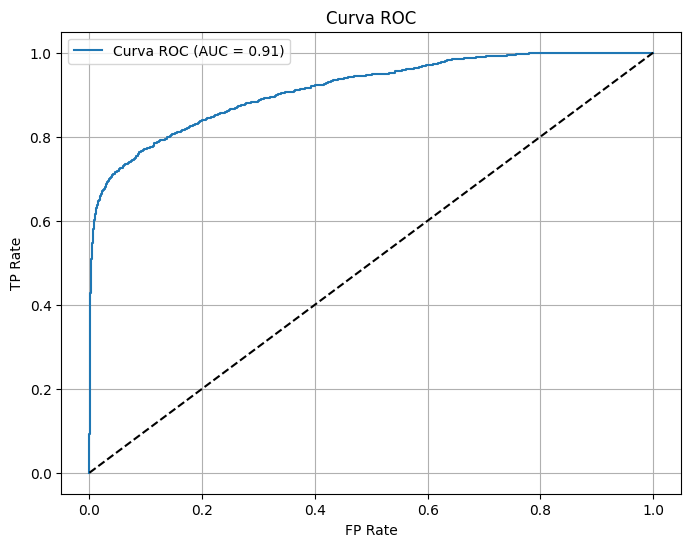

Gini: 0.83


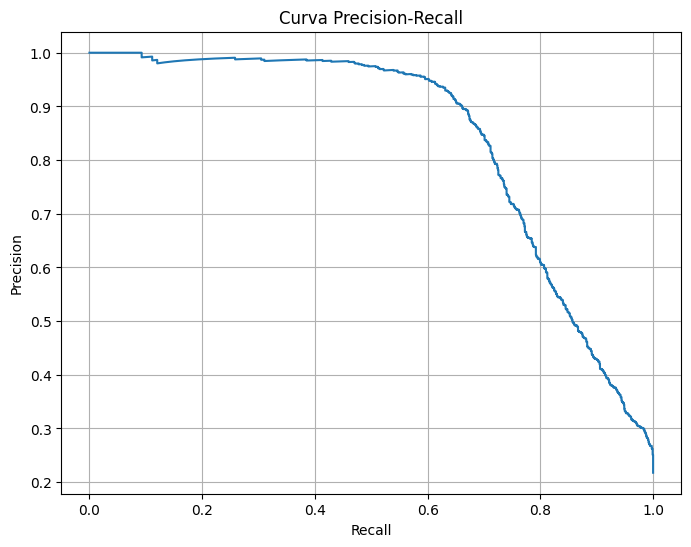

Classification Report:

              precision    recall  f1-score   support

         0.0       0.93      0.94      0.93      4431
         1.0       0.78      0.73      0.75      1231

    accuracy                           0.90      5662
   macro avg       0.85      0.83      0.84      5662
weighted avg       0.89      0.90      0.89      5662



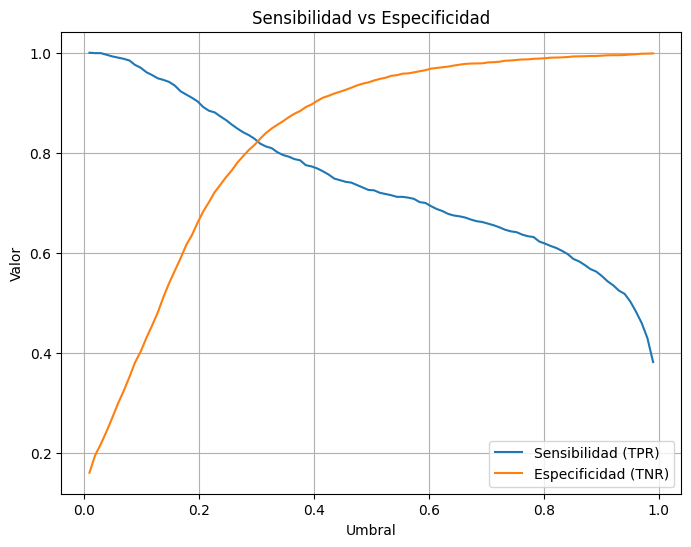

Matriz de confusion:



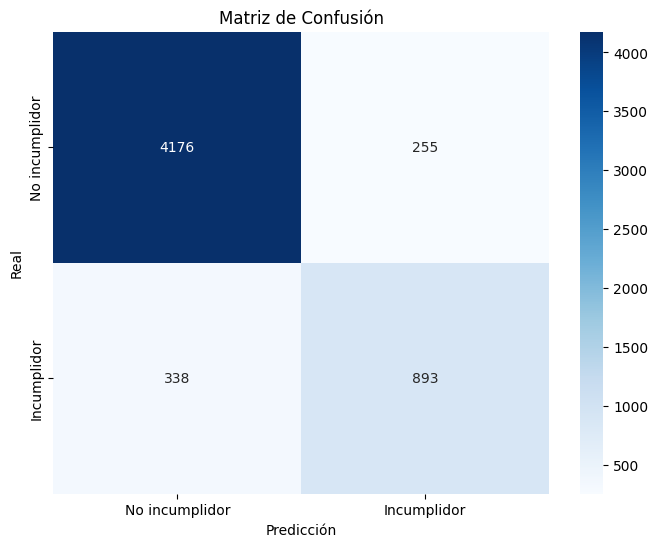

In [ ]:
# ROC & AUC
fpr, tpr, _ = roc_curve(y_test, y_pred_proba2)
roc_auc2 = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'Curva ROC (AUC = {roc_auc2:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("FP Rate")
plt.ylabel("TP Rate")
plt.title("Curva ROC")
plt.legend()
plt.grid(True)
plt.show()

# ------------------------------
# Gini
gini = 2 * roc_auc2 - 1
print(f"Gini: {gini:.2f}")

# ------------------------------
# Precision-Recall Curve
precision2, recall2, _ = precision_recall_curve(y_test, y_pred_proba2)

plt.figure(figsize=(8, 6))
plt.plot(recall2, precision2, label="Curva Precision-Recall")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Curva Precision-Recall")
plt.grid(True)
plt.show()

# ------------------------------
# Clasificación binaria (umbral = 0.5)
y_pred_label2 = (y_pred_proba2 >= 0.5).astype(int)
print("Classification Report:\n")
print(classification_report(y_test, y_pred_label2))

# ------------------------------
# Sensibilidad vs Especificidad por umbral
thresholds = np.linspace(0.01, 0.99, 100)
sensitivities2 = []
specificities2 = []

for t in thresholds:
    y_pred2 = (y_pred_proba2 >= t).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred2).ravel()
    sensitivities2.append(tp / (tp + fn))
    specificities2.append(tn / (tn + fp))

plt.figure(figsize=(8, 6))
plt.plot(thresholds, sensitivities2, label='Sensibilidad (TPR)')
plt.plot(thresholds, specificities2, label='Especificidad (TNR)')
plt.xlabel('Umbral')
plt.ylabel('Valor')
plt.title('Sensibilidad vs Especificidad')
plt.legend()
plt.grid(True)
plt.show()

# ------------------------------
# Matriz de confusion
print("Matriz de confusion:\n")
conf=confusion_matrix(y_test, y_pred_label2)


labels = ['No incumplidor', 'Incumplidor']


# Dibujar la matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(conf, annot=True, fmt='d', xticklabels=labels, yticklabels=labels, cmap = 'Blues')
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.title('Matriz de Confusión')
plt.show()


#### umbrales

In [ ]:
thresholds = np.arange(0, 1.01, 0.01)  # Umbrales de 0 a 1 con paso 0.01
f1_scores = []

for thresh in thresholds:
    y_pred_thresh = (y_pred_proba2 >= thresh).astype(int)
    score = f1_score(y_test, y_pred_thresh)
    f1_scores.append(score)

best_idx = np.argmax(f1_scores)
best_threshold = thresholds[best_idx]
best_f1 = f1_scores[best_idx]

print(f"Mejor umbral: {best_threshold}")
print(f"Mejor F1-score: {best_f1:.4f}")

In [ ]:
# Usando el mejor umbral ya calculado
y_pred_best_thresh = (y_pred_proba2 >= best_threshold).astype(int)

# Reporte de clasificación
print("Reporte de clasificación con mejor umbral:")
print(classification_report(y_test, y_pred_best_thresh))

# Matriz de confusión
print("Matriz de confusión:")
print(confusion_matrix(y_test, y_pred_best_thresh))

#### LIME

In [ ]:
mask = best_model_balanced.named_steps['feature_selection'].get_support()
selected_features = X_train_balanced.columns[mask]

# Crear el explainer
explainer = LimeTabularExplainer(
    training_data=X_train_balanced[selected_features].values,  # sin escalar, ya que el pipeline lo hace
    feature_names=selected_features.tolist(),
    class_names=['No Default', 'Default'],
    mode='classification',
    random_state=42
)

In [ ]:
selected_features

Index(['person_emp_length', 'loan_grade', 'loan_int_rate',
       'loan_percent_income', 'cb_person_default_on_file',
       'cb_person_cred_hist_length', 'log_person_income',
       'person_home_ownership_OTHER', 'person_home_ownership_OWN',
       'person_home_ownership_RENT', 'loan_intent_EDUCATION',
       'loan_intent_HOMEIMPROVEMENT', 'loan_intent_MEDICAL',
       'loan_intent_PERSONAL', 'loan_intent_VENTURE'],
      dtype='object')

#### ejemplo 1

In [ ]:
# Selecciona una fila del test set
i = 1185
instance = X_test_aligned.iloc[i][selected_features]

# Generar la explicación
exp = explainer.explain_instance(
    data_row=instance.values,  # datos sin escalar
    predict_fn=best_model_balanced.predict_proba , # el pipeline ya hace el escalado y todo
    num_samples =10000 ,
    num_features =10
)

# resultados
exp.show_in_notebook()
print("Fidelidad local (R²):", exp.score)
print(exp.as_list())

Fidelidad local (R²): 0.40044407349308864
[('loan_percent_income > 0.28', 0.33738376159694905), ('loan_grade <= 1.00', -0.23165306121880544), ('log_person_income <= 10.45', 0.21106757731116438), ('person_home_ownership_OWN <= 0.00', 0.16881426995388935), ('loan_intent_VENTURE <= 0.00', 0.1378077880459851), ('0.00 < person_home_ownership_RENT <= 1.00', 0.10780169837183089), ('loan_int_rate <= 8.94', -0.10232059353238322), ('person_home_ownership_OTHER <= 0.00', -0.10052067572589708), ('loan_intent_HOMEIMPROVEMENT <= 0.00', -0.09241529368958296), ('loan_intent_EDUCATION <= 0.00', 0.08713551049811086)]


In [ ]:
log_income_val = instance['log_person_income']
income_real = np.exp(log_income_val)

print(f"Ingreso anual real: {income_real:.2f}")

Ingreso anual real: 24000.00


In [ ]:
print(exp.predict_proba)

[0.05569811 0.94430189]


Es un R² (coeficiente de determinación) entre el modelo lineal local de LIME y las predicciones del modelo complejo en los puntos perturbados.
Cuanto más cerca de 1, mejor se ha aproximado localmente.

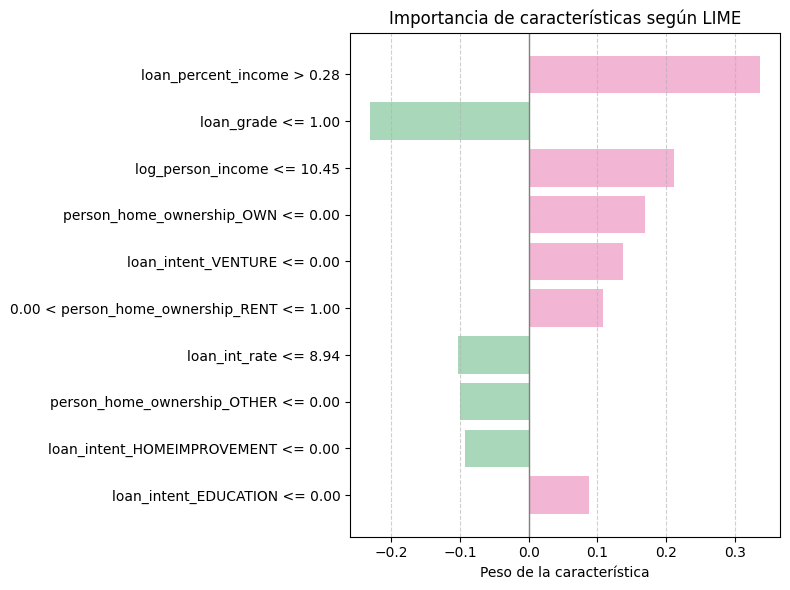

In [ ]:
# Obtenemos la explicación como lista de tuplas (feature, peso)
exp_list = exp.as_list()
features = [f for f, _ in exp_list]
weights = [w for _, w in exp_list]

# Colores: asigna según el signo del peso
colors = ['#F2B5D4' if w > 0 else '#A8D8B9' for w in weights]  # positivo = clase 1

# Gráfico personalizado
plt.figure(figsize=(8, 6))
bars = plt.barh(range(len(features)), weights, color=colors)
plt.yticks(range(len(features)), features)
plt.xlabel("Peso de la característica")
plt.title("Importancia de características según LIME")
plt.axvline(0, color='grey', lw=1)
plt.grid(True, axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.gca().invert_yaxis()  # opcional: pone la más importante arriba
plt.show()

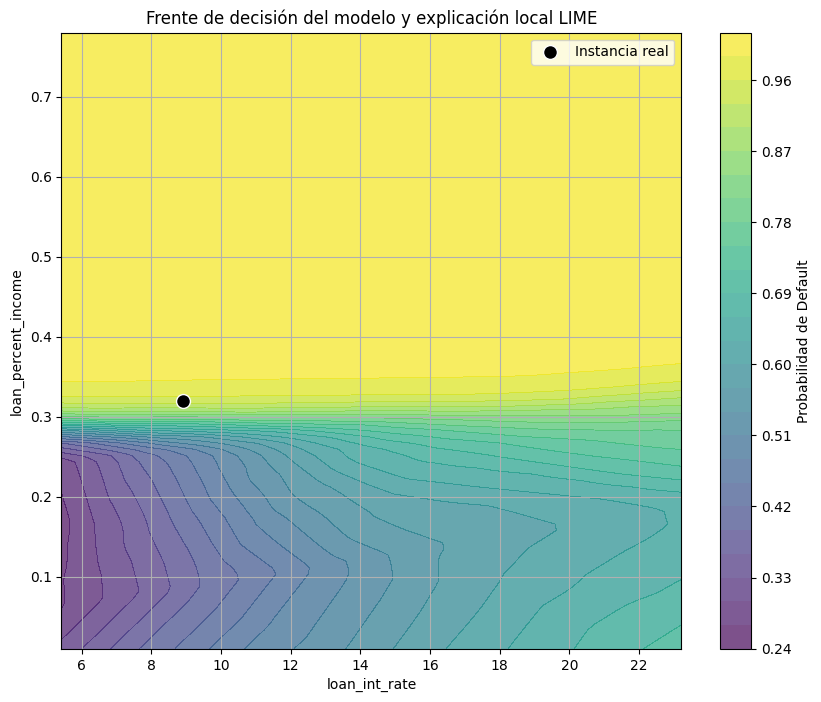

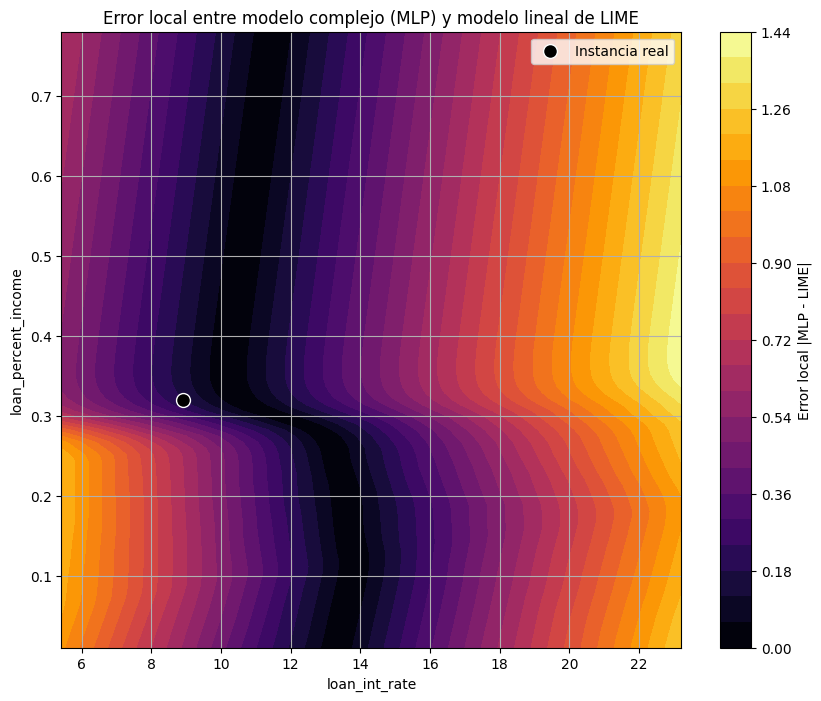

In [ ]:
#  Variables importantes según LIME
var1 = 'loan_int_rate'
var2 = 'loan_percent_income'

# Generar la explicación local con LIME
exp = explainer.explain_instance(
    data_row=instance.values,
    predict_fn=best_model_balanced.predict_proba,
    num_samples=10000,
    num_features=10
)

# Crear rango para las dos variables seleccionadas
v1_range = np.linspace(X_train_balanced[var1].min(), X_train_balanced[var1].max(), 100)
v2_range = np.linspace(X_train_balanced[var2].min(), X_train_balanced[var2].max(), 100)
xx, yy = np.meshgrid(v1_range, v2_range)

# Crear el grid de puntos donde solo var1 y var2 cambian
grid_data = np.tile(instance.values, (xx.size, 1))
idx_v1 = selected_features.get_loc(var1)
idx_v2 = selected_features.get_loc(var2)
grid_data[:, idx_v1] = xx.ravel()
grid_data[:, idx_v2] = yy.ravel()

# Predicción del modelo original (MLP) sobre el grid
Z = best_model_balanced.predict_proba(grid_data)[:, 1].reshape(xx.shape)

# ---- Parte 1: Visualización del modelo y perturbaciones ----
plt.figure(figsize=(10, 8))
cmap = plt.cm.viridis
contour = plt.contourf(xx, yy, Z, levels=25, cmap=cmap, alpha=0.7)
plt.colorbar(contour, label='Probabilidad de Default')

# Instancia real
plt.scatter(instance[var1], instance[var2], color='black', edgecolor='white', s=100, label='Instancia real')

# Muestras perturbadas usadas por LIME
if hasattr(exp, 'mapped_data'):
    perturbed = exp.mapped_data[:, [idx_v1, idx_v2]]
    plt.scatter(perturbed[:, 0], perturbed[:, 1], c=exp.local_pred, cmap='bwr', s=20, alpha=0.6, label='Muestras LIME')

# Score R² local
plt.title(f'Frente de decisión del modelo y explicación local LIME')
plt.xlabel(var1)
plt.ylabel(var2)
plt.legend()
plt.grid(True)
plt.show()


# ---- Parte 2: Visualizar error local entre MLP y modelo lineal de LIME ----

# Construir predicción local del modelo lineal de LIME
lime_coefs = dict(exp.local_exp[1])  # clase 1 = default
lime_weights = np.zeros(len(selected_features))
for i, w in lime_coefs.items():
    lime_weights[i] = w

Z_lime = np.dot(grid_data, lime_weights) + exp.intercept[1]
Z_lime = Z_lime.reshape(xx.shape)
# Asegura que sean floats
Z = Z.astype(float)
Z_lime = Z_lime.astype(float)

# Sustituye valores no finitos por nan y luego reemplaza con 0 o media si quieres
Z[np.isnan(Z)] = 0
Z[np.isinf(Z)] = 0
Z_lime[np.isnan(Z_lime)] = 0
Z_lime[np.isinf(Z_lime)] = 0

# Diferencia absoluta entre MLP y LIME en el grid
diff = np.abs(Z - Z_lime)

# Gráfico del error local
plt.figure(figsize=(10, 8))
contour = plt.contourf(xx, yy, diff, levels=25, cmap='inferno')
plt.colorbar(contour, label='Error local |MLP - LIME|')
plt.scatter(instance[var1], instance[var2], color='black', edgecolor='white', s=100, label='Instancia real')

plt.title('Error local entre modelo complejo (MLP) y modelo lineal de LIME')
plt.xlabel(var1)
plt.ylabel(var2)
plt.legend()
plt.grid(True)
plt.show()


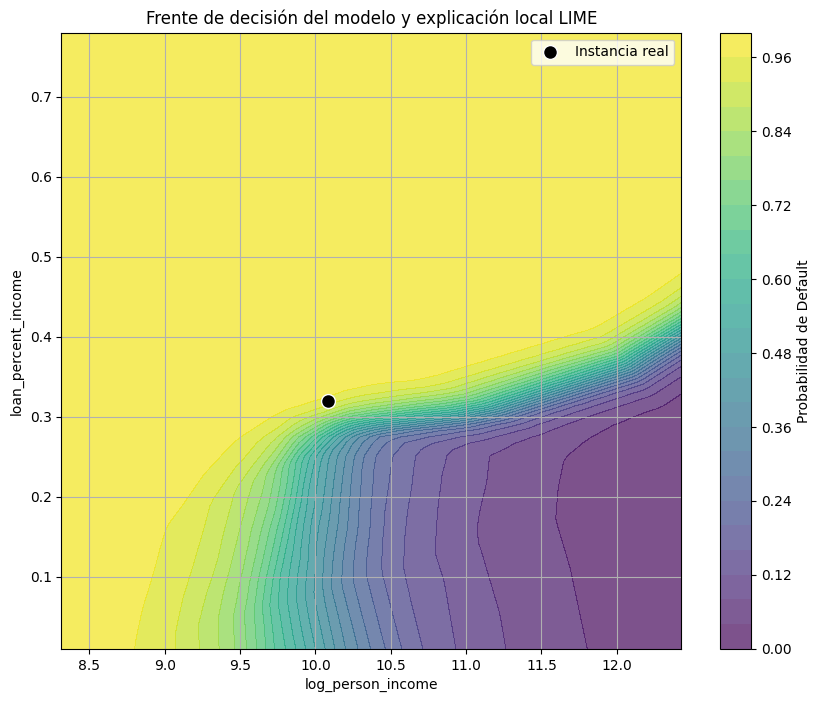

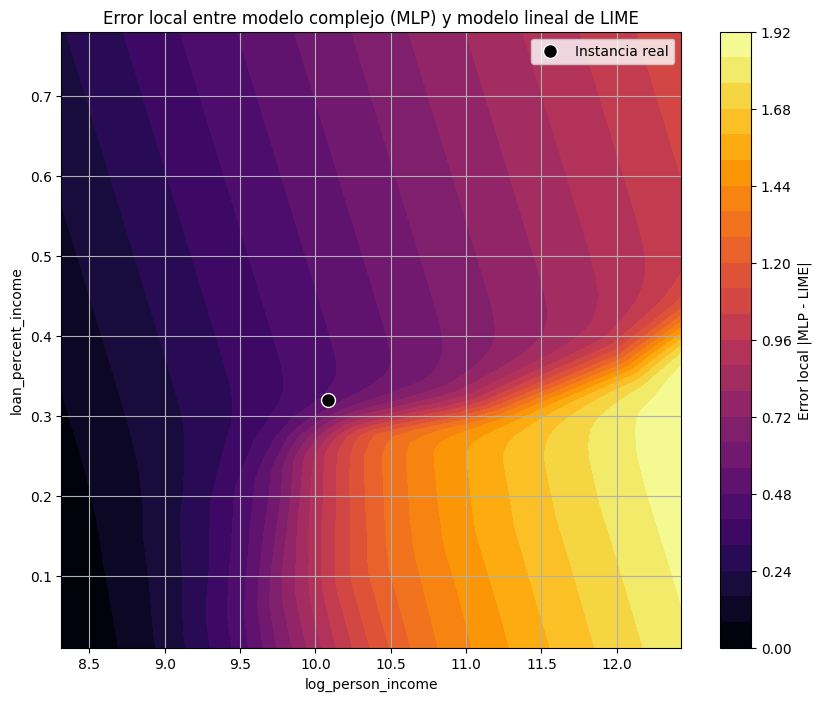

In [ ]:
#  Variables importantes según LIME
var1 = 'log_person_income'
var2 = 'loan_percent_income'

# Generar la explicación local con LIME
exp = explainer.explain_instance(
    data_row=instance.values,
    predict_fn=best_model_balanced.predict_proba,
    num_samples=10000,
    num_features=10
)

# Crear rango para las dos variables seleccionadas
v1_range = np.linspace(X_train_balanced[var1].min(), X_train_balanced[var1].max(), 100)
v2_range = np.linspace(X_train_balanced[var2].min(), X_train_balanced[var2].max(), 100)
xx, yy = np.meshgrid(v1_range, v2_range)

# Crear el grid de puntos donde solo var1 y var2 cambian
grid_data = np.tile(instance.values, (xx.size, 1))
idx_v1 = selected_features.get_loc(var1)
idx_v2 = selected_features.get_loc(var2)
grid_data[:, idx_v1] = xx.ravel()
grid_data[:, idx_v2] = yy.ravel()

# Predicción del modelo original (MLP) sobre el grid
Z = best_model_balanced.predict_proba(grid_data)[:, 1].reshape(xx.shape)

# ---- Parte 1: Visualización del modelo y perturbaciones ----
plt.figure(figsize=(10, 8))
cmap = plt.cm.viridis
contour = plt.contourf(xx, yy, Z, levels=25, cmap=cmap, alpha=0.7)
plt.colorbar(contour, label='Probabilidad de Default')

# Instancia real
plt.scatter(instance[var1], instance[var2], color='black', edgecolor='white', s=100, label='Instancia real')

# Muestras perturbadas usadas por LIME
if hasattr(exp, 'mapped_data'):
    perturbed = exp.mapped_data[:, [idx_v1, idx_v2]]
    plt.scatter(perturbed[:, 0], perturbed[:, 1], c=exp.local_pred, cmap='bwr', s=20, alpha=0.6, label='Muestras LIME')

# Score R² local
plt.title(f'Frente de decisión del modelo y explicación local LIME')
plt.xlabel(var1)
plt.ylabel(var2)
plt.legend()
plt.grid(True)
plt.show()


# ---- Parte 2: Visualizar error local entre MLP y modelo lineal de LIME ----

# Construir predicción local del modelo lineal de LIME
lime_coefs = dict(exp.local_exp[1])  # clase 1 = default
lime_weights = np.zeros(len(selected_features))
for i, w in lime_coefs.items():
    lime_weights[i] = w

Z_lime = np.dot(grid_data, lime_weights) + exp.intercept[1]
Z_lime = Z_lime.reshape(xx.shape)
# Asegura que sean floats
Z = Z.astype(float)
Z_lime = Z_lime.astype(float)

# Sustituye valores no finitos por nan y luego reemplaza con 0 o media si quieres
Z[np.isnan(Z)] = 0
Z[np.isinf(Z)] = 0
Z_lime[np.isnan(Z_lime)] = 0
Z_lime[np.isinf(Z_lime)] = 0

# Diferencia absoluta entre MLP y LIME en el grid
diff = np.abs(Z - Z_lime)

# Gráfico del error local
plt.figure(figsize=(10, 8))
contour = plt.contourf(xx, yy, diff, levels=25, cmap='inferno')
plt.colorbar(contour, label='Error local |MLP - LIME|')
plt.scatter(instance[var1], instance[var2], color='black', edgecolor='white', s=100, label='Instancia real')

plt.title('Error local entre modelo complejo (MLP) y modelo lineal de LIME')
plt.xlabel(var1)
plt.ylabel(var2)
plt.legend()
plt.grid(True)
plt.show()


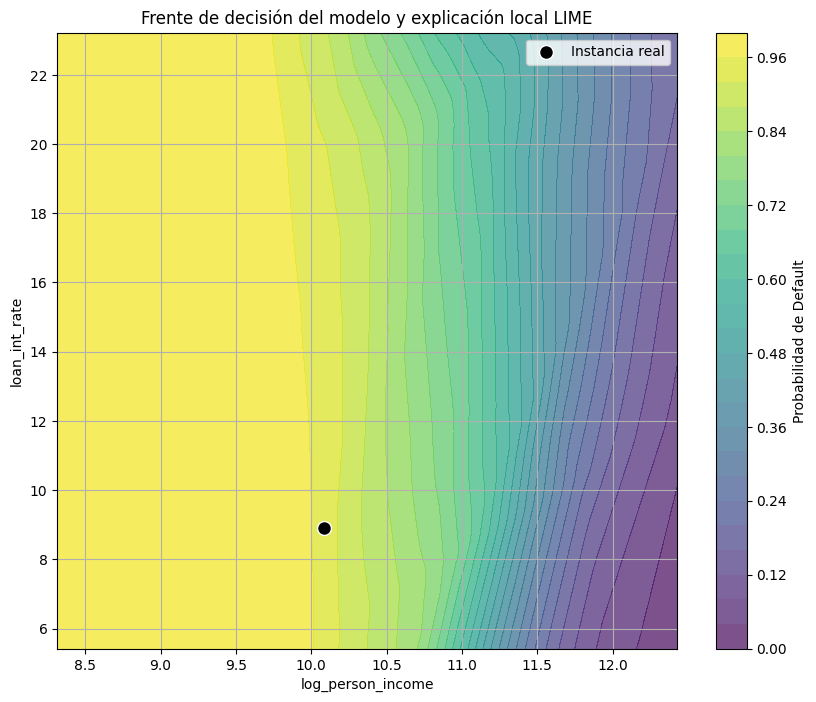

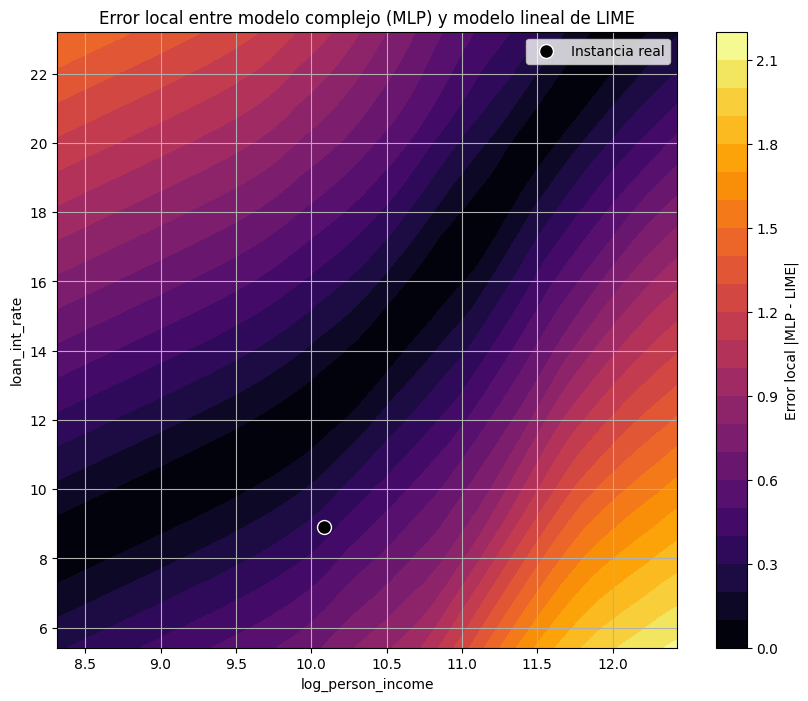

In [ ]:
#  Variables importantes según LIME
var1 = 'log_person_income'
var2 = 'loan_int_rate'

# Generar la explicación local con LIME
exp = explainer.explain_instance(
    data_row=instance.values,
    predict_fn=best_model_balanced.predict_proba,
    num_samples=10000,
    num_features=10
)

# Crear rango para las dos variables seleccionadas
v1_range = np.linspace(X_train_balanced[var1].min(), X_train_balanced[var1].max(), 100)
v2_range = np.linspace(X_train_balanced[var2].min(), X_train_balanced[var2].max(), 100)
xx, yy = np.meshgrid(v1_range, v2_range)

# Crear el grid de puntos donde solo var1 y var2 cambian
grid_data = np.tile(instance.values, (xx.size, 1))
idx_v1 = selected_features.get_loc(var1)
idx_v2 = selected_features.get_loc(var2)
grid_data[:, idx_v1] = xx.ravel()
grid_data[:, idx_v2] = yy.ravel()

# Predicción del modelo original (MLP) sobre el grid
Z = best_model_balanced.predict_proba(grid_data)[:, 1].reshape(xx.shape)

# ---- Parte 1: Visualización del modelo y perturbaciones ----
plt.figure(figsize=(10, 8))
cmap = plt.cm.viridis
contour = plt.contourf(xx, yy, Z, levels=25, cmap=cmap, alpha=0.7)
plt.colorbar(contour, label='Probabilidad de Default')

# Instancia real
plt.scatter(instance[var1], instance[var2], color='black', edgecolor='white', s=100, label='Instancia real')

# Muestras perturbadas usadas por LIME
if hasattr(exp, 'mapped_data'):
    perturbed = exp.mapped_data[:, [idx_v1, idx_v2]]
    plt.scatter(perturbed[:, 0], perturbed[:, 1], c=exp.local_pred, cmap='bwr', s=20, alpha=0.6, label='Muestras LIME')

# Score R² local
plt.title(f'Frente de decisión del modelo y explicación local LIME')
plt.xlabel(var1)
plt.ylabel(var2)
plt.legend()
plt.grid(True)
plt.show()


# ---- Parte 2: Visualizar error local entre MLP y modelo lineal de LIME ----

# Construir predicción local del modelo lineal de LIME
lime_coefs = dict(exp.local_exp[1])  # clase 1 = default
lime_weights = np.zeros(len(selected_features))
for i, w in lime_coefs.items():
    lime_weights[i] = w

Z_lime = np.dot(grid_data, lime_weights) + exp.intercept[1]
Z_lime = Z_lime.reshape(xx.shape)
# Asegura que sean floats
Z = Z.astype(float)
Z_lime = Z_lime.astype(float)

# Sustituye valores no finitos por nan y luego reemplaza con 0 o media si quieres
Z[np.isnan(Z)] = 0
Z[np.isinf(Z)] = 0
Z_lime[np.isnan(Z_lime)] = 0
Z_lime[np.isinf(Z_lime)] = 0

# Diferencia absoluta entre MLP y LIME en el grid
diff = np.abs(Z - Z_lime)

# Gráfico del error local
plt.figure(figsize=(10, 8))
contour = plt.contourf(xx, yy, diff, levels=25, cmap='inferno')
plt.colorbar(contour, label='Error local |MLP - LIME|')
plt.scatter(instance[var1], instance[var2], color='black', edgecolor='white', s=100, label='Instancia real')

plt.title('Error local entre modelo complejo (MLP) y modelo lineal de LIME')
plt.xlabel(var1)
plt.ylabel(var2)
plt.legend()
plt.grid(True)
plt.show()


#### ejemplo 2

In [ ]:
# Selecciona una fila del test set
i = 4939
instance = X_test_aligned.iloc[i][selected_features]

# Generar la explicación
exp = explainer.explain_instance(
    data_row=instance.values,  # datos sin escalar
    predict_fn=best_model_balanced.predict_proba , # el pipeline ya hace el escalado y todo
    num_samples =10000 ,
    num_features =10
)

# resultados
exp.show_in_notebook()
print("Fidelidad local (R²):", exp.score)
print(exp.as_list())

Fidelidad local (R²): 0.2504462091307559
[('loan_grade <= 1.00', -0.22751770329524718), ('person_home_ownership_OWN <= 0.00', 0.19770879664302735), ('loan_intent_VENTURE > 0.00', -0.16910290019477275), ('log_person_income > 11.20', -0.15558594902812983), ('loan_percent_income <= 0.10', -0.12521978956659477), ('loan_int_rate <= 8.94', -0.10344810230384581), ('person_home_ownership_RENT <= 0.00', -0.10130920615496787), ('loan_intent_HOMEIMPROVEMENT <= 0.00', -0.07831736916184098), ('cb_person_default_on_file <= 0.00', 0.07774000657297091), ('loan_intent_EDUCATION <= 0.00', 0.06266186294807131)]


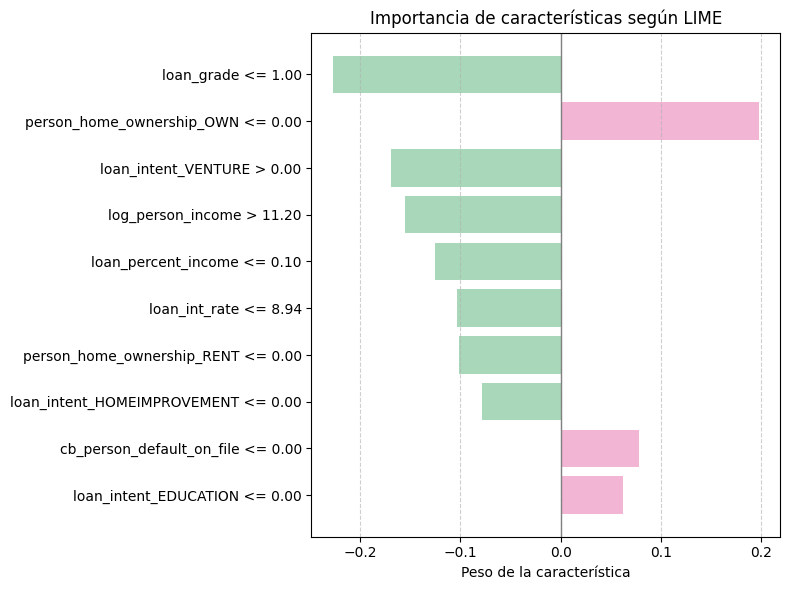

In [ ]:
# Obtenemos la explicación como lista de tuplas (feature, peso)
exp_list = exp.as_list()
features = [f for f, _ in exp_list]
weights = [w for _, w in exp_list]

# Colores: asigna según el signo del peso
colors = ['#F2B5D4' if w > 0 else '#A8D8B9' for w in weights]  # positivo = clase 1

# Gráfico personalizado
plt.figure(figsize=(8, 6))
bars = plt.barh(range(len(features)), weights, color=colors)
plt.yticks(range(len(features)), features)
plt.xlabel("Peso de la característica")
plt.title("Importancia de características según LIME")
plt.axvline(0, color='grey', lw=1)
plt.grid(True, axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.gca().invert_yaxis()  # opcional: pone la más importante arriba
plt.show()

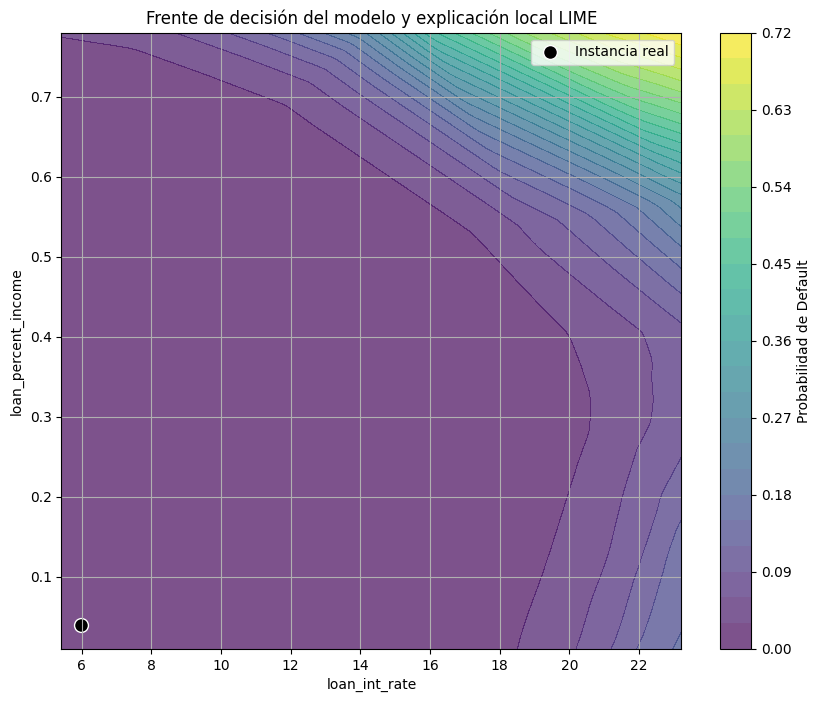

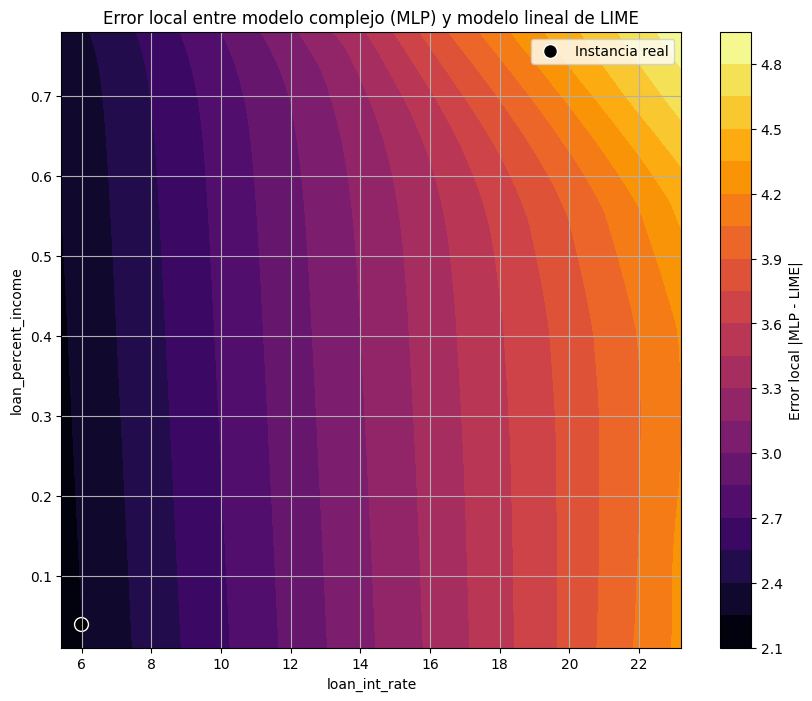

In [ ]:
#  Variables importantes según LIME
var1 = 'loan_int_rate'
var2 = 'loan_percent_income'

# Generar la explicación local con LIME
exp = explainer.explain_instance(
    data_row=instance.values,
    predict_fn=best_model_balanced.predict_proba,
    num_samples=10000,
    num_features=10
)

# Crear rango para las dos variables seleccionadas
v1_range = np.linspace(X_train_balanced[var1].min(), X_train_balanced[var1].max(), 100)
v2_range = np.linspace(X_train_balanced[var2].min(), X_train_balanced[var2].max(), 100)
xx, yy = np.meshgrid(v1_range, v2_range)

# Crear el grid de puntos donde solo var1 y var2 cambian
grid_data = np.tile(instance.values, (xx.size, 1))
idx_v1 = selected_features.get_loc(var1)
idx_v2 = selected_features.get_loc(var2)
grid_data[:, idx_v1] = xx.ravel()
grid_data[:, idx_v2] = yy.ravel()

# Predicción del modelo original (MLP) sobre el grid
Z = best_model_balanced.predict_proba(grid_data)[:, 1].reshape(xx.shape)

# ---- Parte 1: Visualización del modelo y perturbaciones ----
plt.figure(figsize=(10, 8))
cmap = plt.cm.viridis
contour = plt.contourf(xx, yy, Z, levels=25, cmap=cmap, alpha=0.7)
plt.colorbar(contour, label='Probabilidad de Default')

# Instancia real
plt.scatter(instance[var1], instance[var2], color='black', edgecolor='white', s=100, label='Instancia real')

# Muestras perturbadas usadas por LIME
if hasattr(exp, 'mapped_data'):
    perturbed = exp.mapped_data[:, [idx_v1, idx_v2]]
    plt.scatter(perturbed[:, 0], perturbed[:, 1], c=exp.local_pred, cmap='bwr', s=20, alpha=0.6, label='Muestras LIME')

# Score R² local
plt.title(f'Frente de decisión del modelo y explicación local LIME')
plt.xlabel(var1)
plt.ylabel(var2)
plt.legend()
plt.grid(True)
plt.show()


# ---- Parte 2: Visualizar error local entre MLP y modelo lineal de LIME ----

# Construir predicción local del modelo lineal de LIME
lime_coefs = dict(exp.local_exp[1])  # clase 1 = default
lime_weights = np.zeros(len(selected_features))
for i, w in lime_coefs.items():
    lime_weights[i] = w

Z_lime = np.dot(grid_data, lime_weights) + exp.intercept[1]
Z_lime = Z_lime.reshape(xx.shape)
# Asegura que sean floats
Z = Z.astype(float)
Z_lime = Z_lime.astype(float)

# Sustituye valores no finitos por nan y luego reemplaza con 0 o media si quieres
Z[np.isnan(Z)] = 0
Z[np.isinf(Z)] = 0
Z_lime[np.isnan(Z_lime)] = 0
Z_lime[np.isinf(Z_lime)] = 0

# Diferencia absoluta entre MLP y LIME en el grid
diff = np.abs(Z - Z_lime)

# Gráfico del error local
plt.figure(figsize=(10, 8))
contour = plt.contourf(xx, yy, diff, levels=25, cmap='inferno')
plt.colorbar(contour, label='Error local |MLP - LIME|')
plt.scatter(instance[var1], instance[var2], color='black', edgecolor='white', s=100, label='Instancia real')

plt.title('Error local entre modelo complejo (MLP) y modelo lineal de LIME')
plt.xlabel(var1)
plt.ylabel(var2)
plt.legend()
plt.grid(True)
plt.show()

#### ejemplo 3

In [ ]:
# Selecciona una fila del test set
i = 150
instance = X_test_aligned.iloc[i][selected_features]

# Generar la explicación
exp = explainer.explain_instance(
    data_row=instance.values,  # datos sin escalar
    predict_fn=best_model_balanced.predict_proba , # el pipeline ya hace el escalado y todo
    num_samples =10000 ,
    num_features =10
)

# resultados
exp.show_in_notebook()
print("Fidelidad local (R²):", exp.score)
print(exp.as_list())

Fidelidad local (R²): 0.37282741991097046
[('loan_grade > 4.00', 0.43004627685253555), ('loan_percent_income > 0.28', 0.3403503873809708), ('person_home_ownership_OWN <= 0.00', 0.1835736500504361), ('loan_intent_VENTURE <= 0.00', 0.15137381755760115), ('0.00 < person_home_ownership_RENT <= 1.00', 0.10834687509503674), ('loan_int_rate > 14.42', 0.10127132843546106), ('cb_person_default_on_file <= 0.00', 0.08576794027217392), ('loan_intent_HOMEIMPROVEMENT <= 0.00', -0.07947047438944703), ('loan_intent_EDUCATION > 0.00', -0.0710031711156801), ('person_home_ownership_OTHER <= 0.00', -0.05340170724875469)]


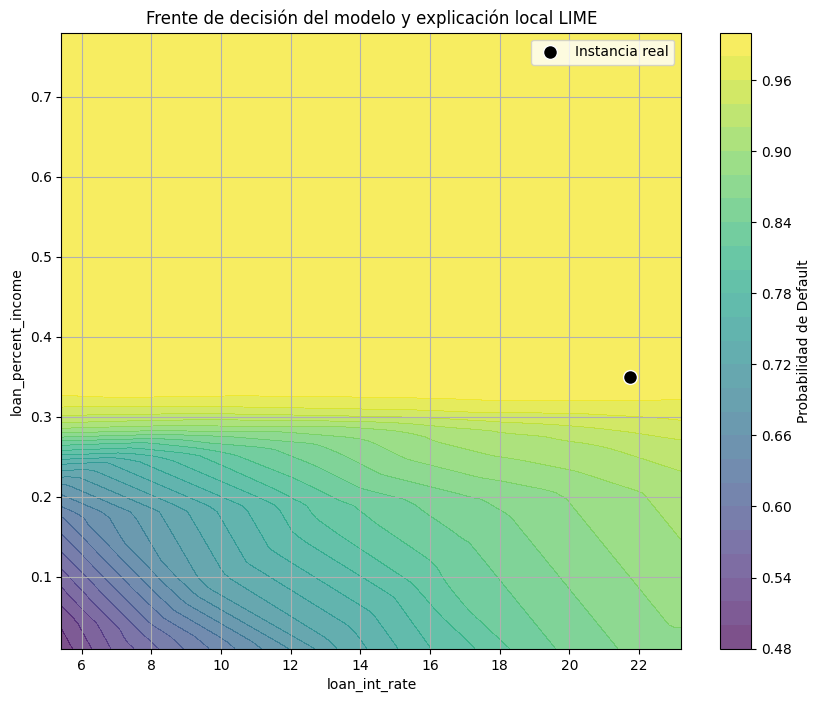

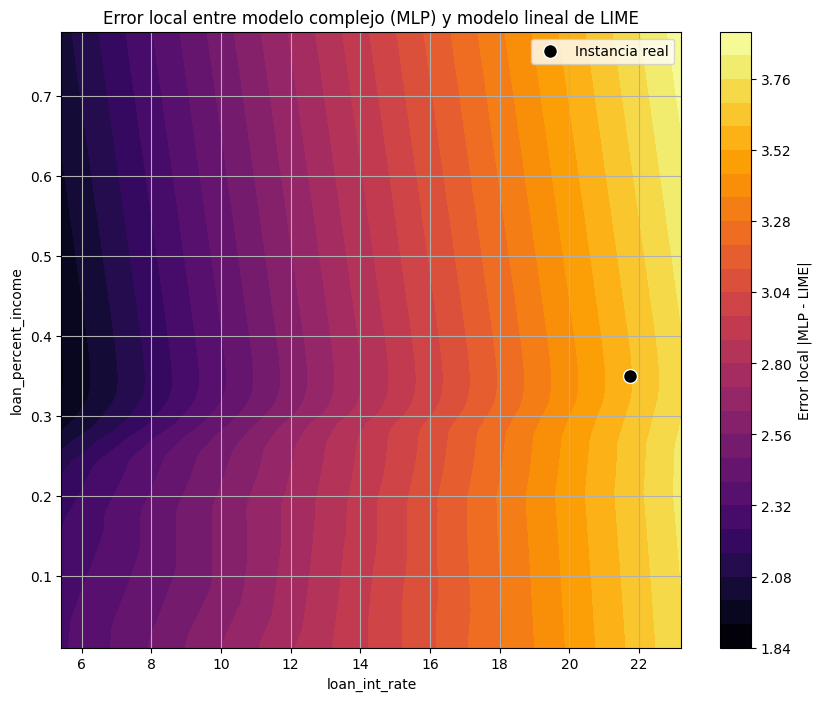

In [ ]:
#  Variables importantes según LIME
var1 = 'loan_int_rate'
var2 = 'loan_percent_income'

# Generar la explicación local con LIME
exp = explainer.explain_instance(
    data_row=instance.values,
    predict_fn=best_model_balanced.predict_proba,
    num_samples=10000,
    num_features=10
)

# Crear rango para las dos variables seleccionadas
v1_range = np.linspace(X_train_balanced[var1].min(), X_train_balanced[var1].max(), 100)
v2_range = np.linspace(X_train_balanced[var2].min(), X_train_balanced[var2].max(), 100)
xx, yy = np.meshgrid(v1_range, v2_range)

# Crear el grid de puntos donde solo var1 y var2 cambian
grid_data = np.tile(instance.values, (xx.size, 1))
idx_v1 = selected_features.get_loc(var1)
idx_v2 = selected_features.get_loc(var2)
grid_data[:, idx_v1] = xx.ravel()
grid_data[:, idx_v2] = yy.ravel()

# Predicción del modelo original (MLP) sobre el grid
Z = best_model_balanced.predict_proba(grid_data)[:, 1].reshape(xx.shape)

# ---- Parte 1: Visualización del modelo y perturbaciones ----
plt.figure(figsize=(10, 8))
cmap = plt.cm.viridis
contour = plt.contourf(xx, yy, Z, levels=25, cmap=cmap, alpha=0.7)
plt.colorbar(contour, label='Probabilidad de Default')

# Instancia real
plt.scatter(instance[var1], instance[var2], color='black', edgecolor='white', s=100, label='Instancia real')

# Muestras perturbadas usadas por LIME
if hasattr(exp, 'mapped_data'):
    perturbed = exp.mapped_data[:, [idx_v1, idx_v2]]
    plt.scatter(perturbed[:, 0], perturbed[:, 1], c=exp.local_pred, cmap='bwr', s=20, alpha=0.6, label='Muestras LIME')

# Score R² local
plt.title(f'Frente de decisión del modelo y explicación local LIME')
plt.xlabel(var1)
plt.ylabel(var2)
plt.legend()
plt.grid(True)
plt.show()


# ---- Parte 2: Visualizar error local entre MLP y modelo lineal de LIME ----

# Construir predicción local del modelo lineal de LIME
lime_coefs = dict(exp.local_exp[1])  # clase 1 = default
lime_weights = np.zeros(len(selected_features))
for i, w in lime_coefs.items():
    lime_weights[i] = w

Z_lime = np.dot(grid_data, lime_weights) + exp.intercept[1]
Z_lime = Z_lime.reshape(xx.shape)
# Asegura que sean floats
Z = Z.astype(float)
Z_lime = Z_lime.astype(float)

# Sustituye valores no finitos por nan y luego reemplaza con 0 o media si quieres
Z[np.isnan(Z)] = 0
Z[np.isinf(Z)] = 0
Z_lime[np.isnan(Z_lime)] = 0
Z_lime[np.isinf(Z_lime)] = 0

# Diferencia absoluta entre MLP y LIME en el grid
diff = np.abs(Z - Z_lime)

# Gráfico del error local
plt.figure(figsize=(10, 8))
contour = plt.contourf(xx, yy, diff, levels=25, cmap='inferno')
plt.colorbar(contour, label='Error local |MLP - LIME|')
plt.scatter(instance[var1], instance[var2], color='black', edgecolor='white', s=100, label='Instancia real')

plt.title('Error local entre modelo complejo (MLP) y modelo lineal de LIME')
plt.xlabel(var1)
plt.ylabel(var2)
plt.legend()
plt.grid(True)
plt.show()

#### ejemplo 4

In [ ]:
# Selecciona una fila del test set
i = 6
instance = X_test_aligned.iloc[i][selected_features]

# Generar la explicación
exp = explainer.explain_instance(
    data_row=instance.values,  # datos sin escalar
    predict_fn=best_model_balanced.predict_proba , # el pipeline ya hace el escalado y todo
    num_samples =10000 ,
    num_features =10
)

# resultados
exp.show_in_notebook()
print("Fidelidad local (R²):", exp.score)
print(exp.as_list())

Fidelidad local (R²): 0.15029548153101568
[('log_person_income > 11.20', -0.1587370843397571), ('person_home_ownership_OWN <= 0.00', 0.15782477203521114), ('loan_intent_VENTURE <= 0.00', 0.13643690908742181), ('0.10 < loan_percent_income <= 0.17', -0.12593020479559747), ('1.00 < loan_grade <= 2.00', -0.1210028997210417), ('person_home_ownership_OTHER <= 0.00', -0.11926707206292868), ('0.00 < person_home_ownership_RENT <= 1.00', 0.10482746124067367), ('cb_person_default_on_file <= 0.00', 0.06379434010113576), ('loan_intent_HOMEIMPROVEMENT <= 0.00', -0.061705927212020194), ('loan_intent_EDUCATION <= 0.00', 0.05692272452354426)]


In [ ]:
log_income_val = instance['log_person_income']
income_real = np.exp(log_income_val)

print(f"Ingreso anual real: {income_real:.2f}")

Ingreso anual real: 88000.00


In [ ]:
print(exp.predict_proba)

[0.91890603 0.08109397]


Ejecutado en otro cuaderno:

In [ ]:
lime_scores = []
indices = []

n_instances = len(X_test_aligned)

for i in range(n_instances):
    instance = X_test_aligned.iloc[i][selected_features]

    exp = explainer.explain_instance(
        data_row=instance.values,
        predict_fn=best_model_balanced.predict_proba
    )

    lime_scores.append(exp.score)
    indices.append(i)

lime_scores = np.array(lime_scores)

# Conteo por umbral
n_over_04 = np.sum(lime_scores > 0.4)
n_over_05 = np.sum(lime_scores > 0.5)
n_over_06 = np.sum(lime_scores > 0.6)

# Máximo score y su índice
max_score = np.max(lime_scores)
max_index = indices[np.argmax(lime_scores)]

# Resultados
print(f"Número de explicaciones con exp.score > 0.4: {n_over_04}")
print(f"Número de explicaciones con exp.score > 0.5: {n_over_05}")
print(f"Número de explicaciones con exp.score > 0.6: {n_over_06}")
print(f"\nMáximo exp.score: {max_score:.4f} (en la instancia {max_index})")

#corregir fallos

In [ ]:
# Ajuste manual: penaliza si hay historial de impago
adjusted_probs = y_pred_proba2 + 0.1 * X_test_aligned['cb_person_default_on_file'].astype(int)

# Nos aseguramos que las probabilidades sigan en el rango [0,1]
adjusted_probs = np.clip(adjusted_probs, 0, 1)

In [ ]:
fpr, tpr, _ = roc_curve(y_test, adjusted_probs)
roc_auc2 = auc(fpr, tpr)
precision2, recall2, _ = precision_recall_curve(y_test, adjusted_probs)
y_pred_label2 = (adjusted_probs >= 0.5).astype(int)
sensitivities2 = []
specificities2 = []
for t in thresholds:
    y_pred2 = (adjusted_probs >= t).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred2).ravel()
    sensitivities2.append(tp / (tp + fn))
    specificities2.append(tn / (tn + fp))



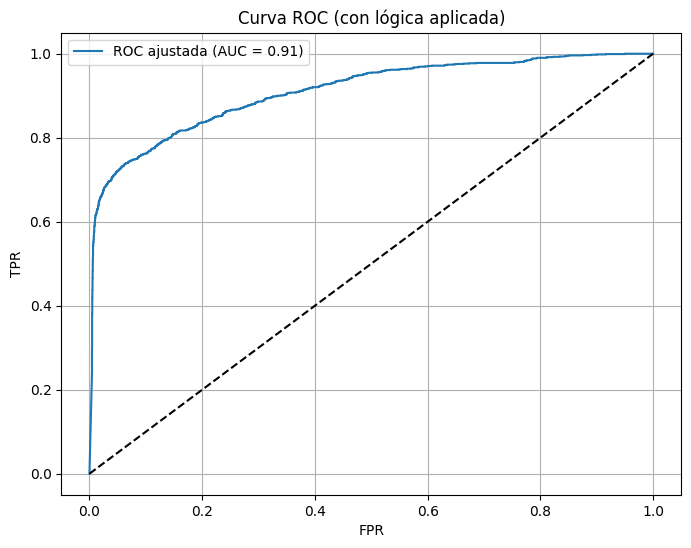

Gini ajustado: 0.82


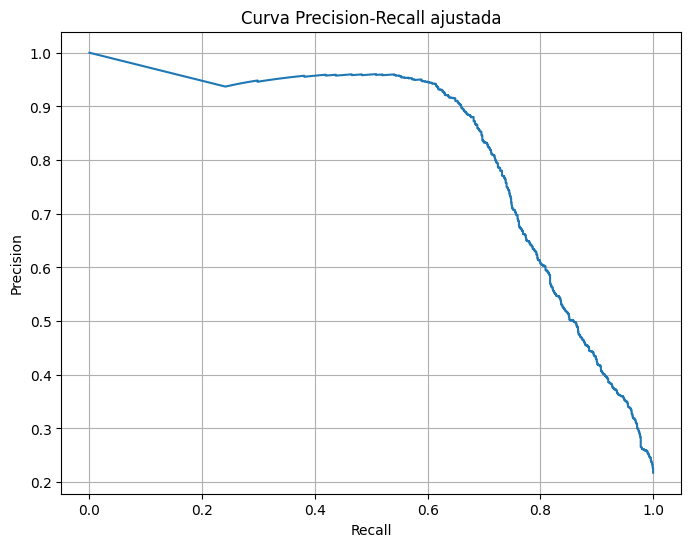

Classification Report:

              precision    recall  f1-score   support

         0.0       0.93      0.92      0.92      4431
         1.0       0.72      0.75      0.74      1231

    accuracy                           0.88      5662
   macro avg       0.83      0.83      0.83      5662
weighted avg       0.88      0.88      0.88      5662



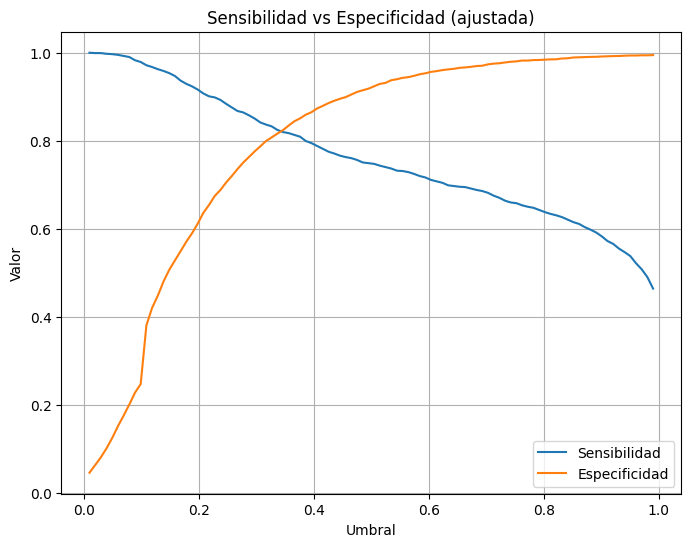

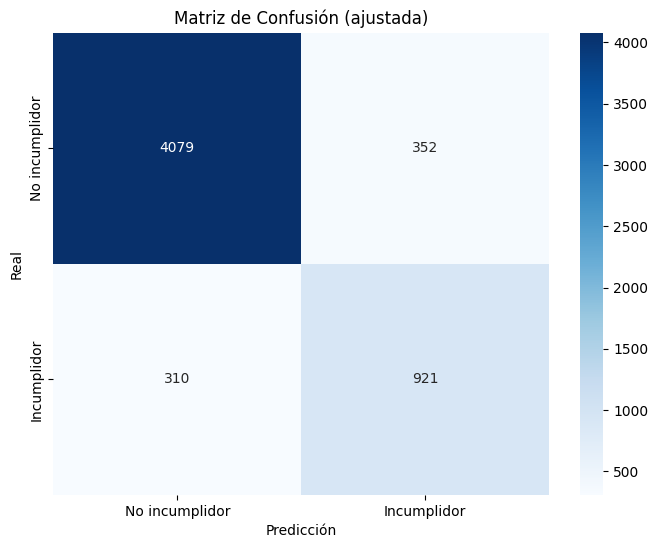

In [ ]:
# =====================
# 1. Cargar modelo y preparar datos
# =====================
best_mlp_balanced = joblib.load('mejor_balanced_mlp.pkl')
X_test_aligned = X_test[X_train_balanced.columns]

# =====================
# 2. Predicción original
# =====================
y_pred_proba = best_mlp_balanced.predict_proba(X_test_aligned)[:, 1]

# =====================
# 3. Ajuste lógico post-predicción
# =====================
# Penalizamos:
# - Si el préstamo es para VENTURE => +riesgo
# - Si tiene historial de impago => +riesgo

penalizacion = (
    0.1 * X_test_aligned['cb_person_default_on_file'].astype(int) +
    0.1 * X_test_aligned['loan_intent_VENTURE'].astype(int)  -    # tipo de préstamo riesgoso
    0.1 * X_test_aligned['person_home_ownership_OTHER'].astype(int)
)

adjusted_probs = y_pred_proba + penalizacion
adjusted_probs = np.clip(adjusted_probs, 0, 1)

# =====================
# 4. Evaluación con probabilidades ajustadas
# =====================
from sklearn.metrics import roc_curve, auc, classification_report, confusion_matrix, precision_recall_curve
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ROC y AUC
fpr, tpr, _ = roc_curve(y_test, adjusted_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC ajustada (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("Curva ROC (con lógica aplicada)")
plt.legend()
plt.grid(True)
plt.show()

# Gini
gini = 2 * roc_auc - 1
print(f"Gini ajustado: {gini:.2f}")

# Precision-Recall
precision, recall, _ = precision_recall_curve(y_test, adjusted_probs)

plt.figure(figsize=(8, 6))
plt.plot(recall, precision, label="Precisión vs Recall")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Curva Precision-Recall ajustada")
plt.grid(True)
plt.show()

# Clasificación binaria
y_pred_label = (adjusted_probs >= 0.5).astype(int)
print("Classification Report:\n")
print(classification_report(y_test, y_pred_label))

# Sensibilidad vs Especificidad
thresholds = np.linspace(0.01, 0.99, 100)
sensitivities, specificities = [], []

for t in thresholds:
    preds = (adjusted_probs >= t).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_test, preds).ravel()
    sensitivities.append(tp / (tp + fn))
    specificities.append(tn / (tn + fp))

plt.figure(figsize=(8, 6))
plt.plot(thresholds, sensitivities, label='Sensibilidad')
plt.plot(thresholds, specificities, label='Especificidad')
plt.xlabel('Umbral')
plt.ylabel('Valor')
plt.title('Sensibilidad vs Especificidad (ajustada)')
plt.legend()
plt.grid(True)
plt.show()

# Matriz de confusión
conf = confusion_matrix(y_test, y_pred_label)
labels = ['No incumplidor', 'Incumplidor']

plt.figure(figsize=(8, 6))
sns.heatmap(conf, annot=True, fmt='d', xticklabels=labels, yticklabels=labels, cmap='Blues')
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.title('Matriz de Confusión (ajustada)')
plt.show()


### Árbol de decisión balanceado

In [ ]:
# Creamos el modelo del árbol de decisión con class_weight='balanced'
tree = DecisionTreeClassifier(
    max_depth=4,          # profundidad máxima
    random_state=42,
    class_weight='balanced'  # Para reforzar balanceo en entrenamiento
)

# Entrenamos el modelo con los datos balanceados y escalados
tree.fit(X_train, y_train)

# Predicciones en test
y_pred_tree = tree.predict(X_test)
y_proba_tree = tree.predict_proba(X_test)[:, 1]

# Evaluamos
print("Report de clasificación:\n")
print(classification_report(y_test, y_pred_tree))



# Matriz de confusion
conf1=confusion_matrix(y_test, y_pred_tree)
labels = ['No incumplidor', 'Incumplidor']


# Dibujar la matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(conf1, annot=True, fmt='d', xticklabels=labels, yticklabels=labels, cmap = 'Blues')
plt.xlabel('Predicción')
plt.ylabel('Real')
plt.title('Matriz de Confusión')
plt.show()


roc_auc = roc_auc_score(y_test, y_proba_tree)
print(f"AUC: {roc_auc:.2f}")

In [ ]:
# Graficar el árbol
plt.figure(figsize=(20,10))
plot_tree(tree, feature_names=X_train.columns.tolist(), class_names=['No incumplidor', 'Incumplidor'], filled=True)
plt.show()

In [ ]:
# Exportar el árbol a formato DOT con nombres de variables
dot_data = export_graphviz(
    tree,
    out_file=None,
    feature_names=X_train.columns,  # <- Asegura que los nombres estén incluidos
    class_names=['No incumplidor', 'Incumplidor'],
    filled=True,
    rounded=True,
    special_characters=True
)

# Generar imagen con graphviz
graph = graphviz.Source(dot_data)
graph.format = 'png'
graph.render('arbol_decision_balanced', cleanup=True)

#### LIME

In [ ]:
feature_names = X_train.columns.tolist()
class_names = ['No incumplidor', 'Incumplidor']

explainer = LimeTabularExplainer(
    training_data=X_train.values,             # 2D array con los datos de entrenamiento
    training_labels=y_train.values,           # Etiquetas del entrenamiento
    mode='classification',                    # Tipo de tarea: clasificación
    feature_names=feature_names,              # Nombres de las características
    class_names=class_names,                  # Nombres de las clases
    discretize_continuous=True,               # Discretizar variables continuas para interpretabilidad
    feature_selection='auto',                 # Estrategia de selección de variables explicativas
    random_state=42                           # Semilla para reproducibilidad
)

# Elegir una instancia del conjunto de test para explicar
instancia = X_test.iloc[856                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                ]

# función para escalar los datos antes de meterselo a LIME, porque sino me daba el fallo de que ninguna variable pesaba.
def predict_proba_fn(x):
    return tree.predict_proba(x)

explanation = explainer.explain_instance(
    data_row=instancia,                      # Muestra a explicar
    predict_fn=predict_proba_fn,             # Función que devuelve las probabilidades del modelo
    num_features=10,                         # Número de variables (features) a mostrar en la explicación
    num_samples=5000,                        # Número de muestras perturbadas generadas para la explicación
    distance_metric='euclidean',             # Métrica de distancia usada para ponderar las muestras perturbadas
    model_regressor=None                     # Usamos la regresión ridge predeterminada de sklearn
)

# Mostrar la explicación
explanation.show_in_notebook(show_table=True, show_all=False)

print("Fidelidad local (R²):", explanation.score)

# Añadimos una nueva variable insignificante por definición para la clasificación según la variable objetivo

## Aleatoria

Lo hacemos de manera aleatoria:

In [942]:
df_train

,person_emp_length,loan_grade,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,log_person_income,person_home_ownership_OTHER,person_home_ownership_OWN,person_home_ownership_RENT,loan_intent_EDUCATION,loan_intent_HOMEIMPROVEMENT,loan_intent_MEDICAL,loan_intent_PERSONAL,loan_intent_VENTURE
31256,11,3,12.99,0,0.1,1,11,11.338572,False,False,False,False,True,False,False,False
2739,5,1,6.76,1,0.21,0,2,10.434116,False,False,False,False,False,False,True,False
5024,0,3,13.79,0,0.11,1,2,10.714418,False,False,True,False,False,True,False,False
19053,2,2,8.88,0,0.02,0,7,11.536642,False,False,True,False,True,False,False,False
20157,4,1,7.74,0,0.12,0,10,10.434116,False,False,True,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20751,6,2,9.88,0,0.13,0,10,10.555813,False,False,True,False,False,True,False,False
5660,5,1,6.03,0,0.05,0,2,11.512925,False,False,True,True,False,False,False,False
21026,5,4,15.99,0,0.33,1,8,10.714418,False,False,False,False,True,False,False,False
20311,9,2,11.71,0,0.07,0,7,10.596635,False,False,False,False,False,False,False,False


In [943]:
# Asegurar reproducibilidad
np.random.seed(42)

# Crear variable binaria aleatoria en df_train
df_train["wears_glasses"] = np.random.choice([0, 1], size=len(df_train))

# Crear variable binaria aleatoria en df_test
df_test["wears_glasses"] = np.random.choice([0, 1], size=len(df_test))

0 (no lleva gafas) o 1 (sí lleva gafas)

In [944]:
df_train

,person_emp_length,loan_grade,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,log_person_income,person_home_ownership_OTHER,person_home_ownership_OWN,person_home_ownership_RENT,loan_intent_EDUCATION,loan_intent_HOMEIMPROVEMENT,loan_intent_MEDICAL,loan_intent_PERSONAL,loan_intent_VENTURE,wears_glasses
31256,11,3,12.99,0,0.1,1,11,11.338572,False,False,False,False,True,False,False,False,0
2739,5,1,6.76,1,0.21,0,2,10.434116,False,False,False,False,False,False,True,False,1
5024,0,3,13.79,0,0.11,1,2,10.714418,False,False,True,False,False,True,False,False,0
19053,2,2,8.88,0,0.02,0,7,11.536642,False,False,True,False,True,False,False,False,0
20157,4,1,7.74,0,0.12,0,10,10.434116,False,False,True,False,False,False,False,True,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20751,6,2,9.88,0,0.13,0,10,10.555813,False,False,True,False,False,True,False,False,0
5660,5,1,6.03,0,0.05,0,2,11.512925,False,False,True,True,False,False,False,False,1
21026,5,4,15.99,0,0.33,1,8,10.714418,False,False,False,False,True,False,False,False,1
20311,9,2,11.71,0,0.07,0,7,10.596635,False,False,False,False,False,False,False,False,0


In [945]:
# df_train["wears_glasses"] = df_train["wears_glasses"].astype(bool)
# df_test["wears_glasses"] = df_test["wears_glasses"].astype(bool)

In [946]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 22624 entries, 31256 to 32011
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   person_emp_length            22624 non-null  Int64  
 1   loan_grade                   22624 non-null  int64  
 2   loan_int_rate                22624 non-null  Float64
 3   loan_status                  22624 non-null  Int64  
 4   loan_percent_income          22624 non-null  Float64
 5   cb_person_default_on_file    22624 non-null  int64  
 6   cb_person_cred_hist_length   22624 non-null  Int64  
 7   log_person_income            22624 non-null  Float64
 8   person_home_ownership_OTHER  22624 non-null  boolean
 9   person_home_ownership_OWN    22624 non-null  boolean
 10  person_home_ownership_RENT   22624 non-null  boolean
 11  loan_intent_EDUCATION        22624 non-null  boolean
 12  loan_intent_HOMEIMPROVEMENT  22624 non-null  boolean
 13  loan_intent_MEDIC

Hacemos un modelo MLP:

In [947]:
from sklearn.utils import resample

# 1. Separar en X e y
X_train = df_train.drop(columns='loan_status')
y_train = df_train['loan_status']

X_test = df_test.drop(columns='loan_status')
y_test = df_test['loan_status']

# 2. Combinar X_train e y_train para submuestreo
train_combined = pd.concat([X_train, y_train], axis=1)

# 3. Separar clases
majority = train_combined[train_combined.loan_status == 0]
minority = train_combined[train_combined.loan_status == 1]

# 4. Submuestreo aleatorio de la clase mayoritaria
majority_downsampled = resample(
    majority,
    replace=False,                  # sin reemplazo
    n_samples=len(minority),        # igualar a clase minoritaria
    random_state=42
)

# 5. Combinar clases balanceadas
balanced_df = pd.concat([majority_downsampled, minority])

# 6. Separar X e y del conjunto balanceado
X_train_bal = balanced_df.drop(columns='loan_status')
y_train_bal = balanced_df['loan_status']

# 7. Crear el pipeline
pipeline_mlp_balanceado = Pipeline([
    ('scaler', MinMaxScaler()),
    ('feature_selection', SelectKBest(score_func=mutual_info_classif, k=16)),
    ('mlp', MLPClassifier(
        hidden_layer_sizes=(64, 32),
        activation='relu',
        solver='adam',
        early_stopping=True,
        random_state=42,
        max_iter=300
    ))
])

# 8. Hiperparámetros
param_grid = {
    'mlp__hidden_layer_sizes': [(64, 32)],
    'mlp__alpha': [0.001],
    'mlp__learning_rate_init': [0.01]
}

In [948]:
pipeline_mlp_balanceado.fit(X_train_bal, y_train_bal)

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('feature_selection',
                 SelectKBest(k=15,
                             score_func=<function mutual_info_classif at 0x7ab24c2789a0>)),
                ('mlp',
                 MLPClassifier(early_stopping=True, hidden_layer_sizes=(64, 32),
                               max_iter=300, random_state=42))])

### LIME

Aplicamos de nuevo LIME a una instancia individual para interpretar la predicción del MLP.

In [949]:
# Obtener las variables seleccionadas (para mostrar nombres, no para filtrar X_test)
mask = pipeline_mlp_balanceado.named_steps['feature_selection'].get_support()
selected_features = X_train_bal.columns[mask]

# Crear el explainer usando las variables seleccionadas
explainer = LimeTabularExplainer(
    training_data=X_train_bal.values,  # todas las columnas originales
    feature_names=X_train_bal.columns.tolist(),  # nombres originales
    class_names=['No Default', 'Default'],
    mode='classification',
    random_state=42
)

# Seleccionar una instancia del conjunto de test (sin filtrar columnas)
i = 1185
instance = X_test.iloc[i]

# Generar la explicación
exp = explainer.explain_instance(
    data_row=instance.values,  # todas las columnas, sin escalar
    predict_fn=pipeline_mlp_balanceado.predict_proba,  # el pipeline preprocesa
    num_samples=10000,
    num_features=10
)

# Mostrar resultados
exp.show_in_notebook()
print("Fidelidad local (R²):", exp.score)
print(exp.as_list())


Fidelidad local (R²): 0.4703396521151014
[('loan_grade <= 1.00', -0.318138841675704), ('person_home_ownership_OWN <= 0.00', 0.27370704097525156), ('loan_percent_income > 0.28', 0.269517847704461), ('log_person_income <= 10.45', 0.20143695866776995), ('loan_intent_VENTURE <= 0.00', 0.17894876822663242), ('0.00 < person_home_ownership_RENT <= 1.00', 0.11758279170211912), ('loan_intent_PERSONAL > 0.00', -0.1053338477669593), ('loan_intent_EDUCATION <= 0.00', 0.10384740972980996), ('loan_intent_HOMEIMPROVEMENT <= 0.00', -0.09600632709178385), ('person_home_ownership_OTHER <= 0.00', -0.09050431513058341)]


In [950]:
# Seleccionar una instancia del conjunto de test (sin filtrar columnas)
i = 150
instance = X_test.iloc[i]

# Generar la explicación
exp = explainer.explain_instance(
    data_row=instance.values,  # todas las columnas, sin escalar
    predict_fn=pipeline_mlp_balanceado.predict_proba,  # el pipeline preprocesa
    num_samples=10000,
    num_features=10
)

# Mostrar resultados
exp.show_in_notebook()
print("Fidelidad local (R²):", exp.score)
print(exp.as_list())

Fidelidad local (R²): 0.3744303917704801
[('loan_grade > 4.00', 0.46333340816007706), ('person_home_ownership_OWN <= 0.00', 0.27136955385632644), ('loan_percent_income > 0.28', 0.2645783138306388), ('loan_intent_VENTURE <= 0.00', 0.20145916126735583), ('0.00 < person_home_ownership_RENT <= 1.00', 0.1173392912805172), ('loan_intent_EDUCATION > 0.00', -0.1063012473518584), ('loan_intent_PERSONAL <= 0.00', 0.10332211186130105), ('loan_intent_HOMEIMPROVEMENT <= 0.00', -0.08965288348895115), ('cb_person_default_on_file <= 0.00', 0.05116601805877067), ('10.45 < log_person_income <= 10.83', 0.04175038311192022)]


Eliminamos la variable anterior:

In [951]:
df_train.drop(columns=['wears_glasses'], inplace=True)
df_test.drop(columns=['wears_glasses'], inplace=True)

In [952]:
df_train

,person_emp_length,loan_grade,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,log_person_income,person_home_ownership_OTHER,person_home_ownership_OWN,person_home_ownership_RENT,loan_intent_EDUCATION,loan_intent_HOMEIMPROVEMENT,loan_intent_MEDICAL,loan_intent_PERSONAL,loan_intent_VENTURE
31256,11,3,12.99,0,0.1,1,11,11.338572,False,False,False,False,True,False,False,False
2739,5,1,6.76,1,0.21,0,2,10.434116,False,False,False,False,False,False,True,False
5024,0,3,13.79,0,0.11,1,2,10.714418,False,False,True,False,False,True,False,False
19053,2,2,8.88,0,0.02,0,7,11.536642,False,False,True,False,True,False,False,False
20157,4,1,7.74,0,0.12,0,10,10.434116,False,False,True,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20751,6,2,9.88,0,0.13,0,10,10.555813,False,False,True,False,False,True,False,False
5660,5,1,6.03,0,0.05,0,2,11.512925,False,False,True,True,False,False,False,False
21026,5,4,15.99,0,0.33,1,8,10.714418,False,False,False,False,True,False,False,False
20311,9,2,11.71,0,0.07,0,7,10.596635,False,False,False,False,False,False,False,False


## Correlacionada con la variable objetivo

La hago correlacionada con la variable objetivo, de manera que el 75% de personas que cumplen los pagos no llevan gafas y el 75% de los incumplidores llevan gafas. De forma lógica es una característica externa que no da indicios de impagador, pero al encontrar un alto porcentaje de coincidencia los modelos pueden asumir patrones sin sentido. Veámos qué pasa:

In [953]:
def asignar_glasses(df, objetivo='loan_status', prob_match=0.75, random_state=42):
    np.random.seed(random_state)
    glasses = []

    for status in df[objetivo]:
        if status == 1:
            # 75% de los incumplidores llevarán gafas (1), el resto no (0)
            glasses.append(np.random.choice([1, 0], p=[prob_match, 1 - prob_match]))
        else:
            # 75% de los cumplidores NO llevarán gafas (0), el resto sí (1)
            glasses.append(np.random.choice([0, 1], p=[prob_match, 1 - prob_match]))

    return glasses

# Añadimos esta variable al df:
df_train['wears_glasses'] = asignar_glasses(df_train)
df_test['wears_glasses'] = asignar_glasses(df_test)

df_test.loc[df_test.index[150], 'wears_glasses'] = 1

MLP:

In [954]:
# 1. Separar en X e y
X_train = df_train.drop(columns='loan_status')
y_train = df_train['loan_status']

X_test = df_test.drop(columns='loan_status')
y_test = df_test['loan_status']

# 2. Combinar X_train e y_train para submuestreo
train_combined = pd.concat([X_train, y_train], axis=1)

# 3. Separar clases
majority = train_combined[train_combined.loan_status == 0]
minority = train_combined[train_combined.loan_status == 1]

# 4. Submuestreo aleatorio de la clase mayoritaria
majority_downsampled = resample(
    majority,
    replace=False,                  # sin reemplazo
    n_samples=len(minority),        # igualar a clase minoritaria
    random_state=42
)

# 5. Combinar clases balanceadas
balanced_df = pd.concat([majority_downsampled, minority])

# 6. Separar X e y del conjunto balanceado
X_train_bal = balanced_df.drop(columns='loan_status')
y_train_bal = balanced_df['loan_status']

# 7. Crear el pipeline
pipeline_mlp_balanceado2 = Pipeline([
    ('scaler', MinMaxScaler()),
    ('feature_selection', SelectKBest(score_func=mutual_info_classif, k=16)),
    ('mlp', MLPClassifier(
        hidden_layer_sizes=(64, 32),
        activation='relu',
        solver='adam',
        early_stopping=True,
        random_state=42,
        max_iter=300
    ))
])

# 8. Hiperparámetros
param_grid = {
    'mlp__hidden_layer_sizes': [(64, 32)],
    'mlp__alpha': [0.001],
    'mlp__learning_rate_init': [0.01]
}

pipeline_mlp_balanceado2.fit(X_train_bal, y_train_bal)

Pipeline(steps=[('scaler', MinMaxScaler()),
                ('feature_selection',
                 SelectKBest(k=16,
                             score_func=<function mutual_info_classif at 0x7ab24c2789a0>)),
                ('mlp',
                 MLPClassifier(early_stopping=True, hidden_layer_sizes=(64, 32),
                               max_iter=300, random_state=42))])

### LIME

In [955]:
# Obtener las variables seleccionadas (para mostrar nombres, no para filtrar X_test)
mask = pipeline_mlp_balanceado2.named_steps['feature_selection'].get_support()
selected_features = X_train_bal.columns[mask]

# Crear el explainer usando las variables seleccionadas
explainer = LimeTabularExplainer(
    training_data=X_train_bal.values,  # todas las columnas originales
    feature_names=X_train_bal.columns.tolist(),  # nombres originales
    class_names=['No Default', 'Default'],
    mode='classification',
    random_state=42
)

# Seleccionar una instancia del conjunto de test (sin filtrar columnas)
i = 1185
instance = X_test.iloc[i]

# Generar la explicación
exp = explainer.explain_instance(
    data_row=instance.values,  # todas las columnas, sin escalar
    predict_fn=pipeline_mlp_balanceado2.predict_proba,  # el pipeline preprocesa
    num_samples=10000,
    num_features=10
)

# Mostrar resultados
exp.show_in_notebook()
print("Fidelidad local (R²):", exp.score)
print(exp.as_list())

Fidelidad local (R²): 0.6882754580850472
[('wears_glasses <= 0.00', -0.31622354853915474), ('loan_grade <= 1.00', -0.30907009966780624), ('loan_percent_income > 0.28', 0.2710208540693295), ('person_home_ownership_OWN <= 0.00', 0.24628503365129686), ('log_person_income <= 10.45', 0.1807815001152753), ('loan_intent_VENTURE <= 0.00', 0.1619902509440363), ('person_home_ownership_OTHER <= 0.00', -0.12467702118930278), ('loan_intent_EDUCATION <= 0.00', 0.09303803107568608), ('loan_intent_PERSONAL > 0.00', -0.08451939041089827), ('0.00 < person_home_ownership_RENT <= 1.00', 0.07854902883758921)]


In [956]:
# Seleccionar una instancia del conjunto de test (sin filtrar columnas)
i = 150
instance = X_test.iloc[i]

# Generar la explicación
exp = explainer.explain_instance(
    data_row=instance.values,  # todas las columnas, sin escalar
    predict_fn=pipeline_mlp_balanceado2.predict_proba,  # el pipeline preprocesa
    num_samples=10000,
    num_features=10
)

# Mostrar resultados
exp.show_in_notebook()
print("Fidelidad local (R²):", exp.score)
print(exp.as_list())

Fidelidad local (R²): 0.5490949343482838
[('loan_grade > 4.00', 0.3300915681664741), ('0.00 < wears_glasses <= 1.00', 0.3155393795912785), ('loan_percent_income > 0.28', 0.27479518342681686), ('person_home_ownership_OWN <= 0.00', 0.25630839802285693), ('loan_intent_VENTURE <= 0.00', 0.1773004600057046), ('person_home_ownership_OTHER <= 0.00', -0.10308305087834801), ('loan_intent_EDUCATION > 0.00', -0.09342880184054111), ('loan_int_rate > 14.42', 0.08506048088855292), ('loan_intent_PERSONAL <= 0.00', 0.08204828801402635), ('0.00 < person_home_ownership_RENT <= 1.00', 0.07886025095137693)]


# LIME

 ¿Quieres ver las perturbaciones explícitamente?
Sí, puedes verlas accediendo a exp.generated_data que contiene los inputs perturbados, y a exp.predict_proba que contiene las predicciones del modelo original sobre esos inputs.

Puedes incluir una figura en la que muestres:

Un input original

Las perturbaciones generadas por LIME

El modelo lineal local aprendido

Cómo varían las predicciones en ese entorno local

código más detallado para visualizar esas perturbaciones y explicaciones gráficamente, por ejemplo en un plano 2D reducido con PCA o t-SNE

print(exp.generated_data)  # Muestra los inputs perturbados
print(exp.predict_proba)   # Muestra las predicciones del modelo sobre esas perturbaciones


 La cantidad de perturbaciones que LIME realiza sobre cada variable no es fija por variable, sino que depende del total de muestras sintéticas (n_samples) que tú especifiques, y del tipo de variable (continua o categórica).

Si las variables son continuas: LIME perturba valores usando una distribución normal centrada en el valor original.

Si las variables son categóricas: reemplaza la categoría original aleatoriamente por otras categorías del dataset, respetando su frecuencia.

LIME no garantiza equilibrio en cuántas veces se perturba cada variable individualmente.

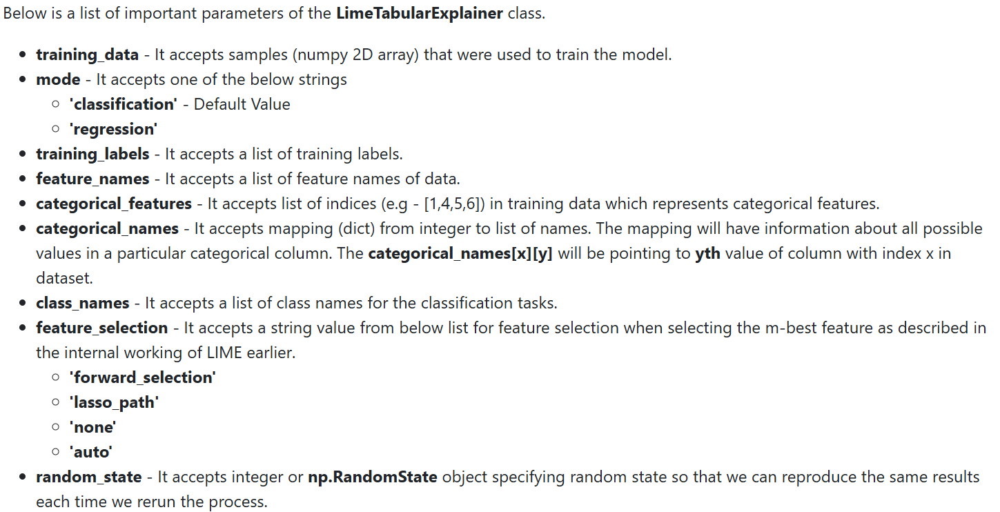

In [ ]:
# Usar LimeTabularExplainer para explicar el modelo
explainer = LimeTabularExplainer(
    training_data=X_train.values,
    mode='classification',
    training_labels=y_train,
    feature_names=X_train.columns.tolist(),
    class_names=['No incumplidor', 'Incumplidor'],
    discretize_continuous=True
)

In [ ]:
# Elegir una instancia del conjunto de test para explicar
instancia = X_test.iloc[10]

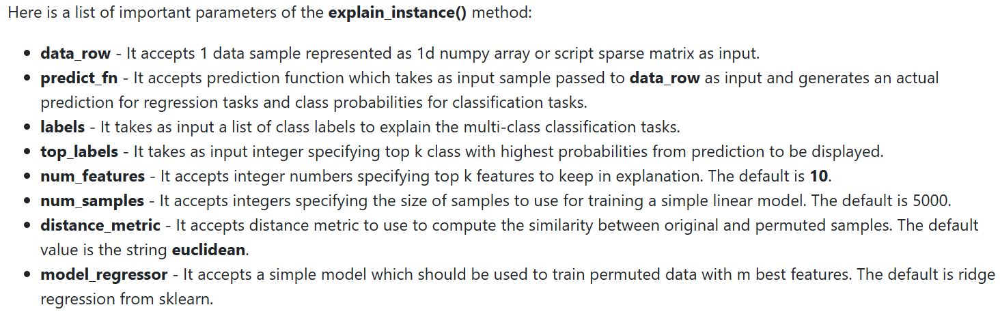

In [ ]:
# función para escalar los datos antes de meterselo a LIME, porque sino me daba el fallo de que ninguna variable pesaba.
def predict_proba_fn(x):
    x_scaled = scaler.transform(x)  # Usar el mismo que en el modelo
    return mlp1.predict_proba(x_scaled)

In [ ]:
# Explicar la predicción con LIME para esta instancia
explanation = explainer.explain_instance(
    data_row=instancia,
    predict_fn=predict_proba_fn,
    num_features=16
)

In [ ]:
print("Fidelidad local (R²):", explanation.score)
# representa la fidelidad del modelo local (lineal) al modelo original en esa vecindad local.
# En el caso de clasificación binaria, es el R² (coeficiente de determinación) del modelo lineal ajustado por LIME
# a las perturbaciones locales.

el modelo local explica el 38% de la variabilidad de las predicciones del MLP en esa vecindad.

Un valor cercano a 1.0 indica que el comportamiento local del MLP es bastante lineal y bien explicado por el modelo simple de LIME.



In [ ]:
# Elegir la instancia a analizar
i = 10  # por ejemplo, la número 9 del test
instancia = X_test.iloc[i]
instancia_scaled = X_test_scaled[i]  # versión escalada (si usas un scaler)

# Mostrar los valores originales de la instancia
display("Valores de la instancia:\n", instancia)

# Mostrar la predicción del modelo
pred_prob = mlp.predict_proba([instancia_scaled])[0]
pred_clase = mlp.predict([instancia_scaled])[0]

print("\nProbabilidades del modelo:")
print(f"No incumplidor (clase 0): {pred_prob[0]:.4f}")
print(f"Incumplidor (clase 1): {pred_prob[1]:.4f}")

print("\nPredicción final del modelo (umbral 0.5):", "Incumplidor" if pred_clase == 1 else "No incumplidor")


In [ ]:
# Suponiendo que estas dos columnas quieres variar:
var1 = 'loan_amnt'
var2 = 'person_income'

# Selecciona una instancia a explicar
instancia_np = instancia.values.reshape(1, -1)


# Inicializa el explicador
explainer = LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=X_train.columns.tolist(),
    class_names=['No incumplidor', 'Incumplidor'],
    training_labels=y_train,
    mode='classification',
    discretize_continuous=True
)

# Generar explicación local
exp = explainer.explain_instance(
    data_row=instancia,
    predict_fn=predict_proba_fn,
    num_features=10
)

# Creamos un grid para las dos variables que queremos variar
v1_range = np.linspace(X_train[var1].min(), X_train[var1].max(), 100)
v2_range = np.linspace(X_train[var2].min(), X_train[var2].max(), 100)
xx, yy = np.meshgrid(v1_range, v2_range)

# Crear matriz de puntos variando solo esas 2 variables
grid_data = np.tile(instancia.values, (xx.size, 1))
grid_data = grid_data.reshape(xx.size, -1)
idx_v1 = X_train.columns.get_loc(var1)
idx_v2 = X_train.columns.get_loc(var2)
grid_data[:, idx_v1] = xx.ravel()
grid_data[:, idx_v2] = yy.ravel()

# Obtener predicciones del modelo original
Z = predict_proba_fn(grid_data)[:, 1].reshape(xx.shape)

# Obtener predicciones del modelo local de LIME
lime_pred = exp.local_pred

# Visualización
plt.figure(figsize=(10, 8))
# Fondo de la predicción del modelo original
plt.contourf(xx, yy, Z, levels=25, cmap='coolwarm', alpha=0.6)

# Muestra la instancia real
plt.scatter(instancia[var1], instancia[var2], color='black', edgecolor='white', s=100, label='Instancia real')

# Añadir los puntos simulados por LIME
lime_data = exp.domain_mapper.feature_values
if hasattr(exp, 'mapped_data'):
    perturbed = exp.mapped_data[:, [idx_v1, idx_v2]]
    plt.scatter(perturbed[:, 0], perturbed[:, 1], c=exp.local_pred, cmap='bwr', s=20, label='Muestras LIME', alpha=0.6)

plt.xlabel(var1)
plt.ylabel(var2)
plt.title('Frente de decisión del MLP y modelo local de LIME')
plt.colorbar(label='Probabilidad de ser incumplidor')
plt.legend()
plt.grid(True)
plt.show()

Intentar graficar esto para la instancia a analizar:

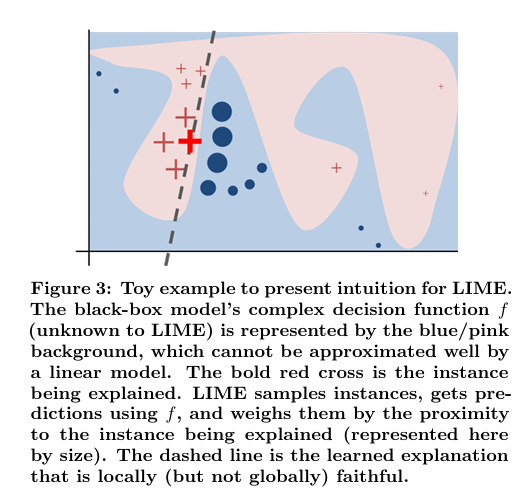

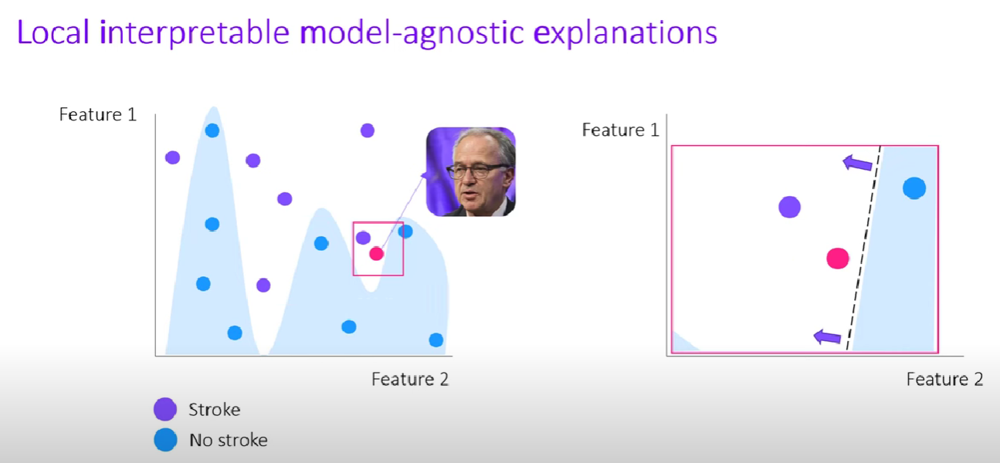

# Intentos:

## MLP (128, 64, 32)

In [ ]:
#  Arquitectura del MLP:
mlp2 = MLPClassifier(
    hidden_layer_sizes=(128, 64, 32),
    activation='relu',
    solver='adam',
    random_state=42,
    max_iter=600
)

# Entrenamiento del modelo:
mlp2.fit(X_train_scaled, y_train)


# Predicciones en el conjunto de test:
y_pred2 = mlp2.predict(X_test_scaled)
y_pred_proba2 = mlp2.predict_proba(X_test_scaled)[:, 1]  # Equivale a la PD

# predict_proba() te da un array de dos columnas:
# [:, 0]: Probabilidad de clase 0 (no incumplidor).
# [:, 1]: Probabilidad de clase 1 (incumplidor o default).

In [ ]:
# ROC & AUC
fpr, tpr, _ = roc_curve(y_test, y_pred_proba2)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.grid(True)
plt.show()

# ------------------------------
# Gini
gini = 2 * roc_auc - 1
print(f"Gini: {gini:.2f}")

# ------------------------------
# Precision-Recall Curve
precision2, recall2, _ = precision_recall_curve(y_test, y_pred_proba2)

plt.figure(figsize=(8, 6))
plt.plot(recall2, precision2, label="Precision-Recall Curve")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve")
plt.grid(True)
plt.show()

# ------------------------------
# Clasificación binaria (umbral = 0.5)
y_pred_label2 = (y_pred_proba2 >= 0.5).astype(int)
print("Classification Report:\n")
print(classification_report(y_test, y_pred_label2))

# ------------------------------
# Sensibilidad vs Especificidad por umbral
thresholds = np.linspace(0.01, 0.99, 100)
sensitivities2 = []
specificities2 = []

for t in thresholds:
    y_pred2 = (y_pred_proba2 >= t).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred2).ravel()
    sensitivities2.append(tp / (tp + fn))
    specificities2.append(tn / (tn + fp))

plt.figure(figsize=(8, 6))
plt.plot(thresholds, sensitivities2, label='Sensibilidad (TPR)')
plt.plot(thresholds, specificities2, label='Especificidad (TNR)')
plt.xlabel('Umbral')
plt.ylabel('Valor')
plt.title('Sensibilidad vs Especificidad')
plt.legend()
plt.grid(True)
plt.show()

Por defecto, el modelo toma un umbral de 0.5 para hacer la clasificación.

* Si $𝑃(incumplimiento)≥0.5$, la muestra se clasifica como incumplidor (1).

* Si $𝑃(incumplimiento)<0.5$, la muestra se clasifica como no incumplidor (0).

In [ ]:
# Definir los umbrales (de 0 a 1 con un paso de 0.01)
thresholds2 = np.arange(0.0, 1.0, 0.01)
f1_scores2 = []

# Calcular el F1 score para cada umbral
for threshold in thresholds2:
    # Predicción binaria usando el umbral
    y_pred = (y_pred_proba2 >= threshold).astype(int)
    # Calcular el F1 score
    f1 = f1_score(y_test, y_pred)
    f1_scores2.append(f1)

# Encontrar el umbral que da el mejor F1 score
best_f1 = max(f1_scores2)
best_threshold = thresholds2[f1_scores2.index(best_f1)]

# Imprimir el resultado
print(f"Mejor F1 score: {best_f1:.4f} en el umbral {best_threshold:.2f}")

# Graficar la curva F1 frente al umbral
plt.figure(figsize=(8, 6))
plt.plot(thresholds2, f1_scores2, label='Curva F1', color='blue')
plt.axvline(x=best_threshold, color='red', linestyle='--', label=f"Umbral óptimo = {best_threshold:.2f}")
plt.xlabel('Umbral')
plt.ylabel('F1 Score')
plt.title('Curva F1 frente al Umbral')
plt.legend()
plt.grid(True)
plt.show()

En el eje X tenemos el valor de corte sobre la probabilidad (predict_proba) a partir del cual decidimos que un ejemplo pertenece a la clase 1 (incumplidor, default).

Cuando el umbral = 0.0, todas las muestras son clasificadas como 1 (incumplidor), sin importar qué tan baja sea su probabilidad.
Esto significa que no se escapa ni un solo incumplidor, por eso el recall es 1.0 (perfecto), pero a costa de muchísimos falsos positivos.

A medida que subes el umbral, empiezas a exigir que la probabilidad sea más alta para etiquetar como 1:

Se reducen los falsos positivos, lo cual es bueno.

Pero también se empiezan a escapar verdaderos incumplidores, por lo tanto, el recall disminuye.



Optimizar por F1 o precision, si quieres minimizar falsos positivos (no rechazar buenos clientes).

In [ ]:
mlp2.score(X_test,y_test) # es el accuracy del modelo

Como no hay balance, el umbral por defecto de 0.5 quizás no sea óptimo.

Podés tunearlo para maximizar:

F1

MCC

ganancia esperada (si conocés costo-beneficio)



Gráfico Waterfall: Un gráfico visual donde cada barras representan la contribución de cada feature, empujando la predicción hacia 0 (no default) o 1 (default).

### LIME

In [ ]:
feature_names = X_train.columns.tolist()
class_names = ['No incumplidor', 'Incumplidor']

explainer = LimeTabularExplainer(
    training_data=X_train.values,             # 2D array con los datos de entrenamiento
    training_labels=y_train.values,           # Etiquetas (target) del entrenamiento
    mode='classification',                    # Tipo de tarea: clasificación
    feature_names=feature_names,              # Nombres de las características
    class_names=class_names,                  # Nombres de las clases (0 y 1)
    discretize_continuous=True,               # Discretizar variables continuas para interpretabilidad
    feature_selection='auto',                 # Estrategia de selección de variables explicativas
    random_state=42                           # Semilla para reproducibilidad
)

# Elegir una instancia del conjunto de test para explicar
instancia = X_test.iloc[150]

# función para escalar los datos antes de meterselo a LIME, porque sino me daba el fallo de que ninguna variable pesaba.
def predict_proba_fn(x):
    x_scaled = scaler.transform(x)  # Usar el mismo que en el modelo
    return mlp2.predict_proba(x_scaled)

explanation = explainer.explain_instance(
    data_row=instancia,                      # Muestra a explicar
    predict_fn=predict_proba_fn,             # Función que devuelve las probabilidades del modelo
    top_labels=None,                         # No se usa porque se especifican las labels manualmente
    num_features=10,                         # Número de variables (features) a mostrar en la explicación
    num_samples=5000,                        # Número de muestras perturbadas generadas para la explicación
    distance_metric='euclidean',             # Métrica de distancia usada para ponderar las muestras perturbadas
    model_regressor=None                     # Usamos la regresión ridge predeterminada de sklearn
)

# Mostrar la explicación
explanation.show_in_notebook(show_table=True, show_all=False)

print("Fidelidad local (R²):", explanation.score)

La hago correlacionada con la variable objetivo, de manera que el 75% de personas que cumplen los pagos no llevan gafas y el 75% de los incumplidores llevan gafas. De forma lógica es una característica externa que no da indicios de impagador, pero al encontrar un alto porcentaje de coincidencia los modelos pueden asumir patrones sin sentido. Veámos qué pasa:

In [ ]:
def asignar_glasses(df, objetivo='loan_status', prob_match=0.75, random_state=42):
    np.random.seed(random_state)
    glasses = []

    for status in df[objetivo]:
        if status == 1:
            # 75% de los incumplidores llevarán gafas (1), el resto no (0)
            glasses.append(np.random.choice([1, 0], p=[prob_match, 1 - prob_match]))
        else:
            # 75% de los cumplidores NO llevarán gafas (0), el resto sí (1)
            glasses.append(np.random.choice([0, 1], p=[prob_match, 1 - prob_match]))

    return glasses

# Añadimos esta variable al df:
df_train['glasses'] = asignar_glasses(df_train)
df_test['glasses'] = asignar_glasses(df_test)

Hacemos un modelo MLP:

In [ ]:
# Separar variables y objetivo
X_train = df_train.drop(columns=['loan_status', 'diff_hist_age', 'log_person_income', 'start_work_age', 'loan_grade'])
y_train = df_train['loan_status']

X_test = df_test.drop(columns=['loan_status', 'loan_grade'], axis=1)
y_test = df_test['loan_status']

# Escalar
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#  Arquitectura del MLP
mlp = MLPClassifier(
    hidden_layer_sizes=(128, 64, 32),
    activation='relu',
    solver='adam',
    random_state=42,
    max_iter=600
)

# Entrenamiento
mlp.fit(X_train_scaled, y_train)


# Predicciones
y_pred = mlp.predict(X_test_scaled)
y_pred_proba = mlp.predict_proba(X_test_scaled)[:, 1]  # Equivale a la PD

Aplicamos LIME a una instancia concreta del conjunto de prueba:

## XGBoost

In [ ]:
# Crear el modelo
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)

# Entrenar
xgb_model.fit(X_train_scaled, y_train)

# Evaluar
y_pred = xgb_model.predict(X_test_scaled)
print(classification_report(y_test, y_pred))

## Random Forest

In [ ]:
# Crear el modelo Random Forest
rf = RandomForestClassifier(
    n_estimators=500,
    max_depth=20,
    random_state=42
)

# Entrenar el modelo con tus datos escalados (balanceados o no)
rf.fit(X_train_scaled, y_train)

# Hacer predicciones y probabilidades en test
y_pred_rf = rf.predict(X_test_scaled)
y_proba_rf = rf.predict_proba(X_test_scaled)[:, 1]

# Evaluar
print(classification_report(y_test, y_pred_rf))
print(confusion_matrix(y_test, y_pred_rf))
print(f"AUC: {roc_auc_score(y_test, y_proba_rf):.2f}")

### LIME

In [ ]:
feature_names = X_train.columns.tolist()
class_names = ['No incumplidor', 'Incumplidor']

explainer = LimeTabularExplainer(
    training_data=X_train.values,             # 2D array con los datos de entrenamiento
    training_labels=y_train.values,           # Etiquetas (target) del entrenamiento
    mode='classification',                    # Tipo de tarea: clasificación
    feature_names=feature_names,              # Nombres de las características
    class_names=class_names,                  # Nombres de las clases (0 y 1)
    discretize_continuous=True,               # Discretizar variables continuas para interpretabilidad
    feature_selection='auto',                 # Estrategia de selección de variables explicativas
    random_state=42                           # Semilla para reproducibilidad
)

# Elegir una instancia del conjunto de test para explicar
instancia = X_test.iloc[150]

# función para escalar los datos antes de meterselo a LIME, porque sino me daba el fallo de que ninguna variable pesaba.
def predict_proba_fn(x):
    x_scaled = scaler.transform(x)  # Usar el mismo que en el modelo
    return rf.predict_proba(x_scaled)

explanation = explainer.explain_instance(
    data_row=instancia,                      # Muestra a explicar
    predict_fn=predict_proba_fn,             # Función que devuelve las probabilidades del modelo
    top_labels=None,                         # No se usa porque se especifican las labels manualmente
    num_features=10,                         # Número de variables (features) a mostrar en la explicación
    num_samples=5000,                        # Número de muestras perturbadas generadas para la explicación
    distance_metric='euclidean',             # Métrica de distancia usada para ponderar las muestras perturbadas
    model_regressor=None                     # Usamos la regresión ridge predeterminada de sklearn
)

# Mostrar la explicación
explanation.show_in_notebook(show_table=True, show_all=False)

print("Fidelidad local (R²):", explanation.score)

In [ ]:
lime_scores = []
instancias = []

for i in range(len(X_test)):
    instancia = X_test.iloc[i]

    explanation = explainer.explain_instance(
        data_row=instancia,
        predict_fn=predict_proba_fn,
        num_features=10,
        num_samples=5000,
        distance_metric='euclidean'
    )

    lime_scores.append(explanation.score)
    instancias.append(i)

# Convertimos a DataFrame para analizar
lime_df = pd.DataFrame({'index': instancias, 'score': lime_scores})

# Contar cuántas tienen score > 0.5 y > 0.4
mayor_05 = (lime_df['score'] > 0.5).sum()
mayor_04 = (lime_df['score'] > 0.4).sum()

# Encontrar instancia con mayor score
mejor_idx = lime_df.loc[lime_df['score'].idxmax(), 'index']
mejor_score = lime_df['score'].max()

print(f"Instancias con score > 0.5: {mayor_05}")
print(f"Instancias con score > 0.4: {mayor_04}")
print(f"Mayor score de LIME: {mejor_score:.4f} (instancia #{mejor_idx})")

In [ ]:
# 1. Separar clases
df_majority = df_train[df_train['loan_status'] == 0]
df_minority = df_train[df_train['loan_status'] == 1]

# 2. Obtener tamaño de la clase minoritaria
n_minority = len(df_minority)

# 3. Hacer undersampling aleatorio en clase mayoritaria
df_majority_downsampled = df_majority.sample(n=n_minority, random_state=42)

# 4. Unir los dos dataframes balanceados
df_train_balanced = pd.concat([df_majority_downsampled, df_minority])

# 5. Mezclar las filas (shuffle)
df_train_balanced = df_train_balanced.sample(frac=1, random_state=42).reset_index(drop=True)

# 6. Separar X e y para entrenamiento balanceado
X_train_balanced = df_train_balanced.drop(columns=['loan_status'])
y_train_balanced = df_train_balanced['loan_status']

# 7. Escalar
scaler = MinMaxScaler()
X_train_balanced_scaled = scaler.fit_transform(X_train_balanced)
X_test_scaled = scaler.transform(X_test)  # El test lo escalas igual que antes

print("Clases balanceadas en entrenamiento:", np.bincount(y_train_balanced))

In [ ]:
# Variables que quieres variar (asegúrate que están en selected_features)
var1 = 'loan_int_rate'
var2 = 'loan_percent_income'

# Generar la explicación local con LIME
exp = explainer.explain_instance(
    data_row=instance.values,
    predict_fn=best_model_balanced.predict_proba,
    num_samples=10000,
    num_features=10
)

# Para la visualización de la superficie de predicción del modelo original:

# Crear rango para variables a variar
v1_range = np.linspace(X_train_balanced[var1].min(), X_train_balanced[var1].max(), 100)
v2_range = np.linspace(X_train_balanced[var2].min(), X_train_balanced[var2].max(), 100)
xx, yy = np.meshgrid(v1_range, v2_range)

# Crear matriz para grid variando solo var1 y var2
grid_data = np.tile(instance.values, (xx.size, 1))
idx_v1 = selected_features.get_loc(var1)
idx_v2 = selected_features.get_loc(var2)
grid_data[:, idx_v1] = xx.ravel()
grid_data[:, idx_v2] = yy.ravel()

# Obtener predicciones del pipeline (ya aplica escalado)
Z = best_model_balanced.predict_proba(grid_data)[:, 1].reshape(xx.shape)

# Visualización
plt.figure(figsize=(10, 8))
cmap = plt.cm.viridis  # o el que prefieras, pero que sea el mismo para todo
plt.contourf(xx, yy, Z, levels=25, cmap=cmap, alpha=0.6)
plt.colorbar(label='Probabilidad de Default', cmap=cmap)

plt.scatter(instance[var1], instance[var2], color='black', edgecolor='white', s=100, label='Instancia real')

# Mostrar las muestras perturbadas usadas por LIME solo para las dos variables seleccionadas
if hasattr(exp, 'mapped_data'):
    perturbed = exp.mapped_data[:, [idx_v1, idx_v2]]
    plt.scatter(perturbed[:, 0], perturbed[:, 1], c=exp.local_pred, cmap='bwr', s=20, alpha=0.6, label='Muestras LIME')

plt.xlabel(var1)
plt.ylabel(var2)
plt.title('Frente de decisión del modelo y explicación local LIME')
plt.colorbar(label='Probabilidad de Default')
plt.legend()
plt.grid(True)
plt.show()